In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


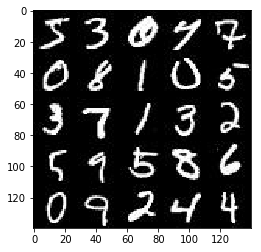

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

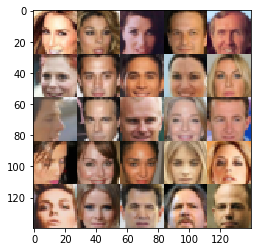

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0


C:\Users\Alexander\Anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:14: UserWarning: No GPU found. Please use a GPU to train your neural network.
  


Whatever this test says, I have a GPU on my laptop and I am going to use it.

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    inputs_img = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_img') 
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32, name = 'learning_rate')
    

    return inputs_img, inputs_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


First I start with the simplest possible model - just one dense layer both in generator and discriminator:

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    n_units=128
    alpha=0.01
    with tf.variable_scope('discriminator', reuse=reuse):
        # Hidden layer
        images_flat = tf.contrib.layers.flatten(images)
        h1 = tf.layers.dense(images_flat, n_units, activation=None)
        
        # Leaky ReLU
        h1 = tf.maximum(alpha * h1, h1)
        
        logits = tf.layers.dense(h1, 1, activation=None)
        
        out = tf.sigmoid(logits)
        
        return out, logits

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    alpha=0.01
    n_units=128
    reuse = not is_train
    with tf.variable_scope('generator', reuse=reuse):
        # Hidden layer
        h1 = tf.layers.dense(z, n_units, activation=None)
        # Leaky ReLU
        h1 = tf.maximum(alpha * h1, h1)
        
        # Logits and tanh output
        logits = tf.layers.dense(h1, 28*28*out_channel_dim, activation=None)
        out_flat = tf.tanh(logits)
        out = tf.reshape(out_flat, shape = [tf.shape(out_flat)[0], 28, 28, out_channel_dim])
        
        return out
    
   


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


In fact, alpha is a hyper-parameter which should be tuned. So it must be passed as an argument to the generator and discriminator. Unfortunately it is not. So I had to dive into the functions and change alpha when training the models. Another option - to make alpha global seems even a worse choice.

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    
    # Build the model
    g_model = generator(input_z, out_channel_dim)
    # g_model is the generator output

    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    smooth = 0.1
    
    d_loss_real = tf.reduce_mean(
                  tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, 
                                                          labels=tf.ones_like(d_logits_real) * (1 - smooth)))
    d_loss_fake = tf.reduce_mean(
                  tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, 
                                                          labels=tf.zeros_like(d_logits_real)))
    d_loss = d_loss_real + d_loss_fake
    
    g_loss = tf.reduce_mean(
             tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                     labels=tf.ones_like(d_logits_fake)))
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


The tensorflow documentation [suggests](https://www.tensorflow.org/api_docs/python/tf/layers/batch_normalization) to use dependencies for batch normalization. I do not fully understand what it means so I just copied tf.control_dependencies from here: https://discussions.udacity.com/t/generator-loss-is-bigger-than-discriminator-loss-generated-images-are-poor-quality/312533/2

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    
    # Borrowed from:
    # https://discussions.udacity.com/t/generator-loss-is-bigger-than-discriminator-loss-generated-images-are-poor-quality/312533/2
    # https://www.tensorflow.org/api_docs/python/tf/layers/batch_normalization
    
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

tests.test_model_opt(model_opt, tf)

Tests Passed


In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    samples = []
    losses = []
    steps = 0
    
    input_real, input_z, learn_rate = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    
    gpu_options = tf.GPUOptions(per_process_gpu_memory_fraction=0.5)
    with tf.Session(config=tf.ConfigProto(gpu_options=gpu_options)) as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps += 1
                
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                _ = sess.run(d_train_opt, feed_dict={input_z: batch_z, input_real: batch_images})
                _ = sess.run(g_train_opt, feed_dict={input_z: batch_z, input_real: batch_images})
                
                if steps % 10 == 0:
                    train_loss_d = sess.run(d_loss, feed_dict={input_real: batch_images, input_z: batch_z})
                    train_loss_g = g_loss.eval({input_z: batch_z})
                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                
                if steps % 100 == 0:
                    show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode)
                

Probably you noticed some cheating: I use learning_rate as a float variable which I get from arguments of the train function. It is not a tensor (tf.float32). I tried to use learn_rate produced by model_inputs in several ways each time I got some Error. So I used learning_rate instead. Training the models takes a lot of time. I could not afford to spend time on this issue. Some day (down the road) I'll learn how to tackle the issue, but not today. At the end of the day, this is the project on GANs , not on transfer of parameters into a tf model.

Epoch 1/1... Discriminator Loss: 0.9392... Generator Loss: 0.9468
Epoch 1/1... Discriminator Loss: 0.7205... Generator Loss: 1.9819
Epoch 1/1... Discriminator Loss: 0.5380... Generator Loss: 2.1437
Epoch 1/1... Discriminator Loss: 0.5066... Generator Loss: 2.5029
Epoch 1/1... Discriminator Loss: 0.4545... Generator Loss: 3.6360
Epoch 1/1... Discriminator Loss: 0.3994... Generator Loss: 7.3646
Epoch 1/1... Discriminator Loss: 0.3748... Generator Loss: 8.9478
Epoch 1/1... Discriminator Loss: 0.4308... Generator Loss: 8.6453
Epoch 1/1... Discriminator Loss: 0.3594... Generator Loss: 10.4633
Epoch 1/1... Discriminator Loss: 0.3582... Generator Loss: 9.2251


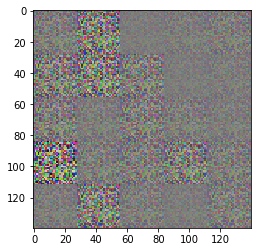

Epoch 1/1... Discriminator Loss: 0.3614... Generator Loss: 7.3370
Epoch 1/1... Discriminator Loss: 0.3719... Generator Loss: 6.1079
Epoch 1/1... Discriminator Loss: 0.3830... Generator Loss: 5.0480
Epoch 1/1... Discriminator Loss: 0.4064... Generator Loss: 3.4675
Epoch 1/1... Discriminator Loss: 0.3628... Generator Loss: 3.7376
Epoch 1/1... Discriminator Loss: 0.3771... Generator Loss: 3.2781
Epoch 1/1... Discriminator Loss: 0.3990... Generator Loss: 2.9576
Epoch 1/1... Discriminator Loss: 0.5144... Generator Loss: 1.8504
Epoch 1/1... Discriminator Loss: 0.5160... Generator Loss: 1.9205
Epoch 1/1... Discriminator Loss: 0.4764... Generator Loss: 2.4180


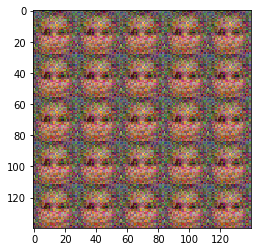

Epoch 1/1... Discriminator Loss: 0.6233... Generator Loss: 1.5632
Epoch 1/1... Discriminator Loss: 0.4922... Generator Loss: 2.2797
Epoch 1/1... Discriminator Loss: 0.4834... Generator Loss: 2.4555
Epoch 1/1... Discriminator Loss: 0.4745... Generator Loss: 2.3032
Epoch 1/1... Discriminator Loss: 0.4022... Generator Loss: 3.0368
Epoch 1/1... Discriminator Loss: 0.3805... Generator Loss: 4.2198
Epoch 1/1... Discriminator Loss: 0.3699... Generator Loss: 4.2360
Epoch 1/1... Discriminator Loss: 0.3922... Generator Loss: 3.1316
Epoch 1/1... Discriminator Loss: 0.3947... Generator Loss: 3.4889
Epoch 1/1... Discriminator Loss: 0.4346... Generator Loss: 2.7016


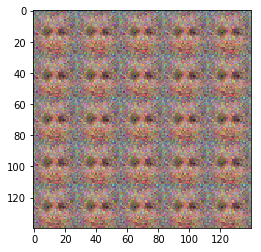

Epoch 1/1... Discriminator Loss: 0.3776... Generator Loss: 4.2978
Epoch 1/1... Discriminator Loss: 0.3724... Generator Loss: 4.3935
Epoch 1/1... Discriminator Loss: 0.4178... Generator Loss: 2.9911
Epoch 1/1... Discriminator Loss: 0.4292... Generator Loss: 2.9567
Epoch 1/1... Discriminator Loss: 0.4741... Generator Loss: 2.6210
Epoch 1/1... Discriminator Loss: 0.4402... Generator Loss: 2.8824
Epoch 1/1... Discriminator Loss: 0.4974... Generator Loss: 2.3104
Epoch 1/1... Discriminator Loss: 0.4862... Generator Loss: 2.9707
Epoch 1/1... Discriminator Loss: 0.4474... Generator Loss: 2.9945
Epoch 1/1... Discriminator Loss: 0.4604... Generator Loss: 2.6935


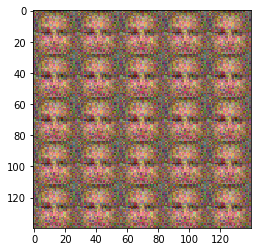

Epoch 1/1... Discriminator Loss: 0.3718... Generator Loss: 5.4443
Epoch 1/1... Discriminator Loss: 0.4067... Generator Loss: 3.7184
Epoch 1/1... Discriminator Loss: 0.4219... Generator Loss: 3.3100
Epoch 1/1... Discriminator Loss: 0.3935... Generator Loss: 3.8361
Epoch 1/1... Discriminator Loss: 0.3647... Generator Loss: 4.5308
Epoch 1/1... Discriminator Loss: 0.3764... Generator Loss: 4.2219
Epoch 1/1... Discriminator Loss: 0.3672... Generator Loss: 5.0240
Epoch 1/1... Discriminator Loss: 0.3657... Generator Loss: 4.1865
Epoch 1/1... Discriminator Loss: 0.3845... Generator Loss: 3.8865
Epoch 1/1... Discriminator Loss: 0.3886... Generator Loss: 3.7845


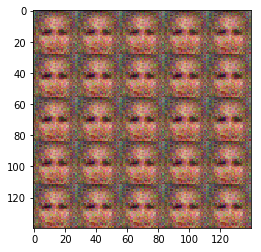

Epoch 1/1... Discriminator Loss: 0.3889... Generator Loss: 3.7340
Epoch 1/1... Discriminator Loss: 0.3683... Generator Loss: 4.2874
Epoch 1/1... Discriminator Loss: 0.3852... Generator Loss: 4.4867
Epoch 1/1... Discriminator Loss: 0.4054... Generator Loss: 3.7972
Epoch 1/1... Discriminator Loss: 0.3662... Generator Loss: 4.2198
Epoch 1/1... Discriminator Loss: 0.4143... Generator Loss: 3.3858
Epoch 1/1... Discriminator Loss: 0.4102... Generator Loss: 3.2051
Epoch 1/1... Discriminator Loss: 0.3967... Generator Loss: 3.7512
Epoch 1/1... Discriminator Loss: 0.4582... Generator Loss: 2.8935
Epoch 1/1... Discriminator Loss: 0.4598... Generator Loss: 3.9655


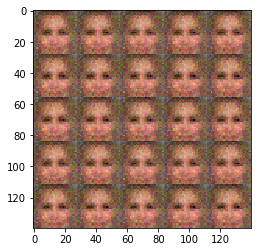

Epoch 1/1... Discriminator Loss: 0.4214... Generator Loss: 3.9603
Epoch 1/1... Discriminator Loss: 0.4181... Generator Loss: 3.5422
Epoch 1/1... Discriminator Loss: 0.4224... Generator Loss: 3.3629
Epoch 1/1... Discriminator Loss: 0.4679... Generator Loss: 2.7461
Epoch 1/1... Discriminator Loss: 0.3851... Generator Loss: 5.3699
Epoch 1/1... Discriminator Loss: 0.4337... Generator Loss: 3.3091
Epoch 1/1... Discriminator Loss: 0.4755... Generator Loss: 2.9055
Epoch 1/1... Discriminator Loss: 0.3882... Generator Loss: 4.6292
Epoch 1/1... Discriminator Loss: 0.4026... Generator Loss: 3.6125
Epoch 1/1... Discriminator Loss: 0.5144... Generator Loss: 2.5744


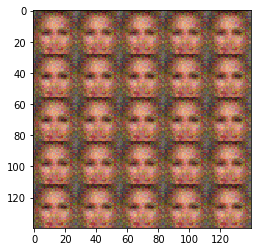

Epoch 1/1... Discriminator Loss: 0.4005... Generator Loss: 4.2093
Epoch 1/1... Discriminator Loss: 0.4373... Generator Loss: 3.6359
Epoch 1/1... Discriminator Loss: 0.4363... Generator Loss: 4.0387
Epoch 1/1... Discriminator Loss: 0.4453... Generator Loss: 5.4880
Epoch 1/1... Discriminator Loss: 0.4376... Generator Loss: 5.0847
Epoch 1/1... Discriminator Loss: 0.4105... Generator Loss: 6.2124
Epoch 1/1... Discriminator Loss: 0.4112... Generator Loss: 5.2948
Epoch 1/1... Discriminator Loss: 0.3879... Generator Loss: 4.3409
Epoch 1/1... Discriminator Loss: 0.4292... Generator Loss: 3.9403
Epoch 1/1... Discriminator Loss: 0.4247... Generator Loss: 3.9856


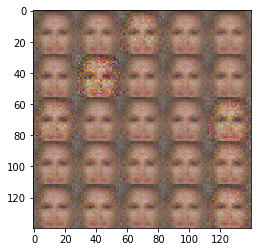

Epoch 1/1... Discriminator Loss: 0.4151... Generator Loss: 3.3717
Epoch 1/1... Discriminator Loss: 0.4251... Generator Loss: 4.2839
Epoch 1/1... Discriminator Loss: 0.4505... Generator Loss: 4.3291
Epoch 1/1... Discriminator Loss: 0.4877... Generator Loss: 3.3435
Epoch 1/1... Discriminator Loss: 0.5331... Generator Loss: 3.0311
Epoch 1/1... Discriminator Loss: 0.4584... Generator Loss: 3.8397
Epoch 1/1... Discriminator Loss: 0.4364... Generator Loss: 4.4081
Epoch 1/1... Discriminator Loss: 0.4530... Generator Loss: 3.6774
Epoch 1/1... Discriminator Loss: 0.4631... Generator Loss: 3.5820
Epoch 1/1... Discriminator Loss: 0.5831... Generator Loss: 4.0330


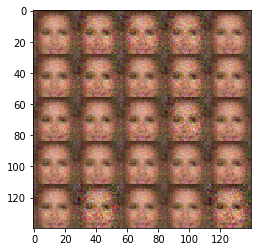

Epoch 1/1... Discriminator Loss: 0.4633... Generator Loss: 3.7388
Epoch 1/1... Discriminator Loss: 0.5156... Generator Loss: 3.3339
Epoch 1/1... Discriminator Loss: 0.4444... Generator Loss: 3.4661
Epoch 1/1... Discriminator Loss: 0.4721... Generator Loss: 2.8929
Epoch 1/1... Discriminator Loss: 0.4995... Generator Loss: 3.0381
Epoch 1/1... Discriminator Loss: 0.6053... Generator Loss: 2.6472
Epoch 1/1... Discriminator Loss: 0.5734... Generator Loss: 2.9431
Epoch 1/1... Discriminator Loss: 0.4732... Generator Loss: 4.0164
Epoch 1/1... Discriminator Loss: 0.5117... Generator Loss: 3.6771
Epoch 1/1... Discriminator Loss: 0.5440... Generator Loss: 2.8001


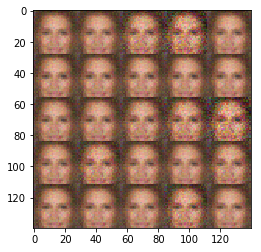

Epoch 1/1... Discriminator Loss: 0.5943... Generator Loss: 2.9605
Epoch 1/1... Discriminator Loss: 0.4338... Generator Loss: 6.3341
Epoch 1/1... Discriminator Loss: 0.4557... Generator Loss: 4.1842
Epoch 1/1... Discriminator Loss: 0.5632... Generator Loss: 3.4705
Epoch 1/1... Discriminator Loss: 0.5490... Generator Loss: 3.3776
Epoch 1/1... Discriminator Loss: 0.5271... Generator Loss: 4.6296
Epoch 1/1... Discriminator Loss: 0.4419... Generator Loss: 4.9127
Epoch 1/1... Discriminator Loss: 0.5414... Generator Loss: 3.0369
Epoch 1/1... Discriminator Loss: 0.5575... Generator Loss: 2.8856
Epoch 1/1... Discriminator Loss: 0.6056... Generator Loss: 2.4081


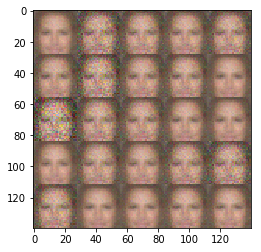

Epoch 1/1... Discriminator Loss: 0.4638... Generator Loss: 3.6162
Epoch 1/1... Discriminator Loss: 0.5000... Generator Loss: 2.7780
Epoch 1/1... Discriminator Loss: 0.4841... Generator Loss: 3.4139
Epoch 1/1... Discriminator Loss: 0.4485... Generator Loss: 5.0528
Epoch 1/1... Discriminator Loss: 0.5766... Generator Loss: 1.9958
Epoch 1/1... Discriminator Loss: 0.5972... Generator Loss: 2.9890
Epoch 1/1... Discriminator Loss: 0.4425... Generator Loss: 3.7823
Epoch 1/1... Discriminator Loss: 0.5221... Generator Loss: 4.4926
Epoch 1/1... Discriminator Loss: 0.4405... Generator Loss: 4.3214
Epoch 1/1... Discriminator Loss: 0.4947... Generator Loss: 3.4617


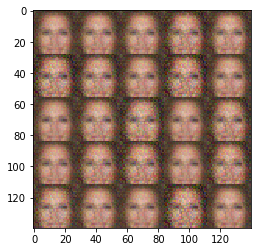

Epoch 1/1... Discriminator Loss: 0.4540... Generator Loss: 4.3211
Epoch 1/1... Discriminator Loss: 0.4713... Generator Loss: 3.3090
Epoch 1/1... Discriminator Loss: 0.5568... Generator Loss: 4.0105
Epoch 1/1... Discriminator Loss: 0.5559... Generator Loss: 5.2883
Epoch 1/1... Discriminator Loss: 0.5866... Generator Loss: 3.1251
Epoch 1/1... Discriminator Loss: 0.4324... Generator Loss: 4.3566
Epoch 1/1... Discriminator Loss: 0.4891... Generator Loss: 4.5151
Epoch 1/1... Discriminator Loss: 0.5188... Generator Loss: 2.6225
Epoch 1/1... Discriminator Loss: 0.4611... Generator Loss: 3.4950
Epoch 1/1... Discriminator Loss: 0.5127... Generator Loss: 3.6881


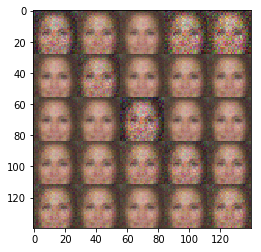

Epoch 1/1... Discriminator Loss: 0.4719... Generator Loss: 3.5901
Epoch 1/1... Discriminator Loss: 0.5519... Generator Loss: 3.0851
Epoch 1/1... Discriminator Loss: 0.5348... Generator Loss: 3.2891
Epoch 1/1... Discriminator Loss: 0.5430... Generator Loss: 5.0762
Epoch 1/1... Discriminator Loss: 0.6409... Generator Loss: 3.5872
Epoch 1/1... Discriminator Loss: 0.5108... Generator Loss: 4.2353
Epoch 1/1... Discriminator Loss: 0.4887... Generator Loss: 3.3707
Epoch 1/1... Discriminator Loss: 0.5449... Generator Loss: 3.1135
Epoch 1/1... Discriminator Loss: 0.5668... Generator Loss: 3.3475
Epoch 1/1... Discriminator Loss: 0.7986... Generator Loss: 2.8528


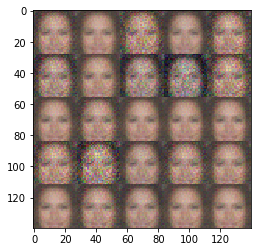

Epoch 1/1... Discriminator Loss: 0.6167... Generator Loss: 3.3284
Epoch 1/1... Discriminator Loss: 0.5608... Generator Loss: 4.1664
Epoch 1/1... Discriminator Loss: 0.5192... Generator Loss: 3.7452
Epoch 1/1... Discriminator Loss: 0.4780... Generator Loss: 3.2480
Epoch 1/1... Discriminator Loss: 0.7142... Generator Loss: 2.1742
Epoch 1/1... Discriminator Loss: 0.5686... Generator Loss: 3.0600
Epoch 1/1... Discriminator Loss: 0.5900... Generator Loss: 2.6982
Epoch 1/1... Discriminator Loss: 0.5113... Generator Loss: 4.2985
Epoch 1/1... Discriminator Loss: 0.4626... Generator Loss: 2.9323
Epoch 1/1... Discriminator Loss: 0.5059... Generator Loss: 3.4433


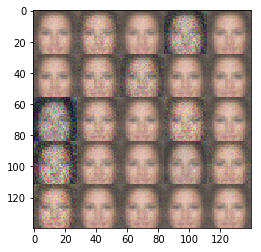

Epoch 1/1... Discriminator Loss: 0.8592... Generator Loss: 1.8996
Epoch 1/1... Discriminator Loss: 0.5389... Generator Loss: 3.2019
Epoch 1/1... Discriminator Loss: 0.6097... Generator Loss: 2.6624
Epoch 1/1... Discriminator Loss: 0.6416... Generator Loss: 3.2911
Epoch 1/1... Discriminator Loss: 0.6032... Generator Loss: 3.0729
Epoch 1/1... Discriminator Loss: 0.5346... Generator Loss: 3.3069
Epoch 1/1... Discriminator Loss: 0.5810... Generator Loss: 3.3333
Epoch 1/1... Discriminator Loss: 0.5106... Generator Loss: 4.2170
Epoch 1/1... Discriminator Loss: 0.6331... Generator Loss: 2.9203
Epoch 1/1... Discriminator Loss: 1.0404... Generator Loss: 1.9569


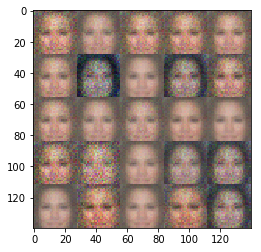

Epoch 1/1... Discriminator Loss: 0.5445... Generator Loss: 5.3101
Epoch 1/1... Discriminator Loss: 0.5565... Generator Loss: 2.5404
Epoch 1/1... Discriminator Loss: 0.7306... Generator Loss: 1.6990
Epoch 1/1... Discriminator Loss: 0.5346... Generator Loss: 4.7935
Epoch 1/1... Discriminator Loss: 0.5698... Generator Loss: 3.7959
Epoch 1/1... Discriminator Loss: 0.5771... Generator Loss: 3.1757
Epoch 1/1... Discriminator Loss: 0.4623... Generator Loss: 4.1429
Epoch 1/1... Discriminator Loss: 0.5135... Generator Loss: 4.2599
Epoch 1/1... Discriminator Loss: 0.5069... Generator Loss: 3.5834
Epoch 1/1... Discriminator Loss: 0.4934... Generator Loss: 3.6822


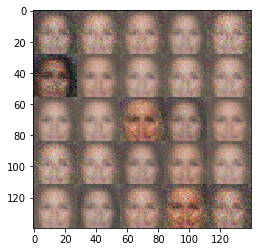

Epoch 1/1... Discriminator Loss: 0.5219... Generator Loss: 3.0428
Epoch 1/1... Discriminator Loss: 0.8540... Generator Loss: 1.8824
Epoch 1/1... Discriminator Loss: 0.7404... Generator Loss: 2.8396
Epoch 1/1... Discriminator Loss: 0.7131... Generator Loss: 3.3846
Epoch 1/1... Discriminator Loss: 0.5377... Generator Loss: 5.1218
Epoch 1/1... Discriminator Loss: 0.4834... Generator Loss: 5.8133
Epoch 1/1... Discriminator Loss: 0.5180... Generator Loss: 3.9330
Epoch 1/1... Discriminator Loss: 0.6756... Generator Loss: 3.5649
Epoch 1/1... Discriminator Loss: 0.7871... Generator Loss: 3.4640
Epoch 1/1... Discriminator Loss: 0.6697... Generator Loss: 3.7724


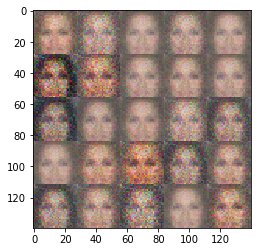

Epoch 1/1... Discriminator Loss: 0.6361... Generator Loss: 6.3872
Epoch 1/1... Discriminator Loss: 0.7342... Generator Loss: 3.2801
Epoch 1/1... Discriminator Loss: 0.6519... Generator Loss: 3.4181
Epoch 1/1... Discriminator Loss: 0.5611... Generator Loss: 5.1848
Epoch 1/1... Discriminator Loss: 0.5469... Generator Loss: 4.7058
Epoch 1/1... Discriminator Loss: 0.6535... Generator Loss: 3.6791
Epoch 1/1... Discriminator Loss: 0.7526... Generator Loss: 4.3519
Epoch 1/1... Discriminator Loss: 0.6170... Generator Loss: 5.4173
Epoch 1/1... Discriminator Loss: 0.6526... Generator Loss: 5.1363
Epoch 1/1... Discriminator Loss: 0.4569... Generator Loss: 6.4369


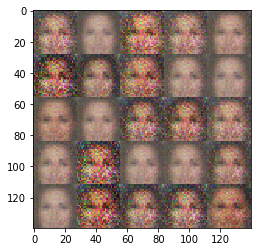

Epoch 1/1... Discriminator Loss: 0.5442... Generator Loss: 3.7918
Epoch 1/1... Discriminator Loss: 0.5875... Generator Loss: 4.0924
Epoch 1/1... Discriminator Loss: 0.5573... Generator Loss: 3.6120
Epoch 1/1... Discriminator Loss: 0.7239... Generator Loss: 4.0936
Epoch 1/1... Discriminator Loss: 0.6843... Generator Loss: 5.5772
Epoch 1/1... Discriminator Loss: 0.6331... Generator Loss: 3.6756
Epoch 1/1... Discriminator Loss: 0.7564... Generator Loss: 6.3590
Epoch 1/1... Discriminator Loss: 0.6854... Generator Loss: 2.5974
Epoch 1/1... Discriminator Loss: 0.7239... Generator Loss: 3.2055
Epoch 1/1... Discriminator Loss: 0.8141... Generator Loss: 4.4034


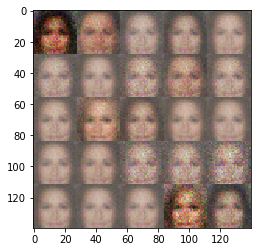

Epoch 1/1... Discriminator Loss: 0.6019... Generator Loss: 5.8312
Epoch 1/1... Discriminator Loss: 0.6386... Generator Loss: 3.2288
Epoch 1/1... Discriminator Loss: 0.8221... Generator Loss: 3.0126
Epoch 1/1... Discriminator Loss: 0.7511... Generator Loss: 3.3124
Epoch 1/1... Discriminator Loss: 0.8353... Generator Loss: 4.6360
Epoch 1/1... Discriminator Loss: 0.7098... Generator Loss: 5.0184
Epoch 1/1... Discriminator Loss: 0.8538... Generator Loss: 2.1850
Epoch 1/1... Discriminator Loss: 0.7951... Generator Loss: 4.0738
Epoch 1/1... Discriminator Loss: 0.6906... Generator Loss: 3.9174
Epoch 1/1... Discriminator Loss: 0.5635... Generator Loss: 3.6286


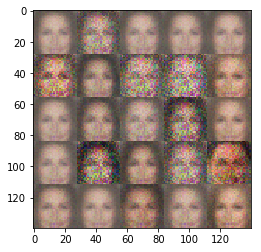

Epoch 1/1... Discriminator Loss: 0.6125... Generator Loss: 4.8101
Epoch 1/1... Discriminator Loss: 0.5062... Generator Loss: 3.4243
Epoch 1/1... Discriminator Loss: 0.5652... Generator Loss: 2.9963
Epoch 1/1... Discriminator Loss: 0.8801... Generator Loss: 2.9564
Epoch 1/1... Discriminator Loss: 0.7353... Generator Loss: 3.3446
Epoch 1/1... Discriminator Loss: 0.5482... Generator Loss: 3.9765
Epoch 1/1... Discriminator Loss: 0.8364... Generator Loss: 4.9657
Epoch 1/1... Discriminator Loss: 0.5301... Generator Loss: 4.9115
Epoch 1/1... Discriminator Loss: 0.5370... Generator Loss: 4.9098
Epoch 1/1... Discriminator Loss: 0.5120... Generator Loss: 6.3351


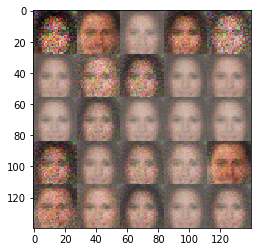

Epoch 1/1... Discriminator Loss: 1.1179... Generator Loss: 4.7925
Epoch 1/1... Discriminator Loss: 0.8449... Generator Loss: 4.7263
Epoch 1/1... Discriminator Loss: 0.8744... Generator Loss: 4.7721
Epoch 1/1... Discriminator Loss: 0.8783... Generator Loss: 4.2430
Epoch 1/1... Discriminator Loss: 0.5918... Generator Loss: 4.9433
Epoch 1/1... Discriminator Loss: 0.6626... Generator Loss: 3.5214
Epoch 1/1... Discriminator Loss: 0.8734... Generator Loss: 2.5449
Epoch 1/1... Discriminator Loss: 1.1805... Generator Loss: 3.5001
Epoch 1/1... Discriminator Loss: 0.8790... Generator Loss: 2.5308
Epoch 1/1... Discriminator Loss: 0.6810... Generator Loss: 4.0802


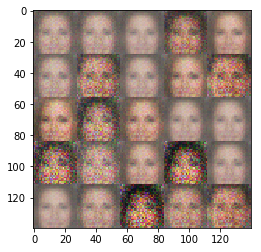

Epoch 1/1... Discriminator Loss: 0.5035... Generator Loss: 4.4650
Epoch 1/1... Discriminator Loss: 0.6573... Generator Loss: 3.0213
Epoch 1/1... Discriminator Loss: 0.5540... Generator Loss: 3.7315
Epoch 1/1... Discriminator Loss: 0.5725... Generator Loss: 3.3799
Epoch 1/1... Discriminator Loss: 0.7024... Generator Loss: 2.3715
Epoch 1/1... Discriminator Loss: 0.7476... Generator Loss: 3.1848
Epoch 1/1... Discriminator Loss: 0.8890... Generator Loss: 2.6720
Epoch 1/1... Discriminator Loss: 1.1864... Generator Loss: 5.3358
Epoch 1/1... Discriminator Loss: 0.7434... Generator Loss: 5.5013
Epoch 1/1... Discriminator Loss: 0.6215... Generator Loss: 3.7810


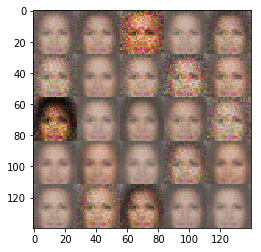

Epoch 1/1... Discriminator Loss: 0.6303... Generator Loss: 4.1570
Epoch 1/1... Discriminator Loss: 0.9748... Generator Loss: 4.6374
Epoch 1/1... Discriminator Loss: 0.8302... Generator Loss: 3.6375
Epoch 1/1... Discriminator Loss: 0.5776... Generator Loss: 4.6542
Epoch 1/1... Discriminator Loss: 0.8020... Generator Loss: 2.9065
Epoch 1/1... Discriminator Loss: 0.8387... Generator Loss: 5.0598
Epoch 1/1... Discriminator Loss: 1.1958... Generator Loss: 3.1903
Epoch 1/1... Discriminator Loss: 1.0523... Generator Loss: 1.8764
Epoch 1/1... Discriminator Loss: 0.7802... Generator Loss: 4.8368
Epoch 1/1... Discriminator Loss: 0.8150... Generator Loss: 4.9592


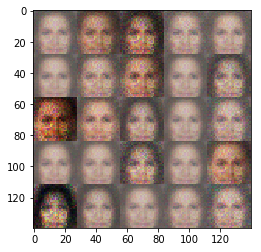

Epoch 1/1... Discriminator Loss: 0.7535... Generator Loss: 4.9602
Epoch 1/1... Discriminator Loss: 0.7055... Generator Loss: 4.6901
Epoch 1/1... Discriminator Loss: 0.5376... Generator Loss: 4.3845
Epoch 1/1... Discriminator Loss: 0.6059... Generator Loss: 4.0279
Epoch 1/1... Discriminator Loss: 0.6267... Generator Loss: 4.7130
Epoch 1/1... Discriminator Loss: 1.3167... Generator Loss: 6.1027
Epoch 1/1... Discriminator Loss: 0.8065... Generator Loss: 4.1813
Epoch 1/1... Discriminator Loss: 0.7377... Generator Loss: 4.4946
Epoch 1/1... Discriminator Loss: 0.7223... Generator Loss: 2.6860
Epoch 1/1... Discriminator Loss: 0.9611... Generator Loss: 2.1520


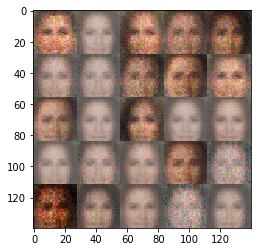

Epoch 1/1... Discriminator Loss: 0.8294... Generator Loss: 2.8068
Epoch 1/1... Discriminator Loss: 0.7059... Generator Loss: 4.3098
Epoch 1/1... Discriminator Loss: 0.7571... Generator Loss: 4.5061
Epoch 1/1... Discriminator Loss: 0.7333... Generator Loss: 4.5885
Epoch 1/1... Discriminator Loss: 0.8756... Generator Loss: 3.0866
Epoch 1/1... Discriminator Loss: 0.7718... Generator Loss: 4.7095
Epoch 1/1... Discriminator Loss: 1.1473... Generator Loss: 5.4462
Epoch 1/1... Discriminator Loss: 0.8205... Generator Loss: 3.7389
Epoch 1/1... Discriminator Loss: 0.8377... Generator Loss: 2.6053
Epoch 1/1... Discriminator Loss: 0.8885... Generator Loss: 6.5004


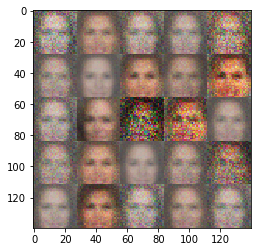

Epoch 1/1... Discriminator Loss: 0.7419... Generator Loss: 5.6665
Epoch 1/1... Discriminator Loss: 0.9544... Generator Loss: 3.8410
Epoch 1/1... Discriminator Loss: 0.7139... Generator Loss: 2.4980
Epoch 1/1... Discriminator Loss: 0.8400... Generator Loss: 2.9621
Epoch 1/1... Discriminator Loss: 1.0934... Generator Loss: 3.3518
Epoch 1/1... Discriminator Loss: 0.5748... Generator Loss: 4.8084
Epoch 1/1... Discriminator Loss: 0.6243... Generator Loss: 3.7479
Epoch 1/1... Discriminator Loss: 0.7715... Generator Loss: 3.3128
Epoch 1/1... Discriminator Loss: 0.9295... Generator Loss: 4.0100
Epoch 1/1... Discriminator Loss: 1.6492... Generator Loss: 5.6364


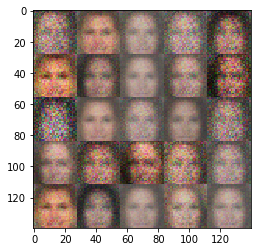

Epoch 1/1... Discriminator Loss: 1.4971... Generator Loss: 7.8960
Epoch 1/1... Discriminator Loss: 0.9885... Generator Loss: 7.4674
Epoch 1/1... Discriminator Loss: 0.8240... Generator Loss: 7.0069
Epoch 1/1... Discriminator Loss: 0.8292... Generator Loss: 6.0127
Epoch 1/1... Discriminator Loss: 0.9582... Generator Loss: 5.7043
Epoch 1/1... Discriminator Loss: 0.8166... Generator Loss: 5.5394
Epoch 1/1... Discriminator Loss: 0.8199... Generator Loss: 3.9161
Epoch 1/1... Discriminator Loss: 0.8945... Generator Loss: 3.6969
Epoch 1/1... Discriminator Loss: 1.1684... Generator Loss: 2.5895
Epoch 1/1... Discriminator Loss: 1.1234... Generator Loss: 2.8415


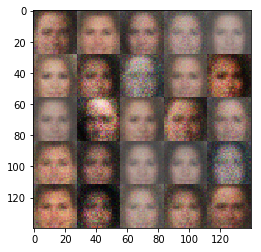

Epoch 1/1... Discriminator Loss: 0.7704... Generator Loss: 3.0845
Epoch 1/1... Discriminator Loss: 0.6449... Generator Loss: 3.3333
Epoch 1/1... Discriminator Loss: 0.9243... Generator Loss: 3.3413
Epoch 1/1... Discriminator Loss: 0.7778... Generator Loss: 4.7368
Epoch 1/1... Discriminator Loss: 0.8336... Generator Loss: 5.9340
Epoch 1/1... Discriminator Loss: 0.7267... Generator Loss: 5.2037
Epoch 1/1... Discriminator Loss: 0.9214... Generator Loss: 2.8057
Epoch 1/1... Discriminator Loss: 0.6711... Generator Loss: 4.0600
Epoch 1/1... Discriminator Loss: 0.9686... Generator Loss: 4.6858
Epoch 1/1... Discriminator Loss: 1.0750... Generator Loss: 2.5250


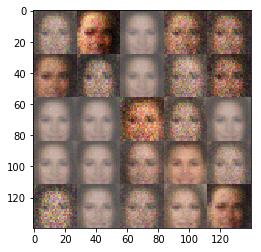

Epoch 1/1... Discriminator Loss: 0.9262... Generator Loss: 2.5197
Epoch 1/1... Discriminator Loss: 0.7740... Generator Loss: 3.6897
Epoch 1/1... Discriminator Loss: 0.7045... Generator Loss: 3.2039
Epoch 1/1... Discriminator Loss: 0.8829... Generator Loss: 3.1660
Epoch 1/1... Discriminator Loss: 0.8935... Generator Loss: 4.5418
Epoch 1/1... Discriminator Loss: 0.8337... Generator Loss: 3.8969
Epoch 1/1... Discriminator Loss: 1.0117... Generator Loss: 1.7354
Epoch 1/1... Discriminator Loss: 0.7827... Generator Loss: 2.2065
Epoch 1/1... Discriminator Loss: 1.0448... Generator Loss: 2.7699
Epoch 1/1... Discriminator Loss: 0.6833... Generator Loss: 2.5771


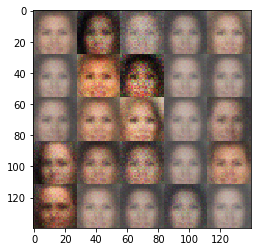

Epoch 1/1... Discriminator Loss: 0.5845... Generator Loss: 2.6725
Epoch 1/1... Discriminator Loss: 0.5547... Generator Loss: 2.9851
Epoch 1/1... Discriminator Loss: 0.7154... Generator Loss: 3.1076
Epoch 1/1... Discriminator Loss: 0.6379... Generator Loss: 2.7966
Epoch 1/1... Discriminator Loss: 0.7083... Generator Loss: 3.4529
Epoch 1/1... Discriminator Loss: 0.9568... Generator Loss: 4.0882


In [12]:
batch_size = 64
z_dim = 128
learning_rate = 0.002
beta1 = 0.9


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

I do not show how the model works on a MNIST data set. In fact, it works badly. It produces some blurry images even after 3 epochs, like this:

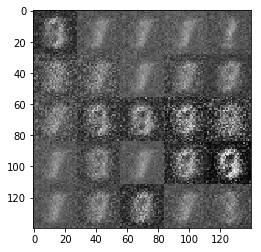

On the other hand, the model produces human-like images surprisingly quickly - after just 20 steps it looks remotely 
like a face:
    
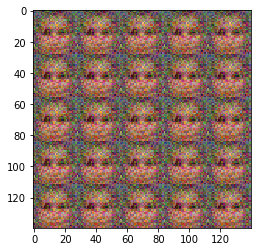

After some more training we get: 

Epoch 1/1... Discriminator Loss: 0.5442... Generator Loss: 3.7918
Epoch 1/1... Discriminator Loss: 0.5875... Generator Loss: 4.0924
Epoch 1/1... Discriminator Loss: 0.5573... Generator Loss: 3.6120
Epoch 1/1... Discriminator Loss: 0.7239... Generator Loss: 4.0936
Epoch 1/1... Discriminator Loss: 0.6843... Generator Loss: 5.5772
Epoch 1/1... Discriminator Loss: 0.6331... Generator Loss: 3.6756
Epoch 1/1... Discriminator Loss: 0.7564... Generator Loss: 6.3590
Epoch 1/1... Discriminator Loss: 0.6854... Generator Loss: 2.5974
Epoch 1/1... Discriminator Loss: 0.7239... Generator Loss: 3.2055
Epoch 1/1... Discriminator Loss: 0.8141... Generator Loss: 4.4034

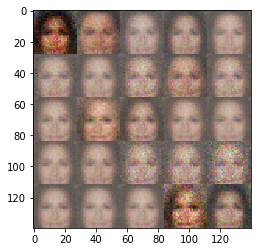

With just one hidden layer!

Now I turn to two "dense" layers. The nice thing is that to change the model I just need to change two functions - generator and discriminator. Then I can run the code.

In [13]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    n_units=128
    alpha=0.01
    with tf.variable_scope('discriminator', reuse=reuse):
        # Hidden layer
        images_flat = tf.contrib.layers.flatten(images)
        h1 = tf.layers.dense(images_flat, 4*n_units, activation=None)
        
        # Leaky ReLU
        h1 = tf.maximum(alpha * h1, h1)
        
        # Second hidden layer:
        h2 = tf.layers.dense(h1, n_units, activation=None)
        h2 = tf.maximum(alpha * h2, h2)
        
        logits = tf.layers.dense(h2, 1, activation=None)
        
        out = tf.sigmoid(logits)
        
        return out, logits

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


In [14]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    alpha=0.01
    n_units=128
    reuse = not is_train
    with tf.variable_scope('generator', reuse=reuse):
        # Hidden layer
        h1 = tf.layers.dense(z, n_units, activation=None)
        # Leaky ReLU
        h1 = tf.maximum(alpha * h1, h1)
        
        # Second hidden layer:
        h2 = tf.layers.dense(h1, 4*n_units, activation=None)
        h2 = tf.maximum(alpha * h2, h2)
        
        # Logits and tanh output
        logits = tf.layers.dense(h2, 28*28*out_channel_dim, activation=None)
        out_flat = tf.tanh(logits)
        out = tf.reshape(out_flat, shape = [tf.shape(out_flat)[0], 28, 28, out_channel_dim])
        
        return out
    
    
   


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


Can we do better? The first idea is to use two hidden layers - to make the model more complex. It helps, to some extent

In [15]:
tf.reset_default_graph()

Epoch 1/3... Discriminator Loss: 0.7861... Generator Loss: 1.0710
Epoch 1/3... Discriminator Loss: 1.0954... Generator Loss: 0.6469
Epoch 1/3... Discriminator Loss: 0.4660... Generator Loss: 2.3843
Epoch 1/3... Discriminator Loss: 0.7377... Generator Loss: 1.2446
Epoch 1/3... Discriminator Loss: 0.6429... Generator Loss: 2.0097
Epoch 1/3... Discriminator Loss: 0.7317... Generator Loss: 1.8938
Epoch 1/3... Discriminator Loss: 0.6555... Generator Loss: 1.7346
Epoch 1/3... Discriminator Loss: 0.5366... Generator Loss: 1.8140
Epoch 1/3... Discriminator Loss: 0.4307... Generator Loss: 3.5541
Epoch 1/3... Discriminator Loss: 1.2576... Generator Loss: 0.8251


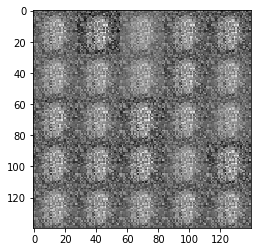

Epoch 1/3... Discriminator Loss: 0.5006... Generator Loss: 2.1807
Epoch 1/3... Discriminator Loss: 0.6649... Generator Loss: 2.7910
Epoch 1/3... Discriminator Loss: 0.5744... Generator Loss: 1.7932
Epoch 1/3... Discriminator Loss: 1.2921... Generator Loss: 0.6520
Epoch 1/3... Discriminator Loss: 0.5766... Generator Loss: 2.8629
Epoch 1/3... Discriminator Loss: 0.8187... Generator Loss: 1.5915
Epoch 1/3... Discriminator Loss: 0.6580... Generator Loss: 1.9995
Epoch 1/3... Discriminator Loss: 2.1387... Generator Loss: 2.7886
Epoch 1/3... Discriminator Loss: 0.5386... Generator Loss: 4.3889
Epoch 1/3... Discriminator Loss: 1.3009... Generator Loss: 1.0478


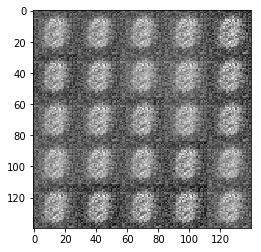

Epoch 1/3... Discriminator Loss: 0.4967... Generator Loss: 2.3680
Epoch 1/3... Discriminator Loss: 0.8464... Generator Loss: 3.1158
Epoch 1/3... Discriminator Loss: 3.6443... Generator Loss: 0.1976
Epoch 1/3... Discriminator Loss: 2.6665... Generator Loss: 0.9915
Epoch 1/3... Discriminator Loss: 1.2436... Generator Loss: 3.5545
Epoch 1/3... Discriminator Loss: 0.9230... Generator Loss: 14.7204
Epoch 1/3... Discriminator Loss: 5.3443... Generator Loss: 3.9606
Epoch 1/3... Discriminator Loss: 2.8751... Generator Loss: 4.2311
Epoch 1/3... Discriminator Loss: 0.8626... Generator Loss: 7.7070
Epoch 1/3... Discriminator Loss: 0.6850... Generator Loss: 6.5681


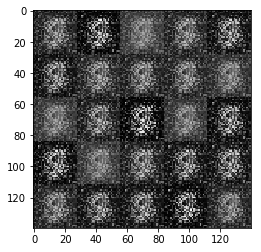

Epoch 1/3... Discriminator Loss: 2.0017... Generator Loss: 7.1424
Epoch 1/3... Discriminator Loss: 1.1933... Generator Loss: 6.7027
Epoch 1/3... Discriminator Loss: 1.4334... Generator Loss: 7.0223
Epoch 1/3... Discriminator Loss: 5.0533... Generator Loss: 1.8797
Epoch 1/3... Discriminator Loss: 0.4810... Generator Loss: 5.3830
Epoch 1/3... Discriminator Loss: 0.8378... Generator Loss: 6.3948
Epoch 1/3... Discriminator Loss: 1.8839... Generator Loss: 9.5156
Epoch 1/3... Discriminator Loss: 1.2431... Generator Loss: 11.1626
Epoch 1/3... Discriminator Loss: 2.4548... Generator Loss: 4.4163
Epoch 1/3... Discriminator Loss: 4.6359... Generator Loss: 0.6517


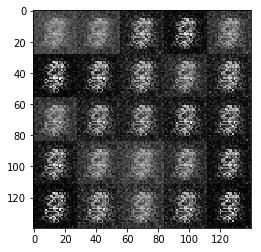

Epoch 1/3... Discriminator Loss: 0.7308... Generator Loss: 3.1359
Epoch 1/3... Discriminator Loss: 1.2973... Generator Loss: 3.3528
Epoch 1/3... Discriminator Loss: 1.8060... Generator Loss: 2.3942
Epoch 1/3... Discriminator Loss: 9.8985... Generator Loss: 3.1753
Epoch 1/3... Discriminator Loss: 0.6470... Generator Loss: 24.4919
Epoch 1/3... Discriminator Loss: 0.4723... Generator Loss: 12.5876
Epoch 2/3... Discriminator Loss: 2.3264... Generator Loss: 1.9367
Epoch 2/3... Discriminator Loss: 4.6240... Generator Loss: 1.7575
Epoch 2/3... Discriminator Loss: 0.4342... Generator Loss: 8.9845
Epoch 2/3... Discriminator Loss: 0.5626... Generator Loss: 2.9571


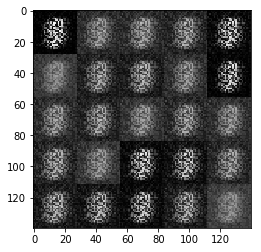

Epoch 2/3... Discriminator Loss: 0.8487... Generator Loss: 2.0271
Epoch 2/3... Discriminator Loss: 0.6270... Generator Loss: 3.8936
Epoch 2/3... Discriminator Loss: 1.8528... Generator Loss: 1.2345
Epoch 2/3... Discriminator Loss: 0.9803... Generator Loss: 2.1055
Epoch 2/3... Discriminator Loss: 0.6540... Generator Loss: 5.0033
Epoch 2/3... Discriminator Loss: 0.8838... Generator Loss: 1.9104
Epoch 2/3... Discriminator Loss: 1.5111... Generator Loss: 0.7853
Epoch 2/3... Discriminator Loss: 1.3250... Generator Loss: 1.2670
Epoch 2/3... Discriminator Loss: 0.6374... Generator Loss: 3.8337
Epoch 2/3... Discriminator Loss: 1.0146... Generator Loss: 2.4036


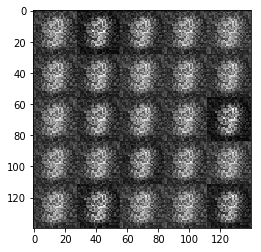

Epoch 2/3... Discriminator Loss: 1.2269... Generator Loss: 1.1748
Epoch 2/3... Discriminator Loss: 0.8136... Generator Loss: 2.1636
Epoch 2/3... Discriminator Loss: 0.5840... Generator Loss: 4.2226
Epoch 2/3... Discriminator Loss: 0.7042... Generator Loss: 3.4997
Epoch 2/3... Discriminator Loss: 2.5893... Generator Loss: 2.5612
Epoch 2/3... Discriminator Loss: 0.4614... Generator Loss: 15.4548
Epoch 2/3... Discriminator Loss: 0.6490... Generator Loss: 7.9525
Epoch 2/3... Discriminator Loss: 2.2987... Generator Loss: 1.3520
Epoch 2/3... Discriminator Loss: 2.9440... Generator Loss: 1.7959
Epoch 2/3... Discriminator Loss: 0.5492... Generator Loss: 2.9200


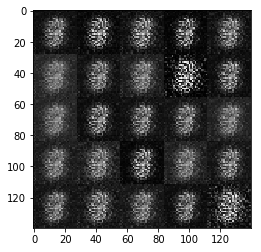

Epoch 2/3... Discriminator Loss: 0.4232... Generator Loss: 5.3704
Epoch 2/3... Discriminator Loss: 1.9837... Generator Loss: 2.0425
Epoch 2/3... Discriminator Loss: 0.7794... Generator Loss: 3.0312
Epoch 2/3... Discriminator Loss: 0.5688... Generator Loss: 4.2780
Epoch 2/3... Discriminator Loss: 0.8223... Generator Loss: 1.8209
Epoch 2/3... Discriminator Loss: 2.0130... Generator Loss: 0.7382
Epoch 2/3... Discriminator Loss: 2.0097... Generator Loss: 0.9678
Epoch 2/3... Discriminator Loss: 0.8077... Generator Loss: 1.4061
Epoch 2/3... Discriminator Loss: 0.7024... Generator Loss: 2.0969
Epoch 2/3... Discriminator Loss: 1.2928... Generator Loss: 3.7112


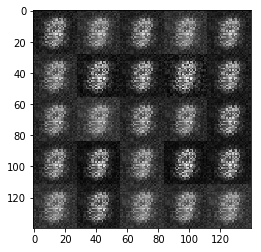

Epoch 2/3... Discriminator Loss: 0.7024... Generator Loss: 5.9389
Epoch 2/3... Discriminator Loss: 0.4611... Generator Loss: 8.6911
Epoch 2/3... Discriminator Loss: 0.7713... Generator Loss: 6.4877
Epoch 2/3... Discriminator Loss: 2.0381... Generator Loss: 4.6061
Epoch 2/3... Discriminator Loss: 1.7845... Generator Loss: 3.6589
Epoch 2/3... Discriminator Loss: 1.3071... Generator Loss: 1.1145
Epoch 2/3... Discriminator Loss: 0.6616... Generator Loss: 1.8757
Epoch 2/3... Discriminator Loss: 0.6133... Generator Loss: 2.7442
Epoch 2/3... Discriminator Loss: 0.6923... Generator Loss: 2.7735
Epoch 2/3... Discriminator Loss: 0.7211... Generator Loss: 3.1299


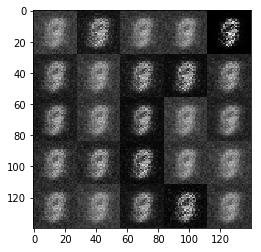

Epoch 2/3... Discriminator Loss: 1.9173... Generator Loss: 2.9842
Epoch 2/3... Discriminator Loss: 0.9712... Generator Loss: 2.8703
Epoch 2/3... Discriminator Loss: 1.1332... Generator Loss: 1.8764
Epoch 3/3... Discriminator Loss: 0.6421... Generator Loss: 4.3349
Epoch 3/3... Discriminator Loss: 0.9904... Generator Loss: 1.6322
Epoch 3/3... Discriminator Loss: 2.4177... Generator Loss: 1.0545
Epoch 3/3... Discriminator Loss: 0.9698... Generator Loss: 1.9276
Epoch 3/3... Discriminator Loss: 0.4864... Generator Loss: 3.3927
Epoch 3/3... Discriminator Loss: 0.4556... Generator Loss: 2.5463
Epoch 3/3... Discriminator Loss: 0.8849... Generator Loss: 1.5148


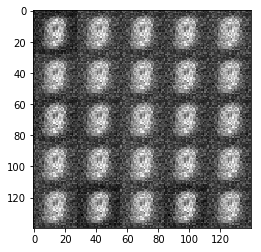

Epoch 3/3... Discriminator Loss: 1.4008... Generator Loss: 0.8975
Epoch 3/3... Discriminator Loss: 1.2579... Generator Loss: 1.1150
Epoch 3/3... Discriminator Loss: 0.9654... Generator Loss: 1.2118
Epoch 3/3... Discriminator Loss: 0.5193... Generator Loss: 2.9214
Epoch 3/3... Discriminator Loss: 0.4585... Generator Loss: 2.8874
Epoch 3/3... Discriminator Loss: 0.7314... Generator Loss: 2.5808
Epoch 3/3... Discriminator Loss: 0.6807... Generator Loss: 2.3624
Epoch 3/3... Discriminator Loss: 2.2866... Generator Loss: 0.5770
Epoch 3/3... Discriminator Loss: 0.5925... Generator Loss: 4.9769
Epoch 3/3... Discriminator Loss: 0.6088... Generator Loss: 3.6340


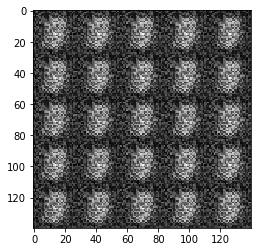

Epoch 3/3... Discriminator Loss: 1.0889... Generator Loss: 5.5082
Epoch 3/3... Discriminator Loss: 4.0464... Generator Loss: 2.1502
Epoch 3/3... Discriminator Loss: 1.1905... Generator Loss: 2.1044
Epoch 3/3... Discriminator Loss: 0.5124... Generator Loss: 4.3701
Epoch 3/3... Discriminator Loss: 0.9999... Generator Loss: 1.2660
Epoch 3/3... Discriminator Loss: 0.5080... Generator Loss: 2.6124
Epoch 3/3... Discriminator Loss: 1.1285... Generator Loss: 2.5118
Epoch 3/3... Discriminator Loss: 0.9484... Generator Loss: 2.3708
Epoch 3/3... Discriminator Loss: 0.7689... Generator Loss: 4.7087
Epoch 3/3... Discriminator Loss: 0.9755... Generator Loss: 1.8473


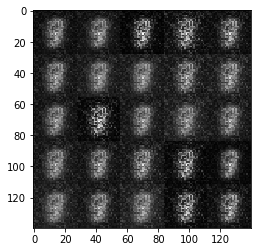

Epoch 3/3... Discriminator Loss: 1.3189... Generator Loss: 1.5508
Epoch 3/3... Discriminator Loss: 1.0611... Generator Loss: 1.6293
Epoch 3/3... Discriminator Loss: 1.0158... Generator Loss: 1.5756
Epoch 3/3... Discriminator Loss: 0.6046... Generator Loss: 2.6193
Epoch 3/3... Discriminator Loss: 0.6546... Generator Loss: 3.6651
Epoch 3/3... Discriminator Loss: 1.1923... Generator Loss: 2.3057
Epoch 3/3... Discriminator Loss: 0.6835... Generator Loss: 2.5359
Epoch 3/3... Discriminator Loss: 0.4181... Generator Loss: 3.9447
Epoch 3/3... Discriminator Loss: 0.5657... Generator Loss: 4.2321
Epoch 3/3... Discriminator Loss: 1.2282... Generator Loss: 4.0815


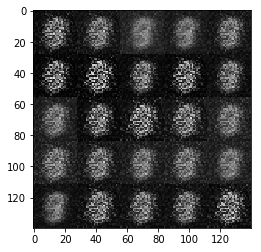

Epoch 3/3... Discriminator Loss: 1.7070... Generator Loss: 2.7419
Epoch 3/3... Discriminator Loss: 0.5869... Generator Loss: 3.1948
Epoch 3/3... Discriminator Loss: 1.0891... Generator Loss: 3.0499
Epoch 3/3... Discriminator Loss: 0.5057... Generator Loss: 4.0899
Epoch 3/3... Discriminator Loss: 0.9101... Generator Loss: 2.2832
Epoch 3/3... Discriminator Loss: 1.2364... Generator Loss: 2.5013
Epoch 3/3... Discriminator Loss: 1.0057... Generator Loss: 2.2305
Epoch 3/3... Discriminator Loss: 0.9276... Generator Loss: 4.5557
Epoch 3/3... Discriminator Loss: 0.4983... Generator Loss: 7.9325
Epoch 3/3... Discriminator Loss: 1.7680... Generator Loss: 2.6928


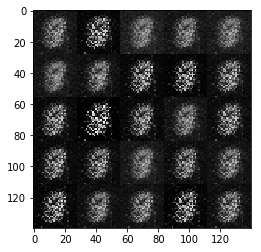

In [16]:
batch_size = 128
z_dim = 128
learning_rate = 0.002
beta1 = 0.9

# alpha = 0.01

epochs = 3

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

The outcome with MNIST is just marginally better:

Epoch 2/3... Discriminator Loss: 0.7024... Generator Loss: 5.9389
Epoch 2/3... Discriminator Loss: 0.4611... Generator Loss: 8.6911
Epoch 2/3... Discriminator Loss: 0.7713... Generator Loss: 6.4877
Epoch 2/3... Discriminator Loss: 2.0381... Generator Loss: 4.6061
Epoch 2/3... Discriminator Loss: 1.7845... Generator Loss: 3.6589
Epoch 2/3... Discriminator Loss: 1.3071... Generator Loss: 1.1145
Epoch 2/3... Discriminator Loss: 0.6616... Generator Loss: 1.8757
Epoch 2/3... Discriminator Loss: 0.6133... Generator Loss: 2.7442
Epoch 2/3... Discriminator Loss: 0.6923... Generator Loss: 2.7735
Epoch 2/3... Discriminator Loss: 0.7211... Generator Loss: 3.1299

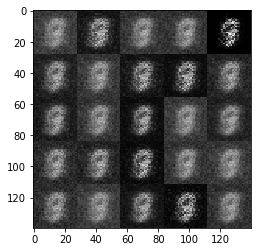

Epoch 1/1... Discriminator Loss: 1.1896... Generator Loss: 0.5877
Epoch 1/1... Discriminator Loss: 0.8807... Generator Loss: 0.9625
Epoch 1/1... Discriminator Loss: 0.4741... Generator Loss: 3.5510
Epoch 1/1... Discriminator Loss: 0.5106... Generator Loss: 2.4932
Epoch 1/1... Discriminator Loss: 0.4950... Generator Loss: 2.6633
Epoch 1/1... Discriminator Loss: 0.7970... Generator Loss: 1.1407
Epoch 1/1... Discriminator Loss: 0.5109... Generator Loss: 2.0658
Epoch 1/1... Discriminator Loss: 0.8885... Generator Loss: 1.0424
Epoch 1/1... Discriminator Loss: 0.7501... Generator Loss: 2.3523
Epoch 1/1... Discriminator Loss: 0.8215... Generator Loss: 1.7702


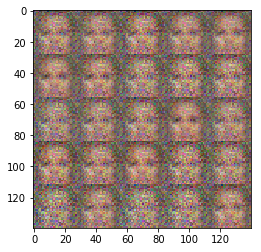

Epoch 1/1... Discriminator Loss: 0.4631... Generator Loss: 3.3760
Epoch 1/1... Discriminator Loss: 0.6226... Generator Loss: 1.6694
Epoch 1/1... Discriminator Loss: 0.5858... Generator Loss: 1.9722
Epoch 1/1... Discriminator Loss: 0.5764... Generator Loss: 2.0757
Epoch 1/1... Discriminator Loss: 0.6458... Generator Loss: 1.7536
Epoch 1/1... Discriminator Loss: 0.4965... Generator Loss: 2.4823
Epoch 1/1... Discriminator Loss: 0.5098... Generator Loss: 2.0299
Epoch 1/1... Discriminator Loss: 0.4136... Generator Loss: 4.7372
Epoch 1/1... Discriminator Loss: 0.7229... Generator Loss: 1.9277
Epoch 1/1... Discriminator Loss: 0.7545... Generator Loss: 1.2990


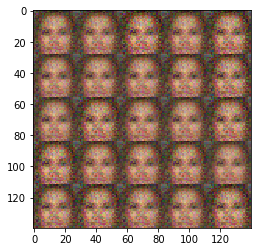

Epoch 1/1... Discriminator Loss: 0.5798... Generator Loss: 3.2850
Epoch 1/1... Discriminator Loss: 0.4751... Generator Loss: 3.1873
Epoch 1/1... Discriminator Loss: 0.4547... Generator Loss: 3.1882
Epoch 1/1... Discriminator Loss: 0.4189... Generator Loss: 3.7162
Epoch 1/1... Discriminator Loss: 0.4513... Generator Loss: 3.1549
Epoch 1/1... Discriminator Loss: 0.4373... Generator Loss: 4.8114
Epoch 1/1... Discriminator Loss: 0.5686... Generator Loss: 2.5531
Epoch 1/1... Discriminator Loss: 0.4087... Generator Loss: 5.2324
Epoch 1/1... Discriminator Loss: 0.4851... Generator Loss: 2.6454
Epoch 1/1... Discriminator Loss: 0.6865... Generator Loss: 2.2738


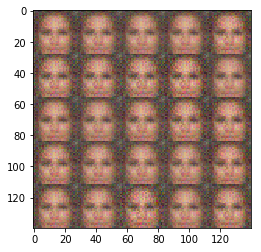

Epoch 1/1... Discriminator Loss: 0.3985... Generator Loss: 4.7945
Epoch 1/1... Discriminator Loss: 0.6816... Generator Loss: 4.4941
Epoch 1/1... Discriminator Loss: 0.5562... Generator Loss: 3.2618
Epoch 1/1... Discriminator Loss: 0.3729... Generator Loss: 5.2073
Epoch 1/1... Discriminator Loss: 0.4234... Generator Loss: 4.3687
Epoch 1/1... Discriminator Loss: 0.4360... Generator Loss: 4.1505
Epoch 1/1... Discriminator Loss: 0.4192... Generator Loss: 4.5748
Epoch 1/1... Discriminator Loss: 0.5314... Generator Loss: 4.6050
Epoch 1/1... Discriminator Loss: 0.4935... Generator Loss: 3.4467
Epoch 1/1... Discriminator Loss: 0.3807... Generator Loss: 4.2853


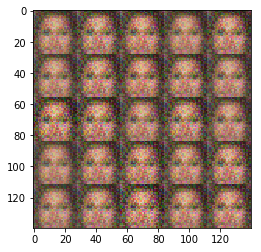

Epoch 1/1... Discriminator Loss: 0.4336... Generator Loss: 3.6578
Epoch 1/1... Discriminator Loss: 0.4517... Generator Loss: 6.7793
Epoch 1/1... Discriminator Loss: 0.4222... Generator Loss: 4.2709
Epoch 1/1... Discriminator Loss: 0.4244... Generator Loss: 3.7307
Epoch 1/1... Discriminator Loss: 0.4743... Generator Loss: 3.1632
Epoch 1/1... Discriminator Loss: 0.4042... Generator Loss: 4.7513
Epoch 1/1... Discriminator Loss: 0.4396... Generator Loss: 4.2814
Epoch 1/1... Discriminator Loss: 0.4247... Generator Loss: 4.4238
Epoch 1/1... Discriminator Loss: 0.4842... Generator Loss: 5.2487
Epoch 1/1... Discriminator Loss: 0.4725... Generator Loss: 2.8581


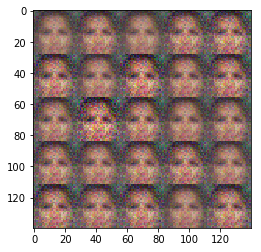

Epoch 1/1... Discriminator Loss: 0.5414... Generator Loss: 3.2849
Epoch 1/1... Discriminator Loss: 0.4348... Generator Loss: 6.7993
Epoch 1/1... Discriminator Loss: 0.3949... Generator Loss: 3.7525
Epoch 1/1... Discriminator Loss: 0.5933... Generator Loss: 3.4182
Epoch 1/1... Discriminator Loss: 0.5961... Generator Loss: 10.5601
Epoch 1/1... Discriminator Loss: 0.6939... Generator Loss: 3.1822
Epoch 1/1... Discriminator Loss: 0.3787... Generator Loss: 4.6629
Epoch 1/1... Discriminator Loss: 0.6482... Generator Loss: 2.8372
Epoch 1/1... Discriminator Loss: 0.4790... Generator Loss: 4.1866
Epoch 1/1... Discriminator Loss: 0.8891... Generator Loss: 7.1990


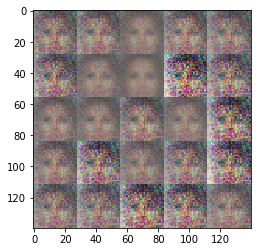

Epoch 1/1... Discriminator Loss: 0.5618... Generator Loss: 2.7467
Epoch 1/1... Discriminator Loss: 0.5240... Generator Loss: 2.7751
Epoch 1/1... Discriminator Loss: 0.4916... Generator Loss: 3.1502
Epoch 1/1... Discriminator Loss: 0.4831... Generator Loss: 6.0233
Epoch 1/1... Discriminator Loss: 0.5866... Generator Loss: 5.0884
Epoch 1/1... Discriminator Loss: 0.4126... Generator Loss: 4.1579
Epoch 1/1... Discriminator Loss: 0.5159... Generator Loss: 3.5210
Epoch 1/1... Discriminator Loss: 0.5351... Generator Loss: 2.9022
Epoch 1/1... Discriminator Loss: 0.5187... Generator Loss: 3.1698
Epoch 1/1... Discriminator Loss: 0.5343... Generator Loss: 3.7686


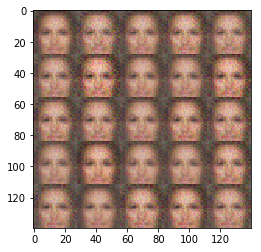

Epoch 1/1... Discriminator Loss: 0.5337... Generator Loss: 3.0766
Epoch 1/1... Discriminator Loss: 0.4088... Generator Loss: 4.7137
Epoch 1/1... Discriminator Loss: 0.7620... Generator Loss: 2.4054
Epoch 1/1... Discriminator Loss: 0.5357... Generator Loss: 2.9635
Epoch 1/1... Discriminator Loss: 0.5644... Generator Loss: 2.8940
Epoch 1/1... Discriminator Loss: 0.4372... Generator Loss: 3.5642
Epoch 1/1... Discriminator Loss: 0.4754... Generator Loss: 2.9620
Epoch 1/1... Discriminator Loss: 0.5769... Generator Loss: 3.8154
Epoch 1/1... Discriminator Loss: 0.6551... Generator Loss: 2.7679
Epoch 1/1... Discriminator Loss: 0.4821... Generator Loss: 3.5993


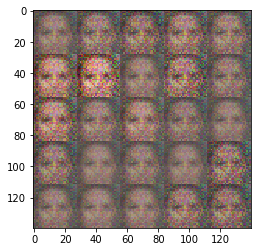

Epoch 1/1... Discriminator Loss: 0.5837... Generator Loss: 3.1083
Epoch 1/1... Discriminator Loss: 0.7288... Generator Loss: 1.7189
Epoch 1/1... Discriminator Loss: 1.3662... Generator Loss: 2.3821
Epoch 1/1... Discriminator Loss: 0.7365... Generator Loss: 3.9265
Epoch 1/1... Discriminator Loss: 0.7822... Generator Loss: 2.4237
Epoch 1/1... Discriminator Loss: 0.6755... Generator Loss: 1.9735
Epoch 1/1... Discriminator Loss: 0.4670... Generator Loss: 4.1269
Epoch 1/1... Discriminator Loss: 0.5605... Generator Loss: 4.0314
Epoch 1/1... Discriminator Loss: 0.5374... Generator Loss: 3.9339
Epoch 1/1... Discriminator Loss: 0.4816... Generator Loss: 3.2609


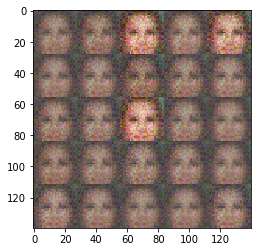

Epoch 1/1... Discriminator Loss: 0.5143... Generator Loss: 2.8433
Epoch 1/1... Discriminator Loss: 0.4923... Generator Loss: 2.8669
Epoch 1/1... Discriminator Loss: 0.6934... Generator Loss: 2.9105
Epoch 1/1... Discriminator Loss: 0.4844... Generator Loss: 2.9739
Epoch 1/1... Discriminator Loss: 0.6590... Generator Loss: 2.4671
Epoch 1/1... Discriminator Loss: 0.5294... Generator Loss: 2.6349
Epoch 1/1... Discriminator Loss: 0.4009... Generator Loss: 4.6851
Epoch 1/1... Discriminator Loss: 0.4161... Generator Loss: 6.2824
Epoch 1/1... Discriminator Loss: 0.5278... Generator Loss: 3.9554
Epoch 1/1... Discriminator Loss: 0.4371... Generator Loss: 3.7070


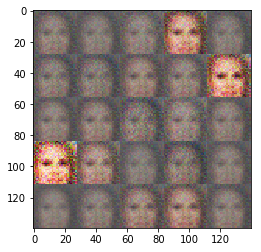

Epoch 1/1... Discriminator Loss: 0.6333... Generator Loss: 2.4988
Epoch 1/1... Discriminator Loss: 0.6131... Generator Loss: 3.0218
Epoch 1/1... Discriminator Loss: 0.6614... Generator Loss: 2.9032
Epoch 1/1... Discriminator Loss: 0.7445... Generator Loss: 3.7678
Epoch 1/1... Discriminator Loss: 0.5987... Generator Loss: 3.0834
Epoch 1/1... Discriminator Loss: 0.9001... Generator Loss: 3.0488
Epoch 1/1... Discriminator Loss: 0.5960... Generator Loss: 5.0587
Epoch 1/1... Discriminator Loss: 0.7183... Generator Loss: 3.6895
Epoch 1/1... Discriminator Loss: 0.4397... Generator Loss: 4.1955
Epoch 1/1... Discriminator Loss: 0.4539... Generator Loss: 4.7510


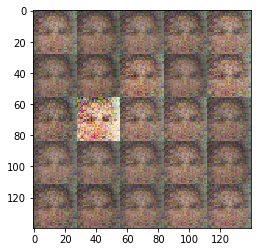

Epoch 1/1... Discriminator Loss: 0.5105... Generator Loss: 4.3688
Epoch 1/1... Discriminator Loss: 0.7057... Generator Loss: 1.6536
Epoch 1/1... Discriminator Loss: 0.5476... Generator Loss: 2.4781
Epoch 1/1... Discriminator Loss: 0.6756... Generator Loss: 2.9589
Epoch 1/1... Discriminator Loss: 0.6646... Generator Loss: 2.6547
Epoch 1/1... Discriminator Loss: 0.6192... Generator Loss: 4.3461
Epoch 1/1... Discriminator Loss: 0.5338... Generator Loss: 3.4577
Epoch 1/1... Discriminator Loss: 0.5437... Generator Loss: 4.9013
Epoch 1/1... Discriminator Loss: 0.6089... Generator Loss: 3.4863
Epoch 1/1... Discriminator Loss: 0.8538... Generator Loss: 2.5074


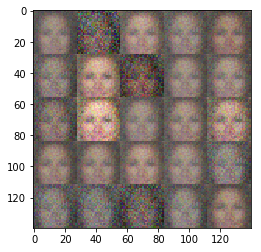

Epoch 1/1... Discriminator Loss: 0.5819... Generator Loss: 2.5965
Epoch 1/1... Discriminator Loss: 0.6415... Generator Loss: 3.5555
Epoch 1/1... Discriminator Loss: 0.6039... Generator Loss: 3.5174
Epoch 1/1... Discriminator Loss: 0.6168... Generator Loss: 3.6110
Epoch 1/1... Discriminator Loss: 1.4017... Generator Loss: 1.4710
Epoch 1/1... Discriminator Loss: 0.4901... Generator Loss: 3.1277
Epoch 1/1... Discriminator Loss: 0.6803... Generator Loss: 1.9708
Epoch 1/1... Discriminator Loss: 0.7589... Generator Loss: 2.0155
Epoch 1/1... Discriminator Loss: 0.6717... Generator Loss: 2.4555
Epoch 1/1... Discriminator Loss: 0.7156... Generator Loss: 2.7480


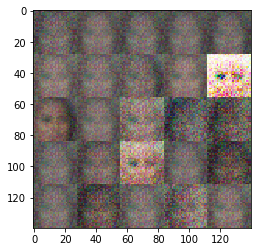

Epoch 1/1... Discriminator Loss: 0.6374... Generator Loss: 2.5482
Epoch 1/1... Discriminator Loss: 0.8918... Generator Loss: 4.4322
Epoch 1/1... Discriminator Loss: 0.7381... Generator Loss: 4.6333
Epoch 1/1... Discriminator Loss: 0.6224... Generator Loss: 4.4613
Epoch 1/1... Discriminator Loss: 0.7361... Generator Loss: 3.0342
Epoch 1/1... Discriminator Loss: 0.6592... Generator Loss: 3.9910
Epoch 1/1... Discriminator Loss: 0.6039... Generator Loss: 3.7259
Epoch 1/1... Discriminator Loss: 0.6651... Generator Loss: 3.7144
Epoch 1/1... Discriminator Loss: 0.9296... Generator Loss: 2.7973
Epoch 1/1... Discriminator Loss: 0.5911... Generator Loss: 2.7135


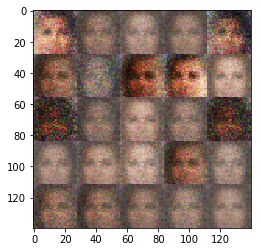

Epoch 1/1... Discriminator Loss: 0.7435... Generator Loss: 3.2185
Epoch 1/1... Discriminator Loss: 0.5338... Generator Loss: 4.1808
Epoch 1/1... Discriminator Loss: 0.6904... Generator Loss: 3.0244
Epoch 1/1... Discriminator Loss: 0.8907... Generator Loss: 1.8627
Epoch 1/1... Discriminator Loss: 0.7627... Generator Loss: 2.6573
Epoch 1/1... Discriminator Loss: 0.6897... Generator Loss: 2.9110
Epoch 1/1... Discriminator Loss: 0.7303... Generator Loss: 3.9304
Epoch 1/1... Discriminator Loss: 0.9705... Generator Loss: 1.2237
Epoch 1/1... Discriminator Loss: 0.9030... Generator Loss: 1.8739
Epoch 1/1... Discriminator Loss: 0.7262... Generator Loss: 3.3397


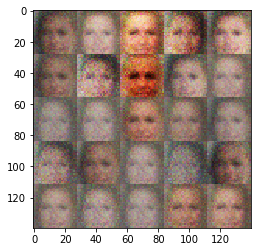

Epoch 1/1... Discriminator Loss: 0.7128... Generator Loss: 2.9784
Epoch 1/1... Discriminator Loss: 0.9851... Generator Loss: 2.0140
Epoch 1/1... Discriminator Loss: 0.6041... Generator Loss: 3.0188
Epoch 1/1... Discriminator Loss: 0.6617... Generator Loss: 2.2567
Epoch 1/1... Discriminator Loss: 0.8192... Generator Loss: 1.9240
Epoch 1/1... Discriminator Loss: 1.1510... Generator Loss: 1.9313
Epoch 1/1... Discriminator Loss: 0.6995... Generator Loss: 2.3497
Epoch 1/1... Discriminator Loss: 0.6519... Generator Loss: 4.0959


In [17]:
tf.reset_default_graph()

batch_size = 128
z_dim = 128
learning_rate = 0.002
beta1 = 0.9


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

Some faces start to look more or less realistic while others are more appropriate for horror movies:
    
Epoch 1/1... Discriminator Loss: 0.7435... Generator Loss: 3.2185
Epoch 1/1... Discriminator Loss: 0.5338... Generator Loss: 4.1808
Epoch 1/1... Discriminator Loss: 0.6904... Generator Loss: 3.0244
Epoch 1/1... Discriminator Loss: 0.8907... Generator Loss: 1.8627
Epoch 1/1... Discriminator Loss: 0.7627... Generator Loss: 2.6573
Epoch 1/1... Discriminator Loss: 0.6897... Generator Loss: 2.9110
Epoch 1/1... Discriminator Loss: 0.7303... Generator Loss: 3.9304
Epoch 1/1... Discriminator Loss: 0.9705... Generator Loss: 1.2237
Epoch 1/1... Discriminator Loss: 0.9030... Generator Loss: 1.8739
Epoch 1/1... Discriminator Loss: 0.7262... Generator Loss: 3.3397

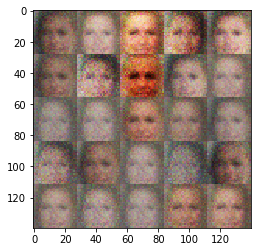

Can we stop here? The rubric does not give any reasonable criteria on where to stop. It just says: 

all tests passed/ all functions properly implemented/ "The project generates realistic faces. It should be obvious that images generated look like faces."

What does it mean - "look like"?

A Russian proverb pops into my mind:

A hog looks like a hedgehog, but with different bustles.

In principle, the above images look like human faces, but can we do better?

We had a whole lecture on DCGANs. Now is the time for them!

I know about suggestions (in the forum) to do the project with a four layer Net.

But I'll start from just two convolutional layers.

It's easier to train (less time), so I can fine tune the parameters better and to get a feeling of their relative importance.

In [19]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    alpha=0.1
    reuse = not is_train
    
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x1 = tf.layers.dense(z, 4*4*128)
        
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 4, 4, 128))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # 4x4x128 now
        
        x2 = tf.layers.conv2d_transpose(x1, 64, 4, strides=1, padding='valid')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        # 7x7x64 now
        
                
        # Output layer
        logits = tf.layers.conv2d_transpose(x2, out_channel_dim, 4, strides=4, padding='same')
        # 28x28x(3 or 1) now
        
        out = tf.tanh(logits)
        
        return out
    
   


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


In [20]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    alpha=0.1
    
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 28x28x(1 or 3)
        x1 = tf.layers.conv2d(images, 64, 4, strides=4, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 7x7x64
        
                
        x3 = tf.layers.conv2d(relu1, 128, 4, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x128
        
        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*128))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits
        
        
        
        
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


Epoch 1/5... Discriminator Loss: 0.7792... Generator Loss: 1.2918
Epoch 1/5... Discriminator Loss: 0.8379... Generator Loss: 1.0130
Epoch 1/5... Discriminator Loss: 0.6424... Generator Loss: 2.2290
Epoch 1/5... Discriminator Loss: 0.7452... Generator Loss: 2.2176
Epoch 1/5... Discriminator Loss: 0.5503... Generator Loss: 2.1381
Epoch 1/5... Discriminator Loss: 0.5085... Generator Loss: 2.3218
Epoch 1/5... Discriminator Loss: 0.4715... Generator Loss: 2.7778
Epoch 1/5... Discriminator Loss: 0.4463... Generator Loss: 2.9590
Epoch 1/5... Discriminator Loss: 0.4105... Generator Loss: 3.1021
Epoch 1/5... Discriminator Loss: 0.3893... Generator Loss: 3.2583


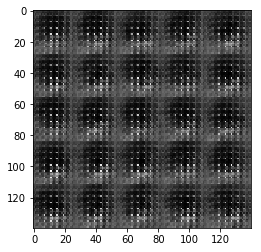

Epoch 1/5... Discriminator Loss: 0.4405... Generator Loss: 3.0523
Epoch 1/5... Discriminator Loss: 0.4110... Generator Loss: 4.0602
Epoch 1/5... Discriminator Loss: 0.4477... Generator Loss: 4.6454
Epoch 1/5... Discriminator Loss: 0.4214... Generator Loss: 3.1322
Epoch 1/5... Discriminator Loss: 0.5884... Generator Loss: 1.9647
Epoch 1/5... Discriminator Loss: 0.5756... Generator Loss: 1.9732
Epoch 1/5... Discriminator Loss: 0.6862... Generator Loss: 1.8892
Epoch 1/5... Discriminator Loss: 0.6507... Generator Loss: 1.6862
Epoch 1/5... Discriminator Loss: 0.5395... Generator Loss: 2.4377
Epoch 1/5... Discriminator Loss: 0.6115... Generator Loss: 1.7636


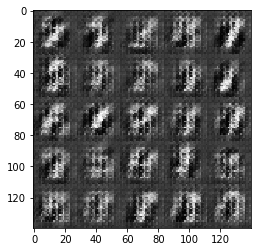

Epoch 1/5... Discriminator Loss: 1.4189... Generator Loss: 0.5699
Epoch 1/5... Discriminator Loss: 0.7667... Generator Loss: 1.6260
Epoch 1/5... Discriminator Loss: 0.5800... Generator Loss: 2.1298
Epoch 1/5... Discriminator Loss: 0.5859... Generator Loss: 2.0794
Epoch 1/5... Discriminator Loss: 0.6280... Generator Loss: 1.7166
Epoch 1/5... Discriminator Loss: 0.6153... Generator Loss: 1.8536
Epoch 1/5... Discriminator Loss: 0.6223... Generator Loss: 2.1011
Epoch 1/5... Discriminator Loss: 0.7081... Generator Loss: 2.2911
Epoch 1/5... Discriminator Loss: 0.8514... Generator Loss: 2.5105
Epoch 1/5... Discriminator Loss: 0.8934... Generator Loss: 1.0681


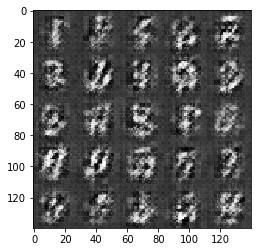

Epoch 1/5... Discriminator Loss: 0.8685... Generator Loss: 2.3247
Epoch 1/5... Discriminator Loss: 0.6341... Generator Loss: 1.8280
Epoch 1/5... Discriminator Loss: 0.8043... Generator Loss: 1.1350
Epoch 1/5... Discriminator Loss: 0.7881... Generator Loss: 2.5203
Epoch 1/5... Discriminator Loss: 0.7015... Generator Loss: 1.5110
Epoch 1/5... Discriminator Loss: 0.7470... Generator Loss: 1.7441
Epoch 1/5... Discriminator Loss: 0.7164... Generator Loss: 1.7547
Epoch 1/5... Discriminator Loss: 0.6870... Generator Loss: 2.2314
Epoch 1/5... Discriminator Loss: 0.7625... Generator Loss: 1.4206
Epoch 1/5... Discriminator Loss: 0.7699... Generator Loss: 1.9592


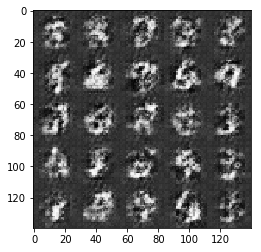

Epoch 1/5... Discriminator Loss: 0.7867... Generator Loss: 2.1127
Epoch 1/5... Discriminator Loss: 0.8458... Generator Loss: 1.0740
Epoch 1/5... Discriminator Loss: 0.7645... Generator Loss: 2.8374
Epoch 1/5... Discriminator Loss: 0.6468... Generator Loss: 1.7735
Epoch 1/5... Discriminator Loss: 0.6641... Generator Loss: 1.7705
Epoch 1/5... Discriminator Loss: 0.6400... Generator Loss: 2.3832
Epoch 2/5... Discriminator Loss: 0.6033... Generator Loss: 1.9795
Epoch 2/5... Discriminator Loss: 0.6378... Generator Loss: 1.8342
Epoch 2/5... Discriminator Loss: 0.6421... Generator Loss: 1.5145
Epoch 2/5... Discriminator Loss: 1.0670... Generator Loss: 0.7625


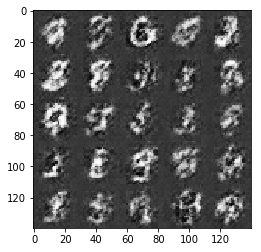

Epoch 2/5... Discriminator Loss: 0.5865... Generator Loss: 1.8690
Epoch 2/5... Discriminator Loss: 0.6857... Generator Loss: 2.1570
Epoch 2/5... Discriminator Loss: 0.7150... Generator Loss: 1.3272
Epoch 2/5... Discriminator Loss: 0.5847... Generator Loss: 1.7747
Epoch 2/5... Discriminator Loss: 0.5956... Generator Loss: 2.1673
Epoch 2/5... Discriminator Loss: 0.5803... Generator Loss: 2.2102
Epoch 2/5... Discriminator Loss: 0.5939... Generator Loss: 2.0323
Epoch 2/5... Discriminator Loss: 0.5544... Generator Loss: 2.2461
Epoch 2/5... Discriminator Loss: 0.6250... Generator Loss: 1.9641
Epoch 2/5... Discriminator Loss: 0.5628... Generator Loss: 1.8195


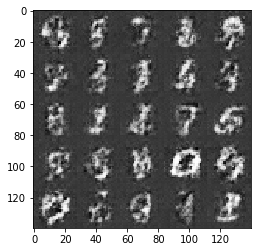

Epoch 2/5... Discriminator Loss: 0.5550... Generator Loss: 1.9538
Epoch 2/5... Discriminator Loss: 0.5150... Generator Loss: 2.4475
Epoch 2/5... Discriminator Loss: 0.5494... Generator Loss: 1.9343
Epoch 2/5... Discriminator Loss: 0.6394... Generator Loss: 1.5384
Epoch 2/5... Discriminator Loss: 0.5601... Generator Loss: 1.8797
Epoch 2/5... Discriminator Loss: 0.5328... Generator Loss: 2.4535
Epoch 2/5... Discriminator Loss: 0.5089... Generator Loss: 2.2420
Epoch 2/5... Discriminator Loss: 0.9630... Generator Loss: 0.9395
Epoch 2/5... Discriminator Loss: 1.2397... Generator Loss: 0.7556
Epoch 2/5... Discriminator Loss: 0.5926... Generator Loss: 1.8454


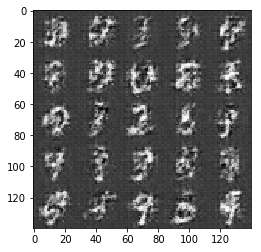

Epoch 2/5... Discriminator Loss: 0.5072... Generator Loss: 2.2779
Epoch 2/5... Discriminator Loss: 0.5018... Generator Loss: 2.2690
Epoch 2/5... Discriminator Loss: 0.5357... Generator Loss: 2.0704
Epoch 2/5... Discriminator Loss: 0.5203... Generator Loss: 2.2720
Epoch 2/5... Discriminator Loss: 0.4748... Generator Loss: 2.4578
Epoch 2/5... Discriminator Loss: 0.4744... Generator Loss: 2.6134
Epoch 2/5... Discriminator Loss: 0.4886... Generator Loss: 2.3961
Epoch 2/5... Discriminator Loss: 0.5151... Generator Loss: 2.4231
Epoch 2/5... Discriminator Loss: 0.5095... Generator Loss: 2.3913
Epoch 2/5... Discriminator Loss: 0.4624... Generator Loss: 2.5498


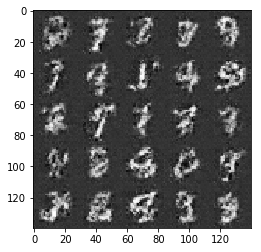

Epoch 2/5... Discriminator Loss: 0.4982... Generator Loss: 2.2508
Epoch 2/5... Discriminator Loss: 0.4761... Generator Loss: 2.8947
Epoch 2/5... Discriminator Loss: 0.4667... Generator Loss: 2.4948
Epoch 2/5... Discriminator Loss: 0.4669... Generator Loss: 2.4968
Epoch 2/5... Discriminator Loss: 0.5086... Generator Loss: 2.2117
Epoch 2/5... Discriminator Loss: 0.4458... Generator Loss: 2.8243
Epoch 2/5... Discriminator Loss: 0.5002... Generator Loss: 2.3314
Epoch 2/5... Discriminator Loss: 0.5271... Generator Loss: 2.9601
Epoch 2/5... Discriminator Loss: 0.5562... Generator Loss: 1.9017
Epoch 2/5... Discriminator Loss: 0.4439... Generator Loss: 2.8935


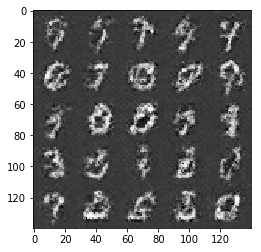

Epoch 2/5... Discriminator Loss: 0.5464... Generator Loss: 2.7301
Epoch 2/5... Discriminator Loss: 0.4957... Generator Loss: 2.3374
Epoch 2/5... Discriminator Loss: 0.5370... Generator Loss: 2.1414
Epoch 3/5... Discriminator Loss: 0.4415... Generator Loss: 2.6769
Epoch 3/5... Discriminator Loss: 0.4524... Generator Loss: 2.9842
Epoch 3/5... Discriminator Loss: 0.4664... Generator Loss: 2.4826
Epoch 3/5... Discriminator Loss: 0.4398... Generator Loss: 2.8767
Epoch 3/5... Discriminator Loss: 0.4758... Generator Loss: 2.3334
Epoch 3/5... Discriminator Loss: 0.5134... Generator Loss: 2.1723
Epoch 3/5... Discriminator Loss: 0.4446... Generator Loss: 2.7448


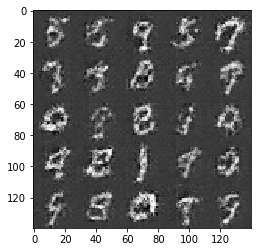

Epoch 3/5... Discriminator Loss: 0.4945... Generator Loss: 3.3032
Epoch 3/5... Discriminator Loss: 0.4261... Generator Loss: 3.0226
Epoch 3/5... Discriminator Loss: 0.5242... Generator Loss: 2.0728
Epoch 3/5... Discriminator Loss: 0.4175... Generator Loss: 3.1965
Epoch 3/5... Discriminator Loss: 3.7605... Generator Loss: 9.5838
Epoch 3/5... Discriminator Loss: 0.6242... Generator Loss: 2.3078
Epoch 3/5... Discriminator Loss: 0.5716... Generator Loss: 1.8593
Epoch 3/5... Discriminator Loss: 0.7306... Generator Loss: 1.3437
Epoch 3/5... Discriminator Loss: 0.5167... Generator Loss: 2.1415
Epoch 3/5... Discriminator Loss: 0.4591... Generator Loss: 2.6680


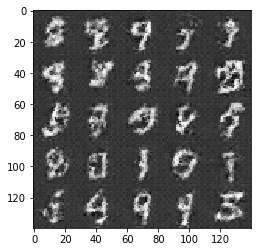

Epoch 3/5... Discriminator Loss: 0.5084... Generator Loss: 2.3960
Epoch 3/5... Discriminator Loss: 0.4819... Generator Loss: 2.3647
Epoch 3/5... Discriminator Loss: 0.5759... Generator Loss: 1.9026
Epoch 3/5... Discriminator Loss: 0.4706... Generator Loss: 2.4574
Epoch 3/5... Discriminator Loss: 0.6403... Generator Loss: 1.7048
Epoch 3/5... Discriminator Loss: 0.4653... Generator Loss: 2.7250
Epoch 3/5... Discriminator Loss: 0.4899... Generator Loss: 2.5577
Epoch 3/5... Discriminator Loss: 0.4747... Generator Loss: 2.7380
Epoch 3/5... Discriminator Loss: 0.4626... Generator Loss: 2.7913
Epoch 3/5... Discriminator Loss: 0.4833... Generator Loss: 2.3212


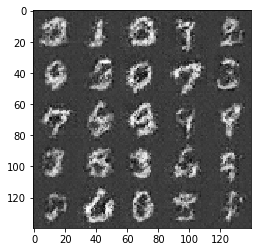

Epoch 3/5... Discriminator Loss: 0.4840... Generator Loss: 2.3116
Epoch 3/5... Discriminator Loss: 0.4827... Generator Loss: 2.3480
Epoch 3/5... Discriminator Loss: 0.5134... Generator Loss: 2.5440
Epoch 3/5... Discriminator Loss: 0.5553... Generator Loss: 1.9414
Epoch 3/5... Discriminator Loss: 0.5193... Generator Loss: 2.7004
Epoch 3/5... Discriminator Loss: 0.5537... Generator Loss: 2.0166
Epoch 3/5... Discriminator Loss: 0.4466... Generator Loss: 2.7993
Epoch 3/5... Discriminator Loss: 0.4504... Generator Loss: 2.6928
Epoch 3/5... Discriminator Loss: 0.5158... Generator Loss: 2.1022
Epoch 3/5... Discriminator Loss: 0.4823... Generator Loss: 2.5622


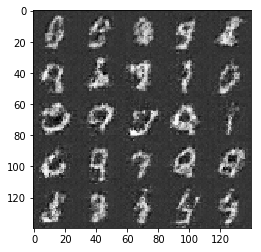

Epoch 3/5... Discriminator Loss: 0.4930... Generator Loss: 2.5070
Epoch 3/5... Discriminator Loss: 0.5072... Generator Loss: 2.2323
Epoch 3/5... Discriminator Loss: 0.4899... Generator Loss: 2.3048
Epoch 3/5... Discriminator Loss: 0.4786... Generator Loss: 3.0797
Epoch 3/5... Discriminator Loss: 0.5404... Generator Loss: 3.2068
Epoch 3/5... Discriminator Loss: 0.4775... Generator Loss: 2.8756
Epoch 3/5... Discriminator Loss: 0.4546... Generator Loss: 2.7877
Epoch 3/5... Discriminator Loss: 0.4420... Generator Loss: 3.1114
Epoch 3/5... Discriminator Loss: 0.4778... Generator Loss: 2.4075
Epoch 3/5... Discriminator Loss: 1.2865... Generator Loss: 4.4173


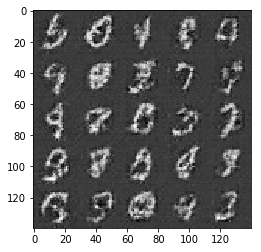

Epoch 4/5... Discriminator Loss: 1.3846... Generator Loss: 4.1886
Epoch 4/5... Discriminator Loss: 0.7027... Generator Loss: 1.7676
Epoch 4/5... Discriminator Loss: 0.5926... Generator Loss: 2.0488
Epoch 4/5... Discriminator Loss: 0.5126... Generator Loss: 2.1399
Epoch 4/5... Discriminator Loss: 0.4808... Generator Loss: 2.5258
Epoch 4/5... Discriminator Loss: 0.5676... Generator Loss: 1.8772
Epoch 4/5... Discriminator Loss: 0.6220... Generator Loss: 1.6517
Epoch 4/5... Discriminator Loss: 0.5116... Generator Loss: 2.3855
Epoch 4/5... Discriminator Loss: 0.5636... Generator Loss: 1.8982
Epoch 4/5... Discriminator Loss: 0.4910... Generator Loss: 2.4008


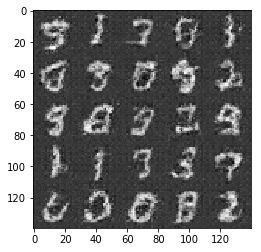

Epoch 4/5... Discriminator Loss: 0.4908... Generator Loss: 2.2870
Epoch 4/5... Discriminator Loss: 0.4345... Generator Loss: 2.9055
Epoch 4/5... Discriminator Loss: 0.4562... Generator Loss: 2.5584
Epoch 4/5... Discriminator Loss: 0.4901... Generator Loss: 2.2756
Epoch 4/5... Discriminator Loss: 0.6873... Generator Loss: 1.5058
Epoch 4/5... Discriminator Loss: 0.4504... Generator Loss: 2.5729
Epoch 4/5... Discriminator Loss: 0.5088... Generator Loss: 2.1970
Epoch 4/5... Discriminator Loss: 0.4254... Generator Loss: 2.9877
Epoch 4/5... Discriminator Loss: 0.4684... Generator Loss: 2.5903
Epoch 4/5... Discriminator Loss: 0.4412... Generator Loss: 3.0676


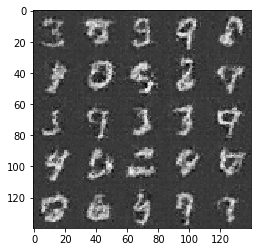

Epoch 4/5... Discriminator Loss: 0.4428... Generator Loss: 2.8375
Epoch 4/5... Discriminator Loss: 0.5094... Generator Loss: 2.2635
Epoch 4/5... Discriminator Loss: 0.4654... Generator Loss: 2.4771
Epoch 4/5... Discriminator Loss: 0.9720... Generator Loss: 1.4055
Epoch 4/5... Discriminator Loss: 0.9872... Generator Loss: 1.5441
Epoch 4/5... Discriminator Loss: 0.8788... Generator Loss: 2.0645
Epoch 4/5... Discriminator Loss: 0.7395... Generator Loss: 1.9936
Epoch 4/5... Discriminator Loss: 0.7664... Generator Loss: 1.2832
Epoch 4/5... Discriminator Loss: 0.5537... Generator Loss: 2.6103
Epoch 4/5... Discriminator Loss: 0.5510... Generator Loss: 2.0079


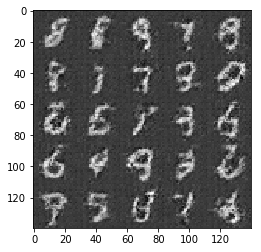

Epoch 4/5... Discriminator Loss: 0.5022... Generator Loss: 2.2193
Epoch 4/5... Discriminator Loss: 0.5482... Generator Loss: 1.9451
Epoch 4/5... Discriminator Loss: 0.5785... Generator Loss: 1.8269
Epoch 4/5... Discriminator Loss: 0.5274... Generator Loss: 2.0371
Epoch 4/5... Discriminator Loss: 0.5084... Generator Loss: 2.3441
Epoch 4/5... Discriminator Loss: 0.5442... Generator Loss: 3.2474
Epoch 4/5... Discriminator Loss: 0.4871... Generator Loss: 2.5120
Epoch 4/5... Discriminator Loss: 0.5235... Generator Loss: 2.8415
Epoch 4/5... Discriminator Loss: 0.5390... Generator Loss: 2.1141
Epoch 4/5... Discriminator Loss: 0.5247... Generator Loss: 2.3013


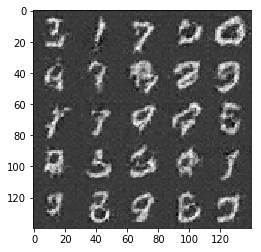

Epoch 4/5... Discriminator Loss: 0.4590... Generator Loss: 2.6773
Epoch 4/5... Discriminator Loss: 0.5247... Generator Loss: 2.1727
Epoch 4/5... Discriminator Loss: 0.4818... Generator Loss: 2.3819
Epoch 4/5... Discriminator Loss: 0.5298... Generator Loss: 2.0219
Epoch 4/5... Discriminator Loss: 0.5763... Generator Loss: 1.9420
Epoch 4/5... Discriminator Loss: 0.6096... Generator Loss: 1.7506
Epoch 4/5... Discriminator Loss: 0.4753... Generator Loss: 2.5120
Epoch 5/5... Discriminator Loss: 0.4625... Generator Loss: 2.5839
Epoch 5/5... Discriminator Loss: 0.4985... Generator Loss: 2.5701
Epoch 5/5... Discriminator Loss: 0.4548... Generator Loss: 2.6455


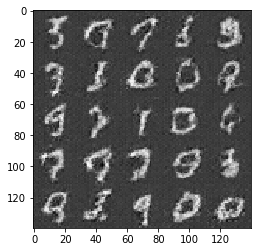

Epoch 5/5... Discriminator Loss: 0.4612... Generator Loss: 2.8649
Epoch 5/5... Discriminator Loss: 0.4309... Generator Loss: 3.1249
Epoch 5/5... Discriminator Loss: 0.5046... Generator Loss: 2.2604
Epoch 5/5... Discriminator Loss: 0.5042... Generator Loss: 2.4789
Epoch 5/5... Discriminator Loss: 0.4389... Generator Loss: 2.9088
Epoch 5/5... Discriminator Loss: 0.4199... Generator Loss: 3.5413
Epoch 5/5... Discriminator Loss: 0.4271... Generator Loss: 3.1401
Epoch 5/5... Discriminator Loss: 0.4384... Generator Loss: 2.9596
Epoch 5/5... Discriminator Loss: 0.4434... Generator Loss: 2.9542
Epoch 5/5... Discriminator Loss: 0.7258... Generator Loss: 1.4035


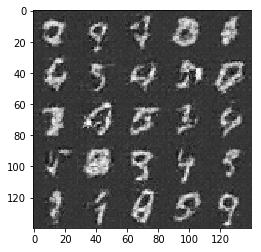

Epoch 5/5... Discriminator Loss: 0.4937... Generator Loss: 2.4004
Epoch 5/5... Discriminator Loss: 0.4438... Generator Loss: 2.9898
Epoch 5/5... Discriminator Loss: 0.4546... Generator Loss: 2.8466
Epoch 5/5... Discriminator Loss: 0.5799... Generator Loss: 1.8303
Epoch 5/5... Discriminator Loss: 0.4924... Generator Loss: 2.2339
Epoch 5/5... Discriminator Loss: 0.4575... Generator Loss: 2.7427
Epoch 5/5... Discriminator Loss: 0.5087... Generator Loss: 2.3993
Epoch 5/5... Discriminator Loss: 0.4828... Generator Loss: 2.7175
Epoch 5/5... Discriminator Loss: 0.5277... Generator Loss: 2.1288
Epoch 5/5... Discriminator Loss: 0.4697... Generator Loss: 2.4200


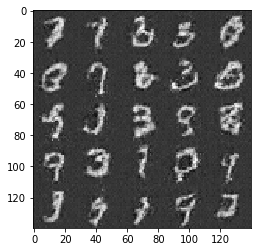

Epoch 5/5... Discriminator Loss: 0.4768... Generator Loss: 2.3753
Epoch 5/5... Discriminator Loss: 0.4238... Generator Loss: 2.9649
Epoch 5/5... Discriminator Loss: 1.2683... Generator Loss: 5.3839
Epoch 5/5... Discriminator Loss: 1.2066... Generator Loss: 0.7642
Epoch 5/5... Discriminator Loss: 0.7345... Generator Loss: 1.4131
Epoch 5/5... Discriminator Loss: 0.5863... Generator Loss: 2.2267
Epoch 5/5... Discriminator Loss: 0.5957... Generator Loss: 1.7517
Epoch 5/5... Discriminator Loss: 0.5529... Generator Loss: 1.9020
Epoch 5/5... Discriminator Loss: 0.5729... Generator Loss: 1.8661
Epoch 5/5... Discriminator Loss: 0.4683... Generator Loss: 2.4069


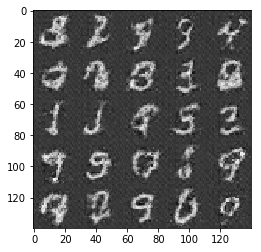

Epoch 5/5... Discriminator Loss: 0.5060... Generator Loss: 2.4176
Epoch 5/5... Discriminator Loss: 0.5692... Generator Loss: 1.8325
Epoch 5/5... Discriminator Loss: 0.5522... Generator Loss: 2.0312
Epoch 5/5... Discriminator Loss: 0.5078... Generator Loss: 2.1665
Epoch 5/5... Discriminator Loss: 0.7078... Generator Loss: 1.4720
Epoch 5/5... Discriminator Loss: 0.5752... Generator Loss: 1.8597
Epoch 5/5... Discriminator Loss: 0.4664... Generator Loss: 2.4357
Epoch 5/5... Discriminator Loss: 0.4640... Generator Loss: 2.5155
Epoch 5/5... Discriminator Loss: 0.5268... Generator Loss: 2.0420
Epoch 5/5... Discriminator Loss: 0.6508... Generator Loss: 1.5927


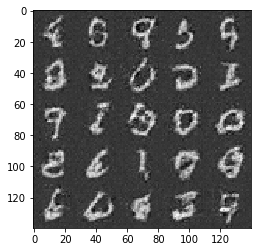

Epoch 5/5... Discriminator Loss: 0.5133... Generator Loss: 2.1797
Epoch 5/5... Discriminator Loss: 0.5451... Generator Loss: 2.0149
Epoch 5/5... Discriminator Loss: 0.4509... Generator Loss: 2.6969
Epoch 5/5... Discriminator Loss: 0.4600... Generator Loss: 2.5733


In [21]:
tf.reset_default_graph()

batch_size = 128
z_dim = 256
learning_rate = 0.00075
beta1 = 0.5

# alpha=0.1


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 5

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

Well, it looks like some hand-written signs, but not digits. We need 11 epochs to produce (with these parameters) something good:

Epoch 11/12... Discriminator Loss: 0.3321... Generator Loss: 3.5459 Epoch 11/12... Discriminator Loss: 0.3796... Generator Loss: 2.8495 Epoch 11/12... Discriminator Loss: 0.3382... Generator Loss: 2.8517 Epoch 11/12... Discriminator Loss: 0.3123... Generator Loss: 2.8906 Epoch 12/12... Discriminator Loss: 0.3607... Generator Loss: 2.4493 Epoch 12/12... Discriminator Loss: 0.2924... Generator Loss: 3.1735 Epoch 12/12... Discriminator Loss: 0.3263... Generator Loss: 2.6983 Epoch 12/12... Discriminator Loss: 0.3968... Generator Loss: 2.1776 Epoch 12/12... Discriminator Loss: 0.2948... Generator Loss: 3.0987 Epoch 12/12... Discriminator Loss: 0.4321... Generator Loss: 1.9879

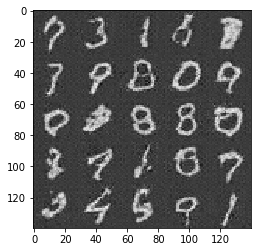

Already with 2 convolutional layers we learn that 2 epochs for MNIST is not enough!

Epoch 1/2... Discriminator Loss: 0.5994... Generator Loss: 1.7615
Epoch 1/2... Discriminator Loss: 0.5286... Generator Loss: 2.0700
Epoch 1/2... Discriminator Loss: 0.4275... Generator Loss: 3.3625
Epoch 1/2... Discriminator Loss: 0.4214... Generator Loss: 3.7293
Epoch 1/2... Discriminator Loss: 0.4311... Generator Loss: 3.6697
Epoch 1/2... Discriminator Loss: 0.5512... Generator Loss: 4.4681
Epoch 1/2... Discriminator Loss: 0.5290... Generator Loss: 2.5458
Epoch 1/2... Discriminator Loss: 0.4667... Generator Loss: 2.6523
Epoch 1/2... Discriminator Loss: 0.4857... Generator Loss: 2.9936
Epoch 1/2... Discriminator Loss: 0.5347... Generator Loss: 2.7381


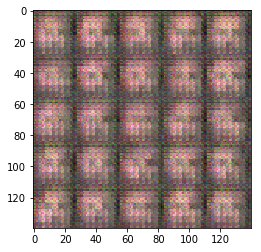

Epoch 1/2... Discriminator Loss: 0.5264... Generator Loss: 2.4063
Epoch 1/2... Discriminator Loss: 0.4830... Generator Loss: 3.2891
Epoch 1/2... Discriminator Loss: 0.5850... Generator Loss: 3.0167
Epoch 1/2... Discriminator Loss: 0.6130... Generator Loss: 2.7461
Epoch 1/2... Discriminator Loss: 0.9064... Generator Loss: 1.0623
Epoch 1/2... Discriminator Loss: 0.7236... Generator Loss: 2.5223
Epoch 1/2... Discriminator Loss: 0.7155... Generator Loss: 2.3446
Epoch 1/2... Discriminator Loss: 0.6989... Generator Loss: 1.5760
Epoch 1/2... Discriminator Loss: 0.8568... Generator Loss: 2.1890
Epoch 1/2... Discriminator Loss: 0.7186... Generator Loss: 2.0411


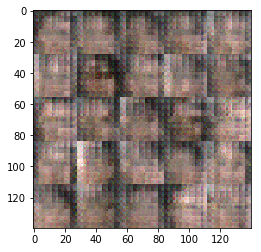

Epoch 1/2... Discriminator Loss: 1.2330... Generator Loss: 3.7465
Epoch 1/2... Discriminator Loss: 0.8901... Generator Loss: 3.0507
Epoch 1/2... Discriminator Loss: 0.8056... Generator Loss: 1.8040
Epoch 1/2... Discriminator Loss: 0.7967... Generator Loss: 1.3656
Epoch 1/2... Discriminator Loss: 0.9301... Generator Loss: 1.8567
Epoch 1/2... Discriminator Loss: 0.8054... Generator Loss: 1.4240
Epoch 1/2... Discriminator Loss: 0.9886... Generator Loss: 1.6694
Epoch 1/2... Discriminator Loss: 1.0505... Generator Loss: 1.1897
Epoch 1/2... Discriminator Loss: 1.0419... Generator Loss: 0.8835
Epoch 1/2... Discriminator Loss: 1.2926... Generator Loss: 0.7344


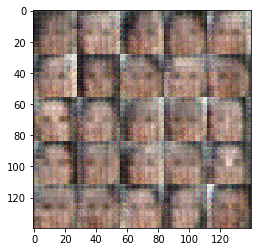

Epoch 1/2... Discriminator Loss: 1.0035... Generator Loss: 1.4796
Epoch 1/2... Discriminator Loss: 0.9759... Generator Loss: 1.4327
Epoch 1/2... Discriminator Loss: 0.9642... Generator Loss: 1.0152
Epoch 1/2... Discriminator Loss: 0.9577... Generator Loss: 1.4454
Epoch 1/2... Discriminator Loss: 1.1766... Generator Loss: 1.3402
Epoch 1/2... Discriminator Loss: 0.9785... Generator Loss: 1.2658
Epoch 1/2... Discriminator Loss: 1.0159... Generator Loss: 1.0374
Epoch 1/2... Discriminator Loss: 1.0688... Generator Loss: 0.9693
Epoch 1/2... Discriminator Loss: 0.9391... Generator Loss: 1.1441
Epoch 1/2... Discriminator Loss: 1.0979... Generator Loss: 1.3421


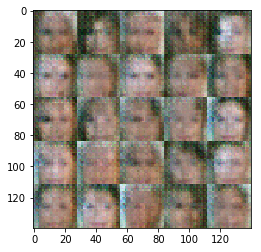

Epoch 1/2... Discriminator Loss: 1.2904... Generator Loss: 1.6604
Epoch 1/2... Discriminator Loss: 1.2488... Generator Loss: 0.8019
Epoch 1/2... Discriminator Loss: 1.0799... Generator Loss: 1.0258
Epoch 1/2... Discriminator Loss: 1.0946... Generator Loss: 2.0070
Epoch 1/2... Discriminator Loss: 1.4636... Generator Loss: 0.5154
Epoch 1/2... Discriminator Loss: 1.1688... Generator Loss: 1.0232
Epoch 1/2... Discriminator Loss: 1.0755... Generator Loss: 1.0756
Epoch 1/2... Discriminator Loss: 0.9911... Generator Loss: 1.2207
Epoch 1/2... Discriminator Loss: 1.2742... Generator Loss: 0.6214
Epoch 1/2... Discriminator Loss: 0.9335... Generator Loss: 1.2916


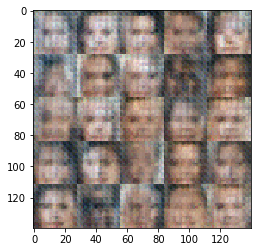

Epoch 1/2... Discriminator Loss: 1.2397... Generator Loss: 0.7773
Epoch 1/2... Discriminator Loss: 1.0199... Generator Loss: 1.0506
Epoch 1/2... Discriminator Loss: 1.2597... Generator Loss: 0.6075
Epoch 1/2... Discriminator Loss: 1.0941... Generator Loss: 1.0798
Epoch 1/2... Discriminator Loss: 1.2999... Generator Loss: 0.6028
Epoch 1/2... Discriminator Loss: 1.0960... Generator Loss: 0.8979
Epoch 1/2... Discriminator Loss: 1.1175... Generator Loss: 1.1681
Epoch 1/2... Discriminator Loss: 1.1905... Generator Loss: 0.8898
Epoch 1/2... Discriminator Loss: 1.1261... Generator Loss: 0.8819
Epoch 1/2... Discriminator Loss: 1.1479... Generator Loss: 1.0039


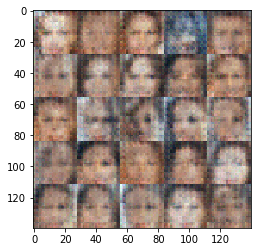

Epoch 1/2... Discriminator Loss: 1.3246... Generator Loss: 2.0740
Epoch 1/2... Discriminator Loss: 1.1466... Generator Loss: 0.9133
Epoch 1/2... Discriminator Loss: 1.1504... Generator Loss: 1.1733
Epoch 1/2... Discriminator Loss: 1.1053... Generator Loss: 1.1224
Epoch 1/2... Discriminator Loss: 1.1355... Generator Loss: 1.2155
Epoch 1/2... Discriminator Loss: 1.1029... Generator Loss: 0.9782
Epoch 1/2... Discriminator Loss: 1.1730... Generator Loss: 0.7190
Epoch 1/2... Discriminator Loss: 1.2145... Generator Loss: 0.7338
Epoch 1/2... Discriminator Loss: 1.0108... Generator Loss: 1.1789
Epoch 1/2... Discriminator Loss: 1.1688... Generator Loss: 0.7878


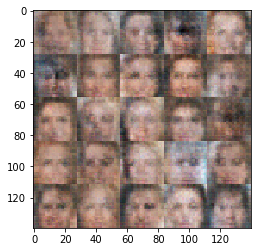

Epoch 1/2... Discriminator Loss: 1.1610... Generator Loss: 1.3286
Epoch 1/2... Discriminator Loss: 1.0707... Generator Loss: 1.0954
Epoch 1/2... Discriminator Loss: 1.1366... Generator Loss: 0.9913
Epoch 1/2... Discriminator Loss: 1.1319... Generator Loss: 1.2623
Epoch 1/2... Discriminator Loss: 1.0818... Generator Loss: 0.9111
Epoch 1/2... Discriminator Loss: 1.1262... Generator Loss: 1.0638
Epoch 1/2... Discriminator Loss: 1.1711... Generator Loss: 1.1553
Epoch 1/2... Discriminator Loss: 1.1783... Generator Loss: 0.7353
Epoch 1/2... Discriminator Loss: 1.2153... Generator Loss: 1.2455
Epoch 1/2... Discriminator Loss: 1.0863... Generator Loss: 1.0055


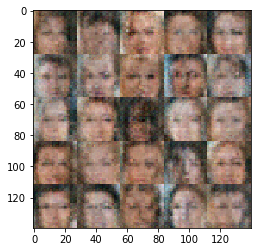

Epoch 1/2... Discriminator Loss: 1.0790... Generator Loss: 0.9387
Epoch 1/2... Discriminator Loss: 1.1365... Generator Loss: 0.8157
Epoch 1/2... Discriminator Loss: 1.0782... Generator Loss: 0.9277
Epoch 1/2... Discriminator Loss: 1.1353... Generator Loss: 1.3485
Epoch 1/2... Discriminator Loss: 1.2377... Generator Loss: 0.7211
Epoch 1/2... Discriminator Loss: 1.1535... Generator Loss: 0.7840
Epoch 1/2... Discriminator Loss: 1.1549... Generator Loss: 0.7541
Epoch 1/2... Discriminator Loss: 1.1816... Generator Loss: 1.3808
Epoch 1/2... Discriminator Loss: 1.2281... Generator Loss: 0.7284
Epoch 1/2... Discriminator Loss: 1.2904... Generator Loss: 1.1808


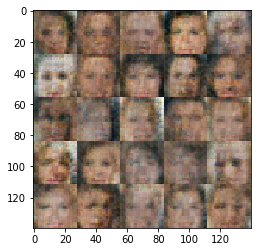

Epoch 1/2... Discriminator Loss: 1.1781... Generator Loss: 1.0333
Epoch 1/2... Discriminator Loss: 1.1956... Generator Loss: 1.0223
Epoch 1/2... Discriminator Loss: 1.1540... Generator Loss: 0.8187
Epoch 1/2... Discriminator Loss: 1.2495... Generator Loss: 0.7706
Epoch 1/2... Discriminator Loss: 1.1770... Generator Loss: 0.8195
Epoch 1/2... Discriminator Loss: 1.1801... Generator Loss: 1.0044
Epoch 1/2... Discriminator Loss: 1.1456... Generator Loss: 1.0353
Epoch 1/2... Discriminator Loss: 1.1786... Generator Loss: 0.7431
Epoch 1/2... Discriminator Loss: 1.2192... Generator Loss: 1.4121
Epoch 1/2... Discriminator Loss: 1.1018... Generator Loss: 1.1880


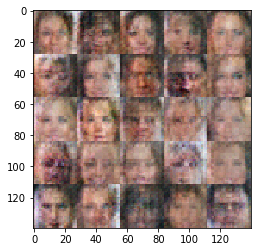

Epoch 1/2... Discriminator Loss: 1.1515... Generator Loss: 0.8623
Epoch 1/2... Discriminator Loss: 1.1222... Generator Loss: 1.3158
Epoch 1/2... Discriminator Loss: 1.2765... Generator Loss: 0.7795
Epoch 1/2... Discriminator Loss: 1.2022... Generator Loss: 1.0483
Epoch 1/2... Discriminator Loss: 1.2591... Generator Loss: 0.7355
Epoch 1/2... Discriminator Loss: 1.2723... Generator Loss: 0.6935
Epoch 1/2... Discriminator Loss: 1.1303... Generator Loss: 0.9296
Epoch 1/2... Discriminator Loss: 1.2221... Generator Loss: 0.8915
Epoch 1/2... Discriminator Loss: 1.2350... Generator Loss: 0.8898
Epoch 1/2... Discriminator Loss: 1.2182... Generator Loss: 0.9276


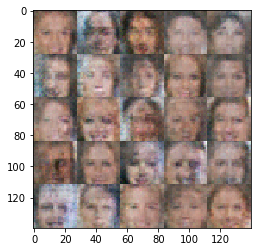

Epoch 1/2... Discriminator Loss: 1.2049... Generator Loss: 0.8069
Epoch 1/2... Discriminator Loss: 1.1568... Generator Loss: 1.0251
Epoch 1/2... Discriminator Loss: 1.2289... Generator Loss: 1.2687
Epoch 1/2... Discriminator Loss: 1.1319... Generator Loss: 1.0951
Epoch 1/2... Discriminator Loss: 1.0898... Generator Loss: 0.8857
Epoch 1/2... Discriminator Loss: 1.2605... Generator Loss: 1.2338
Epoch 1/2... Discriminator Loss: 1.1835... Generator Loss: 0.7830
Epoch 1/2... Discriminator Loss: 1.0720... Generator Loss: 1.1360
Epoch 1/2... Discriminator Loss: 1.1191... Generator Loss: 1.0109
Epoch 1/2... Discriminator Loss: 1.1325... Generator Loss: 1.2419


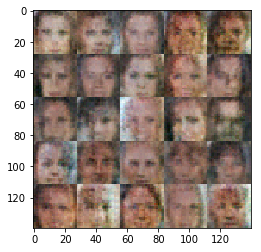

Epoch 1/2... Discriminator Loss: 1.2503... Generator Loss: 0.8343
Epoch 1/2... Discriminator Loss: 1.0848... Generator Loss: 1.1997
Epoch 1/2... Discriminator Loss: 1.1504... Generator Loss: 1.1112
Epoch 1/2... Discriminator Loss: 1.2370... Generator Loss: 0.7504
Epoch 1/2... Discriminator Loss: 1.1663... Generator Loss: 0.8138
Epoch 1/2... Discriminator Loss: 1.1502... Generator Loss: 1.2187
Epoch 1/2... Discriminator Loss: 1.1270... Generator Loss: 0.9732
Epoch 1/2... Discriminator Loss: 1.1781... Generator Loss: 0.9990
Epoch 1/2... Discriminator Loss: 1.1474... Generator Loss: 0.9807
Epoch 1/2... Discriminator Loss: 1.2004... Generator Loss: 1.0911


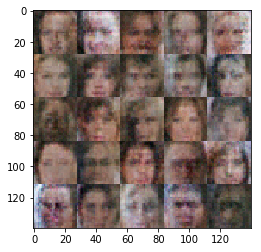

Epoch 1/2... Discriminator Loss: 1.3282... Generator Loss: 0.6592
Epoch 1/2... Discriminator Loss: 1.3002... Generator Loss: 1.1067
Epoch 1/2... Discriminator Loss: 1.1186... Generator Loss: 1.1547
Epoch 1/2... Discriminator Loss: 1.2655... Generator Loss: 0.7228
Epoch 1/2... Discriminator Loss: 1.0871... Generator Loss: 1.0839
Epoch 1/2... Discriminator Loss: 1.2046... Generator Loss: 0.7287
Epoch 1/2... Discriminator Loss: 1.2016... Generator Loss: 0.9645
Epoch 1/2... Discriminator Loss: 1.2025... Generator Loss: 1.0245
Epoch 1/2... Discriminator Loss: 1.1460... Generator Loss: 1.1872
Epoch 1/2... Discriminator Loss: 1.2031... Generator Loss: 1.1603


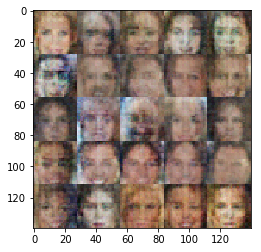

Epoch 1/2... Discriminator Loss: 1.2054... Generator Loss: 0.7522
Epoch 1/2... Discriminator Loss: 1.2780... Generator Loss: 0.6704
Epoch 1/2... Discriminator Loss: 1.2526... Generator Loss: 1.3583
Epoch 1/2... Discriminator Loss: 1.1836... Generator Loss: 0.7311
Epoch 1/2... Discriminator Loss: 1.3077... Generator Loss: 1.0934
Epoch 1/2... Discriminator Loss: 1.3851... Generator Loss: 1.3081
Epoch 1/2... Discriminator Loss: 1.2295... Generator Loss: 0.9320
Epoch 1/2... Discriminator Loss: 1.2583... Generator Loss: 1.0164
Epoch 1/2... Discriminator Loss: 1.2409... Generator Loss: 0.6702
Epoch 1/2... Discriminator Loss: 1.1505... Generator Loss: 0.9987


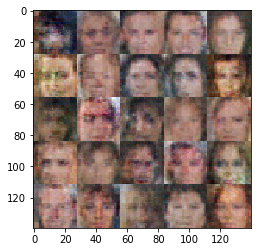

Epoch 1/2... Discriminator Loss: 1.3117... Generator Loss: 1.3457
Epoch 1/2... Discriminator Loss: 1.1948... Generator Loss: 1.3229
Epoch 1/2... Discriminator Loss: 1.1407... Generator Loss: 0.7571
Epoch 1/2... Discriminator Loss: 1.0743... Generator Loss: 1.2580
Epoch 1/2... Discriminator Loss: 1.3698... Generator Loss: 1.4732
Epoch 1/2... Discriminator Loss: 1.1454... Generator Loss: 1.0644
Epoch 1/2... Discriminator Loss: 1.1034... Generator Loss: 1.2094
Epoch 1/2... Discriminator Loss: 1.0013... Generator Loss: 1.5776
Epoch 2/2... Discriminator Loss: 1.2261... Generator Loss: 0.9135
Epoch 2/2... Discriminator Loss: 1.3224... Generator Loss: 0.7107


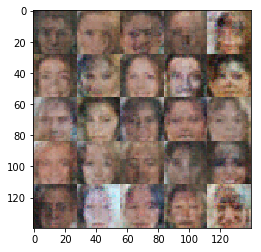

Epoch 2/2... Discriminator Loss: 1.2504... Generator Loss: 0.8266
Epoch 2/2... Discriminator Loss: 1.0712... Generator Loss: 0.9042
Epoch 2/2... Discriminator Loss: 1.2904... Generator Loss: 0.8954
Epoch 2/2... Discriminator Loss: 1.1267... Generator Loss: 1.3272
Epoch 2/2... Discriminator Loss: 1.1585... Generator Loss: 1.0250
Epoch 2/2... Discriminator Loss: 1.1104... Generator Loss: 0.9333
Epoch 2/2... Discriminator Loss: 1.1823... Generator Loss: 0.8648
Epoch 2/2... Discriminator Loss: 1.1312... Generator Loss: 1.0704
Epoch 2/2... Discriminator Loss: 1.2201... Generator Loss: 0.7141
Epoch 2/2... Discriminator Loss: 1.2627... Generator Loss: 0.7356


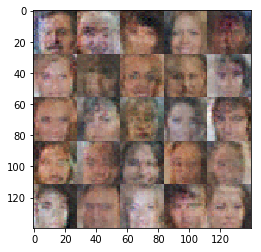

Epoch 2/2... Discriminator Loss: 1.1180... Generator Loss: 0.9759
Epoch 2/2... Discriminator Loss: 1.1476... Generator Loss: 0.8573
Epoch 2/2... Discriminator Loss: 1.3208... Generator Loss: 0.5978
Epoch 2/2... Discriminator Loss: 1.1695... Generator Loss: 0.9495
Epoch 2/2... Discriminator Loss: 1.1355... Generator Loss: 1.1033
Epoch 2/2... Discriminator Loss: 1.1519... Generator Loss: 1.1639
Epoch 2/2... Discriminator Loss: 1.1848... Generator Loss: 0.8548
Epoch 2/2... Discriminator Loss: 1.2260... Generator Loss: 0.7845
Epoch 2/2... Discriminator Loss: 1.1729... Generator Loss: 0.8506
Epoch 2/2... Discriminator Loss: 1.1082... Generator Loss: 1.2013


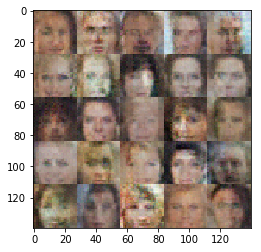

Epoch 2/2... Discriminator Loss: 1.1045... Generator Loss: 1.0145
Epoch 2/2... Discriminator Loss: 1.1904... Generator Loss: 0.7469
Epoch 2/2... Discriminator Loss: 1.2279... Generator Loss: 0.7500
Epoch 2/2... Discriminator Loss: 1.2904... Generator Loss: 0.6365
Epoch 2/2... Discriminator Loss: 1.1934... Generator Loss: 0.8728
Epoch 2/2... Discriminator Loss: 1.2327... Generator Loss: 0.8075
Epoch 2/2... Discriminator Loss: 1.2556... Generator Loss: 0.8763
Epoch 2/2... Discriminator Loss: 1.1660... Generator Loss: 1.0226
Epoch 2/2... Discriminator Loss: 1.3110... Generator Loss: 0.5774
Epoch 2/2... Discriminator Loss: 1.1719... Generator Loss: 1.0538


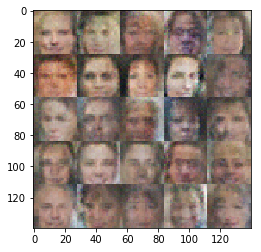

Epoch 2/2... Discriminator Loss: 1.0632... Generator Loss: 1.0164
Epoch 2/2... Discriminator Loss: 1.1225... Generator Loss: 0.9240
Epoch 2/2... Discriminator Loss: 1.1515... Generator Loss: 0.8242
Epoch 2/2... Discriminator Loss: 1.2437... Generator Loss: 1.0563
Epoch 2/2... Discriminator Loss: 1.2195... Generator Loss: 0.7930
Epoch 2/2... Discriminator Loss: 1.1422... Generator Loss: 1.2811
Epoch 2/2... Discriminator Loss: 1.0662... Generator Loss: 1.0938
Epoch 2/2... Discriminator Loss: 0.9119... Generator Loss: 1.5658
Epoch 2/2... Discriminator Loss: 1.2436... Generator Loss: 0.7225
Epoch 2/2... Discriminator Loss: 1.1232... Generator Loss: 0.7805


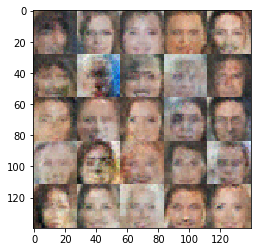

Epoch 2/2... Discriminator Loss: 1.0894... Generator Loss: 1.0095
Epoch 2/2... Discriminator Loss: 1.1159... Generator Loss: 0.8815
Epoch 2/2... Discriminator Loss: 1.1206... Generator Loss: 0.9057
Epoch 2/2... Discriminator Loss: 1.1509... Generator Loss: 0.8572
Epoch 2/2... Discriminator Loss: 1.2376... Generator Loss: 0.7269
Epoch 2/2... Discriminator Loss: 1.2066... Generator Loss: 0.7042
Epoch 2/2... Discriminator Loss: 1.0236... Generator Loss: 1.1766
Epoch 2/2... Discriminator Loss: 1.2778... Generator Loss: 0.6772
Epoch 2/2... Discriminator Loss: 1.1867... Generator Loss: 0.7910
Epoch 2/2... Discriminator Loss: 1.3145... Generator Loss: 0.6957


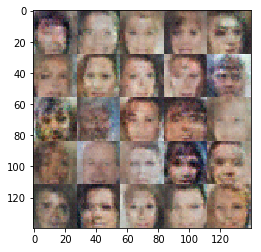

Epoch 2/2... Discriminator Loss: 1.3153... Generator Loss: 0.6061
Epoch 2/2... Discriminator Loss: 1.2771... Generator Loss: 0.7268
Epoch 2/2... Discriminator Loss: 1.1125... Generator Loss: 0.8614
Epoch 2/2... Discriminator Loss: 1.5529... Generator Loss: 0.4109
Epoch 2/2... Discriminator Loss: 1.0445... Generator Loss: 1.2500
Epoch 2/2... Discriminator Loss: 1.1860... Generator Loss: 0.7349
Epoch 2/2... Discriminator Loss: 1.2596... Generator Loss: 0.6463
Epoch 2/2... Discriminator Loss: 1.1094... Generator Loss: 0.8705
Epoch 2/2... Discriminator Loss: 1.3714... Generator Loss: 0.6093
Epoch 2/2... Discriminator Loss: 1.1188... Generator Loss: 0.9773


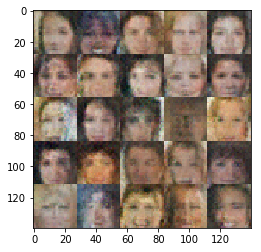

Epoch 2/2... Discriminator Loss: 1.0583... Generator Loss: 1.0354
Epoch 2/2... Discriminator Loss: 1.1301... Generator Loss: 1.2479
Epoch 2/2... Discriminator Loss: 1.0358... Generator Loss: 0.8916
Epoch 2/2... Discriminator Loss: 1.1461... Generator Loss: 0.9091
Epoch 2/2... Discriminator Loss: 1.1440... Generator Loss: 0.8108
Epoch 2/2... Discriminator Loss: 1.1523... Generator Loss: 1.0512
Epoch 2/2... Discriminator Loss: 1.2517... Generator Loss: 0.9142
Epoch 2/2... Discriminator Loss: 1.1018... Generator Loss: 1.0757
Epoch 2/2... Discriminator Loss: 1.1006... Generator Loss: 0.8517
Epoch 2/2... Discriminator Loss: 1.0627... Generator Loss: 0.9132


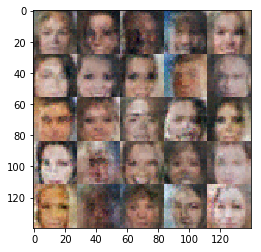

Epoch 2/2... Discriminator Loss: 0.9369... Generator Loss: 1.2275
Epoch 2/2... Discriminator Loss: 1.1630... Generator Loss: 0.7211
Epoch 2/2... Discriminator Loss: 1.0880... Generator Loss: 1.0360
Epoch 2/2... Discriminator Loss: 1.0823... Generator Loss: 1.4215
Epoch 2/2... Discriminator Loss: 1.0222... Generator Loss: 1.0088
Epoch 2/2... Discriminator Loss: 1.2806... Generator Loss: 1.5653
Epoch 2/2... Discriminator Loss: 1.1340... Generator Loss: 1.3291
Epoch 2/2... Discriminator Loss: 1.1021... Generator Loss: 1.2660
Epoch 2/2... Discriminator Loss: 1.0453... Generator Loss: 1.1821
Epoch 2/2... Discriminator Loss: 1.0702... Generator Loss: 1.2930


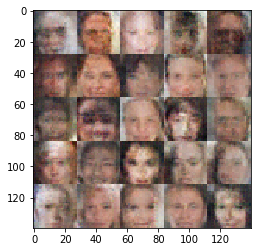

Epoch 2/2... Discriminator Loss: 1.1783... Generator Loss: 0.9452
Epoch 2/2... Discriminator Loss: 1.1381... Generator Loss: 0.8146
Epoch 2/2... Discriminator Loss: 1.0521... Generator Loss: 0.8650
Epoch 2/2... Discriminator Loss: 1.2872... Generator Loss: 0.7413
Epoch 2/2... Discriminator Loss: 1.3164... Generator Loss: 0.6501
Epoch 2/2... Discriminator Loss: 1.1019... Generator Loss: 0.9216
Epoch 2/2... Discriminator Loss: 1.2903... Generator Loss: 0.6084
Epoch 2/2... Discriminator Loss: 1.2031... Generator Loss: 1.1494
Epoch 2/2... Discriminator Loss: 1.1940... Generator Loss: 1.5110
Epoch 2/2... Discriminator Loss: 1.3891... Generator Loss: 0.5300


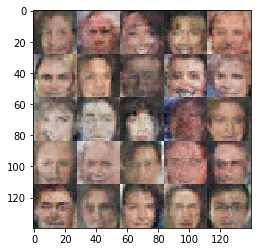

Epoch 2/2... Discriminator Loss: 1.3015... Generator Loss: 0.7630
Epoch 2/2... Discriminator Loss: 1.2939... Generator Loss: 0.7330
Epoch 2/2... Discriminator Loss: 1.1988... Generator Loss: 0.9171
Epoch 2/2... Discriminator Loss: 1.1748... Generator Loss: 0.7680
Epoch 2/2... Discriminator Loss: 0.9309... Generator Loss: 1.3058
Epoch 2/2... Discriminator Loss: 1.0761... Generator Loss: 0.8405
Epoch 2/2... Discriminator Loss: 1.0668... Generator Loss: 0.9701
Epoch 2/2... Discriminator Loss: 1.0796... Generator Loss: 1.5628
Epoch 2/2... Discriminator Loss: 1.1384... Generator Loss: 0.8739
Epoch 2/2... Discriminator Loss: 1.1394... Generator Loss: 1.0788


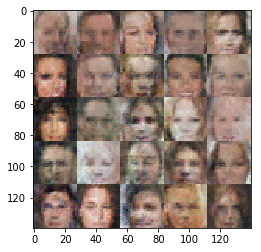

Epoch 2/2... Discriminator Loss: 1.1912... Generator Loss: 0.9142
Epoch 2/2... Discriminator Loss: 1.0363... Generator Loss: 0.9591
Epoch 2/2... Discriminator Loss: 1.1204... Generator Loss: 0.8676
Epoch 2/2... Discriminator Loss: 1.1999... Generator Loss: 0.9751
Epoch 2/2... Discriminator Loss: 1.1476... Generator Loss: 0.8597
Epoch 2/2... Discriminator Loss: 1.0282... Generator Loss: 1.1272
Epoch 2/2... Discriminator Loss: 1.0683... Generator Loss: 1.0497
Epoch 2/2... Discriminator Loss: 1.1718... Generator Loss: 0.8582
Epoch 2/2... Discriminator Loss: 1.3968... Generator Loss: 1.6701
Epoch 2/2... Discriminator Loss: 0.7788... Generator Loss: 1.7101


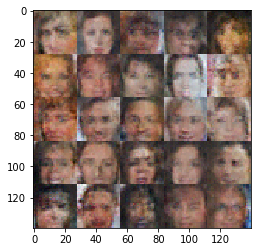

Epoch 2/2... Discriminator Loss: 1.2254... Generator Loss: 1.0848
Epoch 2/2... Discriminator Loss: 0.9806... Generator Loss: 1.2738
Epoch 2/2... Discriminator Loss: 1.1409... Generator Loss: 0.8457
Epoch 2/2... Discriminator Loss: 0.9762... Generator Loss: 1.4119
Epoch 2/2... Discriminator Loss: 1.0710... Generator Loss: 1.2208
Epoch 2/2... Discriminator Loss: 1.0785... Generator Loss: 0.9258
Epoch 2/2... Discriminator Loss: 1.0590... Generator Loss: 1.2138
Epoch 2/2... Discriminator Loss: 1.1091... Generator Loss: 1.2823
Epoch 2/2... Discriminator Loss: 1.2955... Generator Loss: 0.6500
Epoch 2/2... Discriminator Loss: 1.0918... Generator Loss: 0.9250


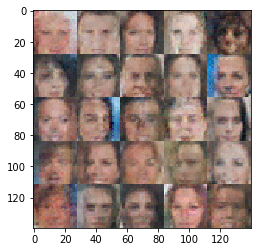

Epoch 2/2... Discriminator Loss: 1.1702... Generator Loss: 1.3550
Epoch 2/2... Discriminator Loss: 1.2194... Generator Loss: 0.9441
Epoch 2/2... Discriminator Loss: 1.2223... Generator Loss: 0.8528
Epoch 2/2... Discriminator Loss: 1.2020... Generator Loss: 0.6914
Epoch 2/2... Discriminator Loss: 1.2637... Generator Loss: 0.7421
Epoch 2/2... Discriminator Loss: 1.0411... Generator Loss: 0.9657
Epoch 2/2... Discriminator Loss: 1.0063... Generator Loss: 1.2887
Epoch 2/2... Discriminator Loss: 1.1276... Generator Loss: 1.1488
Epoch 2/2... Discriminator Loss: 1.2180... Generator Loss: 0.7347
Epoch 2/2... Discriminator Loss: 1.1048... Generator Loss: 0.9515


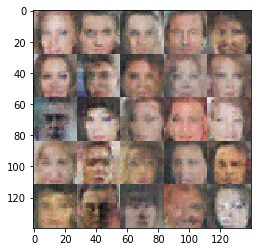

Epoch 2/2... Discriminator Loss: 1.1457... Generator Loss: 1.0733
Epoch 2/2... Discriminator Loss: 1.1347... Generator Loss: 0.7812
Epoch 2/2... Discriminator Loss: 1.3203... Generator Loss: 0.5829
Epoch 2/2... Discriminator Loss: 1.1895... Generator Loss: 0.8254
Epoch 2/2... Discriminator Loss: 1.1543... Generator Loss: 1.3664
Epoch 2/2... Discriminator Loss: 1.2854... Generator Loss: 0.6216
Epoch 2/2... Discriminator Loss: 1.0946... Generator Loss: 1.0830
Epoch 2/2... Discriminator Loss: 1.0375... Generator Loss: 1.3648
Epoch 2/2... Discriminator Loss: 1.1707... Generator Loss: 1.3309
Epoch 2/2... Discriminator Loss: 1.1836... Generator Loss: 0.8193


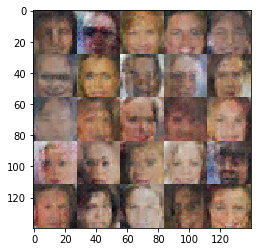

Epoch 2/2... Discriminator Loss: 1.1200... Generator Loss: 1.1374
Epoch 2/2... Discriminator Loss: 1.1075... Generator Loss: 1.0561
Epoch 2/2... Discriminator Loss: 1.0602... Generator Loss: 0.8972
Epoch 2/2... Discriminator Loss: 1.1609... Generator Loss: 1.7289
Epoch 2/2... Discriminator Loss: 1.0749... Generator Loss: 1.2199
Epoch 2/2... Discriminator Loss: 1.1471... Generator Loss: 0.7373
Epoch 2/2... Discriminator Loss: 1.3389... Generator Loss: 0.6921
Epoch 2/2... Discriminator Loss: 1.1749... Generator Loss: 0.7653
Epoch 2/2... Discriminator Loss: 1.0313... Generator Loss: 1.1381
Epoch 2/2... Discriminator Loss: 1.1115... Generator Loss: 1.5439


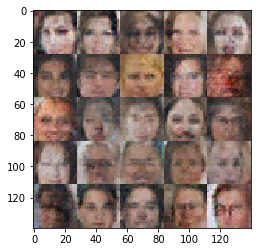

Epoch 2/2... Discriminator Loss: 1.2168... Generator Loss: 0.8072
Epoch 2/2... Discriminator Loss: 1.3820... Generator Loss: 0.6331
Epoch 2/2... Discriminator Loss: 1.1574... Generator Loss: 1.1821
Epoch 2/2... Discriminator Loss: 1.1156... Generator Loss: 1.1511
Epoch 2/2... Discriminator Loss: 1.2372... Generator Loss: 0.7152
Epoch 2/2... Discriminator Loss: 1.1464... Generator Loss: 1.5099


In [22]:
tf.reset_default_graph() # just in case!

#with the same parameters as for digits:
batch_size = 128
z_dim = 256
learning_rate = 0.00075
beta1 = 0.5

# alpha=0.1

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

Probably these are the best images which were produced by a Net with 2 conv layers ( some are best for horror movies):

Epoch 2/2... Discriminator Loss: 1.1702... Generator Loss: 1.3550
Epoch 2/2... Discriminator Loss: 1.2194... Generator Loss: 0.9441
Epoch 2/2... Discriminator Loss: 1.2223... Generator Loss: 0.8528
Epoch 2/2... Discriminator Loss: 1.2020... Generator Loss: 0.6914
Epoch 2/2... Discriminator Loss: 1.2637... Generator Loss: 0.7421
Epoch 2/2... Discriminator Loss: 1.0411... Generator Loss: 0.9657
Epoch 2/2... Discriminator Loss: 1.0063... Generator Loss: 1.2887
Epoch 2/2... Discriminator Loss: 1.1276... Generator Loss: 1.1488
Epoch 2/2... Discriminator Loss: 1.2180... Generator Loss: 0.7347
Epoch 2/2... Discriminator Loss: 1.1048... Generator Loss: 0.9515

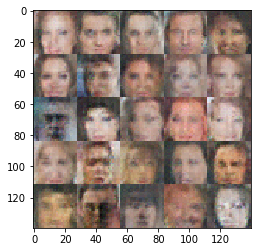

Two epochs are definitely not enough!

Now three convoulutional layers:

In [24]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    alpha=0.1
    reuse = not is_train
    
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x1 = tf.layers.dense(z, 4*4*256)
        
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 4, 4, 256))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # 4x4x256 now
        
        x2 = tf.layers.conv2d_transpose(x1, 128, 4, strides=1, padding='valid')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        # 7x7x128 now
        
        x3 = tf.layers.conv2d_transpose(x2, 64, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        # 14x14x64 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=2, padding='same')
        # 28x28x(3 or 1) now
        
        out = tf.tanh(logits)
        
        return out
    
   


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


In [25]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    alpha=0.1
    
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 28x28x(1 or 3)
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 14x14x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 7x7x128
        
        x3 = tf.layers.conv2d(relu2, 256, 4, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256
        
        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits
        
        
        
        
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


Epoch 1/4... Discriminator Loss: 0.4297... Generator Loss: 7.3726
Epoch 1/4... Discriminator Loss: 0.4701... Generator Loss: 7.1398
Epoch 1/4... Discriminator Loss: 2.1497... Generator Loss: 12.1491
Epoch 1/4... Discriminator Loss: 0.7670... Generator Loss: 11.7137
Epoch 1/4... Discriminator Loss: 1.3037... Generator Loss: 0.5832
Epoch 1/4... Discriminator Loss: 0.4404... Generator Loss: 2.9342
Epoch 1/4... Discriminator Loss: 0.3899... Generator Loss: 3.8087
Epoch 1/4... Discriminator Loss: 0.3816... Generator Loss: 3.9480
Epoch 1/4... Discriminator Loss: 0.4181... Generator Loss: 3.0753
Epoch 1/4... Discriminator Loss: 0.3802... Generator Loss: 3.9423


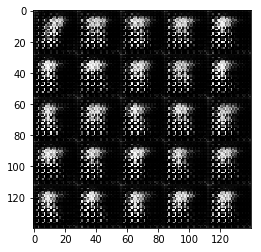

Epoch 1/4... Discriminator Loss: 0.4263... Generator Loss: 3.3077
Epoch 1/4... Discriminator Loss: 0.5026... Generator Loss: 7.8447
Epoch 1/4... Discriminator Loss: 0.9684... Generator Loss: 1.6422
Epoch 1/4... Discriminator Loss: 0.4723... Generator Loss: 2.7540
Epoch 1/4... Discriminator Loss: 0.5333... Generator Loss: 2.1508
Epoch 1/4... Discriminator Loss: 0.5034... Generator Loss: 2.3569
Epoch 1/4... Discriminator Loss: 0.4846... Generator Loss: 6.3461
Epoch 1/4... Discriminator Loss: 0.4482... Generator Loss: 3.3491
Epoch 1/4... Discriminator Loss: 0.4734... Generator Loss: 3.0985
Epoch 1/4... Discriminator Loss: 0.8328... Generator Loss: 2.1521


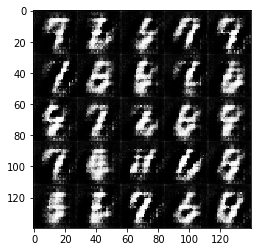

Epoch 1/4... Discriminator Loss: 0.8447... Generator Loss: 1.2501
Epoch 1/4... Discriminator Loss: 0.6492... Generator Loss: 2.8837
Epoch 1/4... Discriminator Loss: 0.5077... Generator Loss: 2.8331
Epoch 1/4... Discriminator Loss: 0.4547... Generator Loss: 2.7361
Epoch 1/4... Discriminator Loss: 0.4268... Generator Loss: 3.9874
Epoch 1/4... Discriminator Loss: 2.6772... Generator Loss: 11.3450
Epoch 1/4... Discriminator Loss: 0.4766... Generator Loss: 2.5522
Epoch 1/4... Discriminator Loss: 1.3296... Generator Loss: 0.6216
Epoch 1/4... Discriminator Loss: 0.5136... Generator Loss: 2.4325
Epoch 1/4... Discriminator Loss: 0.4859... Generator Loss: 2.4290


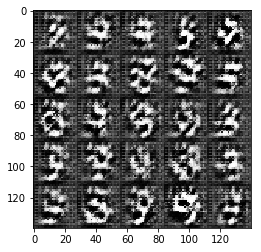

Epoch 1/4... Discriminator Loss: 2.0556... Generator Loss: 9.3610
Epoch 1/4... Discriminator Loss: 0.6845... Generator Loss: 1.7537
Epoch 1/4... Discriminator Loss: 0.5140... Generator Loss: 2.1701
Epoch 1/4... Discriminator Loss: 0.7874... Generator Loss: 1.4187
Epoch 1/4... Discriminator Loss: 0.4289... Generator Loss: 2.8672
Epoch 1/4... Discriminator Loss: 0.5985... Generator Loss: 2.1034
Epoch 1/4... Discriminator Loss: 0.4667... Generator Loss: 2.6043
Epoch 1/4... Discriminator Loss: 0.4138... Generator Loss: 3.0824
Epoch 1/4... Discriminator Loss: 0.6145... Generator Loss: 2.3531
Epoch 1/4... Discriminator Loss: 0.4062... Generator Loss: 3.1364


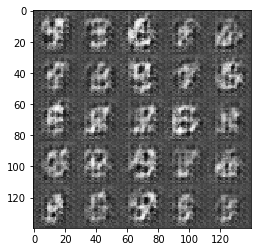

Epoch 1/4... Discriminator Loss: 0.5373... Generator Loss: 2.0740
Epoch 1/4... Discriminator Loss: 0.3972... Generator Loss: 3.3044
Epoch 1/4... Discriminator Loss: 0.7169... Generator Loss: 1.5036
Epoch 1/4... Discriminator Loss: 0.6698... Generator Loss: 1.5520
Epoch 1/4... Discriminator Loss: 0.8173... Generator Loss: 1.2769
Epoch 1/4... Discriminator Loss: 0.5777... Generator Loss: 1.7836
Epoch 2/4... Discriminator Loss: 0.5802... Generator Loss: 1.6575
Epoch 2/4... Discriminator Loss: 0.4686... Generator Loss: 2.2640
Epoch 2/4... Discriminator Loss: 0.4325... Generator Loss: 2.7468
Epoch 2/4... Discriminator Loss: 0.4698... Generator Loss: 3.2174


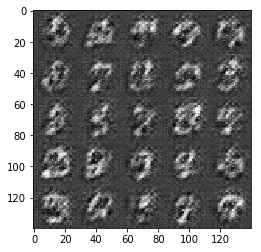

Epoch 2/4... Discriminator Loss: 0.4435... Generator Loss: 2.5432
Epoch 2/4... Discriminator Loss: 0.5044... Generator Loss: 2.3019
Epoch 2/4... Discriminator Loss: 0.3575... Generator Loss: 5.4317
Epoch 2/4... Discriminator Loss: 2.4670... Generator Loss: 3.6952
Epoch 2/4... Discriminator Loss: 0.4810... Generator Loss: 2.5514
Epoch 2/4... Discriminator Loss: 0.5816... Generator Loss: 1.7061
Epoch 2/4... Discriminator Loss: 0.5482... Generator Loss: 1.7915
Epoch 2/4... Discriminator Loss: 0.3811... Generator Loss: 3.4281
Epoch 2/4... Discriminator Loss: 0.4997... Generator Loss: 2.0681
Epoch 2/4... Discriminator Loss: 0.4169... Generator Loss: 2.7146


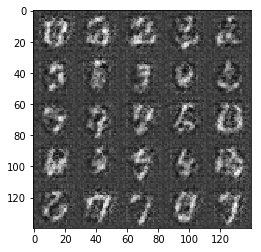

Epoch 2/4... Discriminator Loss: 0.5718... Generator Loss: 1.7347
Epoch 2/4... Discriminator Loss: 0.4199... Generator Loss: 2.7639
Epoch 2/4... Discriminator Loss: 3.3846... Generator Loss: 6.2048
Epoch 2/4... Discriminator Loss: 0.5881... Generator Loss: 2.3941
Epoch 2/4... Discriminator Loss: 0.6528... Generator Loss: 1.4979
Epoch 2/4... Discriminator Loss: 0.5011... Generator Loss: 1.9970
Epoch 2/4... Discriminator Loss: 1.3712... Generator Loss: 0.5708
Epoch 2/4... Discriminator Loss: 0.7202... Generator Loss: 1.3204
Epoch 2/4... Discriminator Loss: 0.5340... Generator Loss: 1.9506
Epoch 2/4... Discriminator Loss: 0.9253... Generator Loss: 0.9386


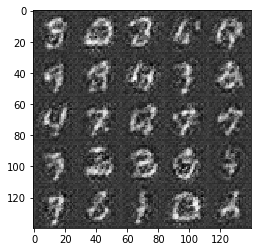

Epoch 2/4... Discriminator Loss: 0.4031... Generator Loss: 3.2707
Epoch 2/4... Discriminator Loss: 0.3967... Generator Loss: 2.9883
Epoch 2/4... Discriminator Loss: 0.3593... Generator Loss: 4.5612
Epoch 2/4... Discriminator Loss: 0.3920... Generator Loss: 3.1265
Epoch 2/4... Discriminator Loss: 0.3622... Generator Loss: 4.2495
Epoch 2/4... Discriminator Loss: 1.6097... Generator Loss: 2.8261
Epoch 2/4... Discriminator Loss: 0.8422... Generator Loss: 1.1682
Epoch 2/4... Discriminator Loss: 1.0091... Generator Loss: 1.7193
Epoch 2/4... Discriminator Loss: 0.7201... Generator Loss: 1.3542
Epoch 2/4... Discriminator Loss: 0.6103... Generator Loss: 2.5212


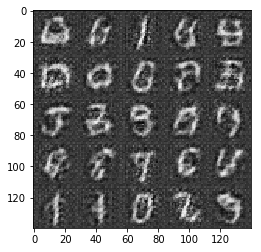

Epoch 2/4... Discriminator Loss: 0.5376... Generator Loss: 2.0955
Epoch 2/4... Discriminator Loss: 0.5466... Generator Loss: 2.0106
Epoch 2/4... Discriminator Loss: 0.5117... Generator Loss: 2.0026
Epoch 2/4... Discriminator Loss: 0.4744... Generator Loss: 2.2347
Epoch 2/4... Discriminator Loss: 0.5890... Generator Loss: 1.6843
Epoch 2/4... Discriminator Loss: 0.4675... Generator Loss: 2.2778
Epoch 2/4... Discriminator Loss: 0.3610... Generator Loss: 4.1398
Epoch 2/4... Discriminator Loss: 0.4722... Generator Loss: 2.2220
Epoch 2/4... Discriminator Loss: 0.3693... Generator Loss: 3.8809
Epoch 2/4... Discriminator Loss: 1.3804... Generator Loss: 2.1368


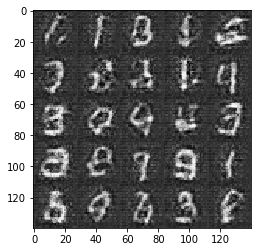

Epoch 2/4... Discriminator Loss: 0.9443... Generator Loss: 1.1515
Epoch 2/4... Discriminator Loss: 1.0742... Generator Loss: 1.4836
Epoch 2/4... Discriminator Loss: 1.2407... Generator Loss: 0.6236
Epoch 3/4... Discriminator Loss: 0.8074... Generator Loss: 1.6738
Epoch 3/4... Discriminator Loss: 0.7456... Generator Loss: 2.2619
Epoch 3/4... Discriminator Loss: 0.7007... Generator Loss: 1.6835
Epoch 3/4... Discriminator Loss: 0.8229... Generator Loss: 3.0684
Epoch 3/4... Discriminator Loss: 0.7327... Generator Loss: 1.3423
Epoch 3/4... Discriminator Loss: 0.8006... Generator Loss: 1.2433
Epoch 3/4... Discriminator Loss: 0.6384... Generator Loss: 1.6868


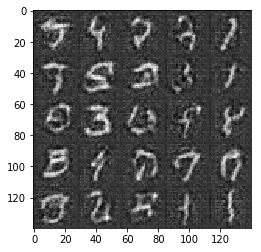

Epoch 3/4... Discriminator Loss: 0.8073... Generator Loss: 2.4311
Epoch 3/4... Discriminator Loss: 0.7101... Generator Loss: 1.3631
Epoch 3/4... Discriminator Loss: 0.5346... Generator Loss: 2.0752
Epoch 3/4... Discriminator Loss: 0.5173... Generator Loss: 2.1500
Epoch 3/4... Discriminator Loss: 0.7168... Generator Loss: 1.3319
Epoch 3/4... Discriminator Loss: 0.5159... Generator Loss: 2.0040
Epoch 3/4... Discriminator Loss: 0.4283... Generator Loss: 2.8464
Epoch 3/4... Discriminator Loss: 0.6460... Generator Loss: 1.5689
Epoch 3/4... Discriminator Loss: 1.3671... Generator Loss: 0.7409
Epoch 3/4... Discriminator Loss: 0.7489... Generator Loss: 1.7157


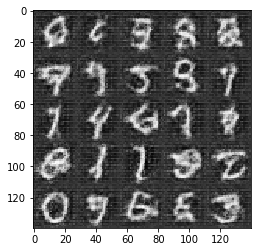

Epoch 3/4... Discriminator Loss: 0.8172... Generator Loss: 1.2248
Epoch 3/4... Discriminator Loss: 1.5822... Generator Loss: 0.4215
Epoch 3/4... Discriminator Loss: 2.2344... Generator Loss: 0.2579
Epoch 3/4... Discriminator Loss: 0.6768... Generator Loss: 1.4611
Epoch 3/4... Discriminator Loss: 0.6209... Generator Loss: 1.7051
Epoch 3/4... Discriminator Loss: 0.9057... Generator Loss: 0.9617
Epoch 3/4... Discriminator Loss: 0.5278... Generator Loss: 1.9119
Epoch 3/4... Discriminator Loss: 0.4350... Generator Loss: 2.7599
Epoch 3/4... Discriminator Loss: 0.3718... Generator Loss: 4.1442
Epoch 3/4... Discriminator Loss: 0.4063... Generator Loss: 2.9294


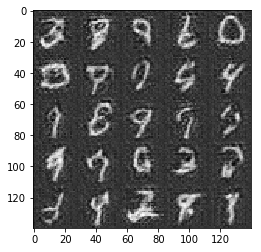

Epoch 3/4... Discriminator Loss: 0.3895... Generator Loss: 3.2675
Epoch 3/4... Discriminator Loss: 0.4598... Generator Loss: 2.4849
Epoch 3/4... Discriminator Loss: 0.5618... Generator Loss: 4.6568
Epoch 3/4... Discriminator Loss: 0.5126... Generator Loss: 2.2063
Epoch 3/4... Discriminator Loss: 0.3657... Generator Loss: 4.4517
Epoch 3/4... Discriminator Loss: 0.4097... Generator Loss: 3.2824
Epoch 3/4... Discriminator Loss: 0.3860... Generator Loss: 3.4093
Epoch 3/4... Discriminator Loss: 0.5503... Generator Loss: 2.8737
Epoch 3/4... Discriminator Loss: 0.7739... Generator Loss: 1.4409
Epoch 3/4... Discriminator Loss: 3.1647... Generator Loss: 0.1041


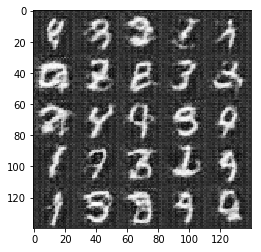

Epoch 3/4... Discriminator Loss: 0.9809... Generator Loss: 2.0210
Epoch 3/4... Discriminator Loss: 0.7993... Generator Loss: 1.2387
Epoch 3/4... Discriminator Loss: 0.7026... Generator Loss: 1.4003
Epoch 3/4... Discriminator Loss: 0.7431... Generator Loss: 1.3061
Epoch 3/4... Discriminator Loss: 0.7715... Generator Loss: 1.3008
Epoch 3/4... Discriminator Loss: 0.3910... Generator Loss: 3.2061
Epoch 3/4... Discriminator Loss: 0.4563... Generator Loss: 4.4995
Epoch 3/4... Discriminator Loss: 0.7198... Generator Loss: 1.4510
Epoch 3/4... Discriminator Loss: 0.8635... Generator Loss: 1.0588
Epoch 3/4... Discriminator Loss: 0.5322... Generator Loss: 2.0519


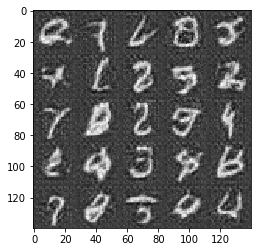

Epoch 4/4... Discriminator Loss: 0.4616... Generator Loss: 2.3754
Epoch 4/4... Discriminator Loss: 0.3918... Generator Loss: 3.3617
Epoch 4/4... Discriminator Loss: 0.5413... Generator Loss: 1.9261
Epoch 4/4... Discriminator Loss: 0.3776... Generator Loss: 3.7103
Epoch 4/4... Discriminator Loss: 0.4000... Generator Loss: 3.0953
Epoch 4/4... Discriminator Loss: 0.3562... Generator Loss: 4.3765
Epoch 4/4... Discriminator Loss: 1.7609... Generator Loss: 0.3954
Epoch 4/4... Discriminator Loss: 0.6119... Generator Loss: 2.1404
Epoch 4/4... Discriminator Loss: 0.6866... Generator Loss: 1.4410
Epoch 4/4... Discriminator Loss: 0.4401... Generator Loss: 2.6309


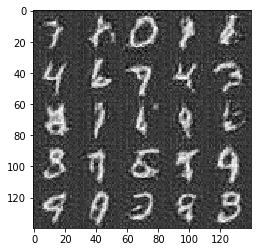

Epoch 4/4... Discriminator Loss: 0.4720... Generator Loss: 2.4147
Epoch 4/4... Discriminator Loss: 0.4315... Generator Loss: 3.7684
Epoch 4/4... Discriminator Loss: 0.6667... Generator Loss: 1.8690
Epoch 4/4... Discriminator Loss: 0.8775... Generator Loss: 1.2814
Epoch 4/4... Discriminator Loss: 0.8964... Generator Loss: 0.9763
Epoch 4/4... Discriminator Loss: 0.6718... Generator Loss: 1.5344
Epoch 4/4... Discriminator Loss: 0.6089... Generator Loss: 1.6175
Epoch 4/4... Discriminator Loss: 0.5194... Generator Loss: 1.9634
Epoch 4/4... Discriminator Loss: 0.3942... Generator Loss: 3.3946
Epoch 4/4... Discriminator Loss: 0.3845... Generator Loss: 3.8029


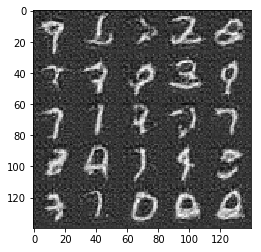

Epoch 4/4... Discriminator Loss: 0.6041... Generator Loss: 3.1521
Epoch 4/4... Discriminator Loss: 0.5234... Generator Loss: 2.1163
Epoch 4/4... Discriminator Loss: 0.5765... Generator Loss: 1.7714
Epoch 4/4... Discriminator Loss: 0.6163... Generator Loss: 1.6017
Epoch 4/4... Discriminator Loss: 0.3710... Generator Loss: 3.6279
Epoch 4/4... Discriminator Loss: 0.5128... Generator Loss: 2.0153
Epoch 4/4... Discriminator Loss: 2.7496... Generator Loss: 0.1526
Epoch 4/4... Discriminator Loss: 1.1204... Generator Loss: 0.8070
Epoch 4/4... Discriminator Loss: 0.9720... Generator Loss: 0.8886
Epoch 4/4... Discriminator Loss: 0.9854... Generator Loss: 2.8020


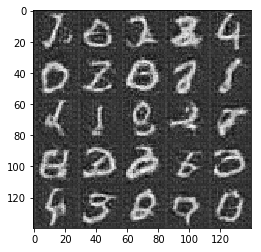

Epoch 4/4... Discriminator Loss: 0.7810... Generator Loss: 1.3899
Epoch 4/4... Discriminator Loss: 0.7013... Generator Loss: 1.5214
Epoch 4/4... Discriminator Loss: 0.9389... Generator Loss: 0.9426
Epoch 4/4... Discriminator Loss: 0.5983... Generator Loss: 1.7794
Epoch 4/4... Discriminator Loss: 0.5559... Generator Loss: 1.9410
Epoch 4/4... Discriminator Loss: 0.4978... Generator Loss: 2.3382
Epoch 4/4... Discriminator Loss: 0.3974... Generator Loss: 3.2933
Epoch 4/4... Discriminator Loss: 0.4142... Generator Loss: 2.9765
Epoch 4/4... Discriminator Loss: 0.4707... Generator Loss: 2.8614
Epoch 4/4... Discriminator Loss: 0.5535... Generator Loss: 1.8034


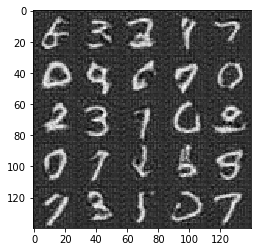

Epoch 4/4... Discriminator Loss: 0.4427... Generator Loss: 2.5259
Epoch 4/4... Discriminator Loss: 0.3832... Generator Loss: 3.4640
Epoch 4/4... Discriminator Loss: 0.7796... Generator Loss: 3.0541
Epoch 4/4... Discriminator Loss: 0.7931... Generator Loss: 1.1671
Epoch 4/4... Discriminator Loss: 0.5131... Generator Loss: 2.0024
Epoch 4/4... Discriminator Loss: 0.4680... Generator Loss: 2.3346
Epoch 4/4... Discriminator Loss: 0.3777... Generator Loss: 3.4568


In [26]:
tf.reset_default_graph() # just in case!

batch_size = 128
z_dim = 1024 # I use large z_dim to make a rich enough choice for the generator. The model is not very sensitive to this parameter
# but z_dim cannot be ridiculously small like z_dim = 4  
learning_rate = 0.00075
beta1 = 0.5

# alpha=0.1

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 4

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

Some images look very nice like hand-written signs. But they are not very close to digits. Probably the DCGAN learned hand-writing. No one explained it the difference between digits , letters and scribbles.

Epoch 4/4... Discriminator Loss: 0.7810... Generator Loss: 1.3899
Epoch 4/4... Discriminator Loss: 0.7013... Generator Loss: 1.5214
Epoch 4/4... Discriminator Loss: 0.9389... Generator Loss: 0.9426
Epoch 4/4... Discriminator Loss: 0.5983... Generator Loss: 1.7794
Epoch 4/4... Discriminator Loss: 0.5559... Generator Loss: 1.9410
Epoch 4/4... Discriminator Loss: 0.4978... Generator Loss: 2.3382
Epoch 4/4... Discriminator Loss: 0.3974... Generator Loss: 3.2933
Epoch 4/4... Discriminator Loss: 0.4142... Generator Loss: 2.9765
Epoch 4/4... Discriminator Loss: 0.4707... Generator Loss: 2.8614
Epoch 4/4... Discriminator Loss: 0.5535... Generator Loss: 1.8034

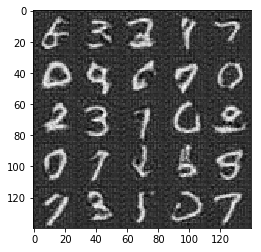

Epoch 1/2... Discriminator Loss: 0.6412... Generator Loss: 14.6272
Epoch 1/2... Discriminator Loss: 0.4601... Generator Loss: 8.3448
Epoch 1/2... Discriminator Loss: 0.6012... Generator Loss: 11.6126
Epoch 1/2... Discriminator Loss: 0.5860... Generator Loss: 6.3056
Epoch 1/2... Discriminator Loss: 0.5590... Generator Loss: 5.3551
Epoch 1/2... Discriminator Loss: 0.6832... Generator Loss: 9.6189
Epoch 1/2... Discriminator Loss: 1.0324... Generator Loss: 13.3414
Epoch 1/2... Discriminator Loss: 0.7069... Generator Loss: 2.1633
Epoch 1/2... Discriminator Loss: 0.5857... Generator Loss: 2.4036
Epoch 1/2... Discriminator Loss: 0.4290... Generator Loss: 4.6141


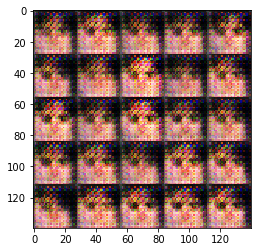

Epoch 1/2... Discriminator Loss: 0.4475... Generator Loss: 2.9545
Epoch 1/2... Discriminator Loss: 0.4093... Generator Loss: 3.7201
Epoch 1/2... Discriminator Loss: 0.5431... Generator Loss: 1.8779
Epoch 1/2... Discriminator Loss: 0.5623... Generator Loss: 1.8851
Epoch 1/2... Discriminator Loss: 2.7825... Generator Loss: 0.1191
Epoch 1/2... Discriminator Loss: 0.7445... Generator Loss: 1.3296
Epoch 1/2... Discriminator Loss: 0.4223... Generator Loss: 3.1251
Epoch 1/2... Discriminator Loss: 0.4391... Generator Loss: 2.9751
Epoch 1/2... Discriminator Loss: 1.7188... Generator Loss: 0.4580
Epoch 1/2... Discriminator Loss: 0.7958... Generator Loss: 3.6277


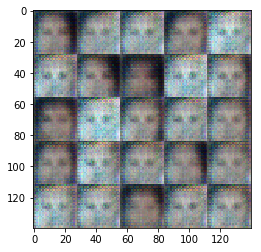

Epoch 1/2... Discriminator Loss: 0.9983... Generator Loss: 2.8817
Epoch 1/2... Discriminator Loss: 0.9134... Generator Loss: 1.0773
Epoch 1/2... Discriminator Loss: 1.1647... Generator Loss: 1.1499
Epoch 1/2... Discriminator Loss: 0.5933... Generator Loss: 2.2511
Epoch 1/2... Discriminator Loss: 0.9663... Generator Loss: 0.9023
Epoch 1/2... Discriminator Loss: 0.8217... Generator Loss: 1.4262
Epoch 1/2... Discriminator Loss: 1.3435... Generator Loss: 1.3162
Epoch 1/2... Discriminator Loss: 2.1461... Generator Loss: 0.2304
Epoch 1/2... Discriminator Loss: 0.4828... Generator Loss: 2.8106
Epoch 1/2... Discriminator Loss: 1.5075... Generator Loss: 0.5126


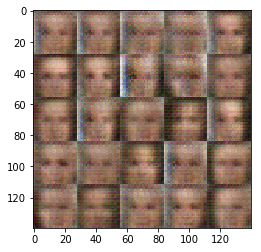

Epoch 1/2... Discriminator Loss: 1.3112... Generator Loss: 0.7694
Epoch 1/2... Discriminator Loss: 0.9379... Generator Loss: 1.5147
Epoch 1/2... Discriminator Loss: 0.8065... Generator Loss: 1.5438
Epoch 1/2... Discriminator Loss: 1.3182... Generator Loss: 2.1405
Epoch 1/2... Discriminator Loss: 0.8679... Generator Loss: 1.3814
Epoch 1/2... Discriminator Loss: 0.6965... Generator Loss: 2.9819
Epoch 1/2... Discriminator Loss: 1.4588... Generator Loss: 0.7148
Epoch 1/2... Discriminator Loss: 1.3117... Generator Loss: 0.7713
Epoch 1/2... Discriminator Loss: 1.0629... Generator Loss: 1.0772
Epoch 1/2... Discriminator Loss: 0.8977... Generator Loss: 1.2084


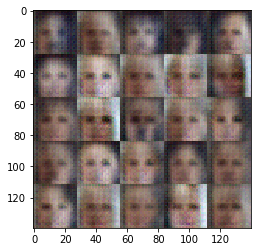

Epoch 1/2... Discriminator Loss: 1.4157... Generator Loss: 5.0340
Epoch 1/2... Discriminator Loss: 0.4238... Generator Loss: 3.9107
Epoch 1/2... Discriminator Loss: 0.7761... Generator Loss: 1.3628
Epoch 1/2... Discriminator Loss: 1.1994... Generator Loss: 1.0101
Epoch 1/2... Discriminator Loss: 0.5753... Generator Loss: 2.1322
Epoch 1/2... Discriminator Loss: 1.3114... Generator Loss: 0.6553
Epoch 1/2... Discriminator Loss: 1.2105... Generator Loss: 0.6833
Epoch 1/2... Discriminator Loss: 1.1652... Generator Loss: 0.7780
Epoch 1/2... Discriminator Loss: 0.6541... Generator Loss: 1.8143
Epoch 1/2... Discriminator Loss: 0.8588... Generator Loss: 1.0605


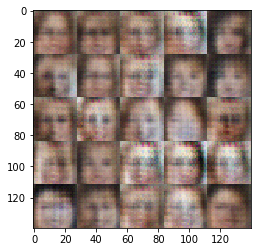

Epoch 1/2... Discriminator Loss: 1.1548... Generator Loss: 0.8428
Epoch 1/2... Discriminator Loss: 1.9518... Generator Loss: 0.2781
Epoch 1/2... Discriminator Loss: 1.1370... Generator Loss: 0.9635
Epoch 1/2... Discriminator Loss: 1.0459... Generator Loss: 1.0200
Epoch 1/2... Discriminator Loss: 1.0922... Generator Loss: 0.8026
Epoch 1/2... Discriminator Loss: 0.7471... Generator Loss: 1.4242
Epoch 1/2... Discriminator Loss: 0.9578... Generator Loss: 1.5136
Epoch 1/2... Discriminator Loss: 1.0337... Generator Loss: 2.3970
Epoch 1/2... Discriminator Loss: 0.5435... Generator Loss: 2.2304
Epoch 1/2... Discriminator Loss: 0.8090... Generator Loss: 1.2147


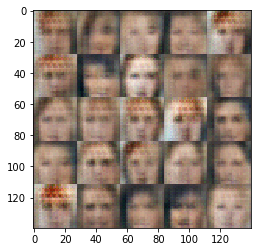

Epoch 1/2... Discriminator Loss: 0.9218... Generator Loss: 1.1958
Epoch 1/2... Discriminator Loss: 0.9658... Generator Loss: 1.0147
Epoch 1/2... Discriminator Loss: 1.4553... Generator Loss: 0.5207
Epoch 1/2... Discriminator Loss: 0.8675... Generator Loss: 1.2145
Epoch 1/2... Discriminator Loss: 1.2652... Generator Loss: 3.7118
Epoch 1/2... Discriminator Loss: 0.7178... Generator Loss: 1.6863
Epoch 1/2... Discriminator Loss: 1.1364... Generator Loss: 0.7768
Epoch 1/2... Discriminator Loss: 0.7285... Generator Loss: 1.9147
Epoch 1/2... Discriminator Loss: 0.9352... Generator Loss: 1.1416
Epoch 1/2... Discriminator Loss: 0.9041... Generator Loss: 1.3587


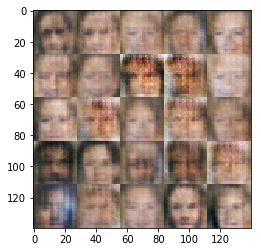

Epoch 1/2... Discriminator Loss: 0.6592... Generator Loss: 2.2218
Epoch 1/2... Discriminator Loss: 1.6251... Generator Loss: 0.5345
Epoch 1/2... Discriminator Loss: 0.6251... Generator Loss: 1.8858
Epoch 1/2... Discriminator Loss: 0.8633... Generator Loss: 1.4341
Epoch 1/2... Discriminator Loss: 1.1368... Generator Loss: 0.7835
Epoch 1/2... Discriminator Loss: 0.7594... Generator Loss: 1.5020
Epoch 1/2... Discriminator Loss: 1.0737... Generator Loss: 0.8443
Epoch 1/2... Discriminator Loss: 0.8159... Generator Loss: 1.4657
Epoch 1/2... Discriminator Loss: 0.8772... Generator Loss: 1.1175
Epoch 1/2... Discriminator Loss: 0.9409... Generator Loss: 1.4795


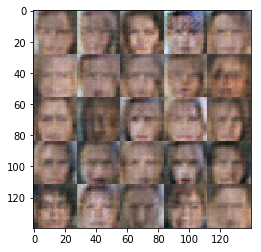

Epoch 1/2... Discriminator Loss: 1.2781... Generator Loss: 0.7133
Epoch 1/2... Discriminator Loss: 0.8686... Generator Loss: 1.1351
Epoch 1/2... Discriminator Loss: 1.2350... Generator Loss: 0.7506
Epoch 1/2... Discriminator Loss: 0.8527... Generator Loss: 1.5191
Epoch 1/2... Discriminator Loss: 0.9106... Generator Loss: 1.0476
Epoch 1/2... Discriminator Loss: 1.4216... Generator Loss: 0.6111
Epoch 1/2... Discriminator Loss: 1.1083... Generator Loss: 0.7843
Epoch 1/2... Discriminator Loss: 1.6316... Generator Loss: 0.4039
Epoch 1/2... Discriminator Loss: 1.3038... Generator Loss: 3.3572
Epoch 1/2... Discriminator Loss: 1.3682... Generator Loss: 0.5796


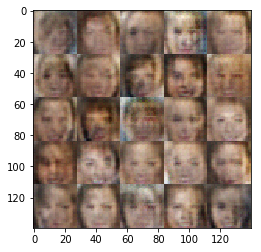

Epoch 1/2... Discriminator Loss: 0.8656... Generator Loss: 2.0375
Epoch 1/2... Discriminator Loss: 0.9255... Generator Loss: 1.4301
Epoch 1/2... Discriminator Loss: 0.8595... Generator Loss: 1.1717
Epoch 1/2... Discriminator Loss: 1.1265... Generator Loss: 1.4716
Epoch 1/2... Discriminator Loss: 1.1430... Generator Loss: 0.8831
Epoch 1/2... Discriminator Loss: 0.9766... Generator Loss: 1.5192
Epoch 1/2... Discriminator Loss: 0.9625... Generator Loss: 1.1274
Epoch 1/2... Discriminator Loss: 0.9248... Generator Loss: 1.1760
Epoch 1/2... Discriminator Loss: 0.9955... Generator Loss: 0.9239
Epoch 1/2... Discriminator Loss: 1.3126... Generator Loss: 3.8488


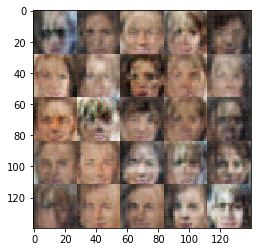

Epoch 1/2... Discriminator Loss: 1.0019... Generator Loss: 1.2505
Epoch 1/2... Discriminator Loss: 1.5599... Generator Loss: 0.4320
Epoch 1/2... Discriminator Loss: 1.1923... Generator Loss: 0.7354
Epoch 1/2... Discriminator Loss: 1.5554... Generator Loss: 0.4406
Epoch 1/2... Discriminator Loss: 1.4684... Generator Loss: 0.5708
Epoch 1/2... Discriminator Loss: 0.7828... Generator Loss: 1.7464
Epoch 1/2... Discriminator Loss: 1.0791... Generator Loss: 0.9738
Epoch 1/2... Discriminator Loss: 0.9201... Generator Loss: 1.5805
Epoch 1/2... Discriminator Loss: 1.6381... Generator Loss: 0.4363
Epoch 1/2... Discriminator Loss: 0.8632... Generator Loss: 1.5240


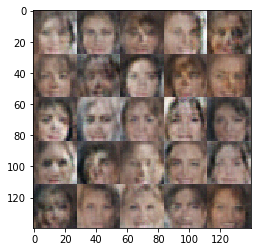

Epoch 1/2... Discriminator Loss: 1.5019... Generator Loss: 2.7140
Epoch 1/2... Discriminator Loss: 1.1436... Generator Loss: 0.8706
Epoch 1/2... Discriminator Loss: 1.0267... Generator Loss: 1.1826
Epoch 1/2... Discriminator Loss: 1.0612... Generator Loss: 0.8841
Epoch 1/2... Discriminator Loss: 0.6978... Generator Loss: 1.7456
Epoch 1/2... Discriminator Loss: 1.4235... Generator Loss: 0.5725
Epoch 1/2... Discriminator Loss: 1.3088... Generator Loss: 0.6407
Epoch 1/2... Discriminator Loss: 1.6308... Generator Loss: 3.0841
Epoch 1/2... Discriminator Loss: 1.1561... Generator Loss: 0.7929
Epoch 1/2... Discriminator Loss: 1.1294... Generator Loss: 0.9039


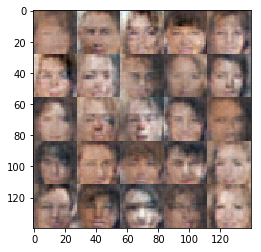

Epoch 1/2... Discriminator Loss: 1.0091... Generator Loss: 1.4270
Epoch 1/2... Discriminator Loss: 1.2075... Generator Loss: 2.1160
Epoch 1/2... Discriminator Loss: 0.8458... Generator Loss: 1.8448
Epoch 1/2... Discriminator Loss: 0.8724... Generator Loss: 1.3940
Epoch 1/2... Discriminator Loss: 1.5777... Generator Loss: 0.4187
Epoch 1/2... Discriminator Loss: 1.0198... Generator Loss: 1.8601
Epoch 1/2... Discriminator Loss: 1.4071... Generator Loss: 0.5473
Epoch 1/2... Discriminator Loss: 1.1624... Generator Loss: 0.7781
Epoch 1/2... Discriminator Loss: 1.1810... Generator Loss: 0.7687
Epoch 1/2... Discriminator Loss: 1.4348... Generator Loss: 0.5593


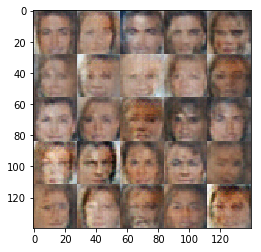

Epoch 1/2... Discriminator Loss: 1.1822... Generator Loss: 0.7129
Epoch 1/2... Discriminator Loss: 1.0968... Generator Loss: 1.0780
Epoch 1/2... Discriminator Loss: 1.1019... Generator Loss: 0.7799
Epoch 1/2... Discriminator Loss: 0.8839... Generator Loss: 1.4892
Epoch 1/2... Discriminator Loss: 1.3506... Generator Loss: 0.5590
Epoch 1/2... Discriminator Loss: 1.2512... Generator Loss: 0.6872
Epoch 1/2... Discriminator Loss: 1.0382... Generator Loss: 1.0095
Epoch 1/2... Discriminator Loss: 1.8164... Generator Loss: 0.3360
Epoch 1/2... Discriminator Loss: 1.1821... Generator Loss: 0.7390
Epoch 1/2... Discriminator Loss: 1.0169... Generator Loss: 1.0401


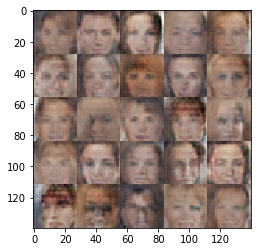

Epoch 1/2... Discriminator Loss: 1.0763... Generator Loss: 1.3595
Epoch 1/2... Discriminator Loss: 1.9410... Generator Loss: 0.3094
Epoch 1/2... Discriminator Loss: 1.2805... Generator Loss: 0.6733
Epoch 1/2... Discriminator Loss: 0.9006... Generator Loss: 1.3031
Epoch 1/2... Discriminator Loss: 1.7130... Generator Loss: 0.4057
Epoch 1/2... Discriminator Loss: 1.4332... Generator Loss: 3.0673
Epoch 1/2... Discriminator Loss: 1.0540... Generator Loss: 1.2402
Epoch 1/2... Discriminator Loss: 1.3510... Generator Loss: 0.5642
Epoch 1/2... Discriminator Loss: 1.2068... Generator Loss: 0.7038
Epoch 1/2... Discriminator Loss: 1.0006... Generator Loss: 1.2369


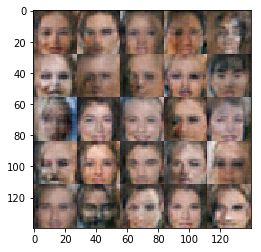

Epoch 1/2... Discriminator Loss: 1.1287... Generator Loss: 0.9884
Epoch 1/2... Discriminator Loss: 1.4351... Generator Loss: 2.6834
Epoch 1/2... Discriminator Loss: 1.2519... Generator Loss: 0.6297
Epoch 1/2... Discriminator Loss: 0.8971... Generator Loss: 1.5731
Epoch 1/2... Discriminator Loss: 1.8728... Generator Loss: 0.3513
Epoch 1/2... Discriminator Loss: 1.0695... Generator Loss: 2.2204
Epoch 1/2... Discriminator Loss: 0.7964... Generator Loss: 1.3835
Epoch 1/2... Discriminator Loss: 1.0116... Generator Loss: 1.0495
Epoch 2/2... Discriminator Loss: 1.4572... Generator Loss: 0.5034
Epoch 2/2... Discriminator Loss: 1.0497... Generator Loss: 2.3870


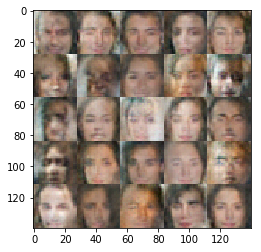

Epoch 2/2... Discriminator Loss: 1.0156... Generator Loss: 0.9313
Epoch 2/2... Discriminator Loss: 1.5608... Generator Loss: 0.4248
Epoch 2/2... Discriminator Loss: 1.7349... Generator Loss: 0.3691
Epoch 2/2... Discriminator Loss: 0.9324... Generator Loss: 1.4970
Epoch 2/2... Discriminator Loss: 1.0952... Generator Loss: 0.7827
Epoch 2/2... Discriminator Loss: 1.2679... Generator Loss: 2.0585
Epoch 2/2... Discriminator Loss: 1.2087... Generator Loss: 0.7846
Epoch 2/2... Discriminator Loss: 0.8746... Generator Loss: 1.6858
Epoch 2/2... Discriminator Loss: 1.3395... Generator Loss: 2.2220
Epoch 2/2... Discriminator Loss: 1.0669... Generator Loss: 0.8597


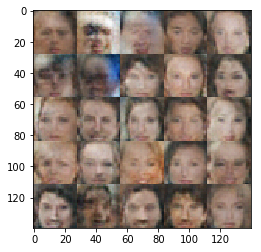

Epoch 2/2... Discriminator Loss: 1.1801... Generator Loss: 2.4779
Epoch 2/2... Discriminator Loss: 0.9786... Generator Loss: 1.7852
Epoch 2/2... Discriminator Loss: 1.0168... Generator Loss: 1.5380
Epoch 2/2... Discriminator Loss: 2.3791... Generator Loss: 0.1833
Epoch 2/2... Discriminator Loss: 1.2278... Generator Loss: 1.2671
Epoch 2/2... Discriminator Loss: 1.1193... Generator Loss: 1.3091
Epoch 2/2... Discriminator Loss: 1.5128... Generator Loss: 0.4525
Epoch 2/2... Discriminator Loss: 1.2972... Generator Loss: 0.6358
Epoch 2/2... Discriminator Loss: 0.9804... Generator Loss: 1.0983
Epoch 2/2... Discriminator Loss: 1.1735... Generator Loss: 0.7318


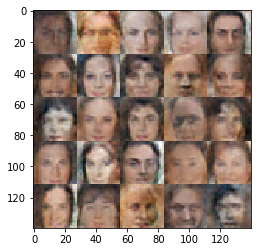

Epoch 2/2... Discriminator Loss: 1.0925... Generator Loss: 1.9897
Epoch 2/2... Discriminator Loss: 1.3234... Generator Loss: 0.6433
Epoch 2/2... Discriminator Loss: 1.0241... Generator Loss: 1.8370
Epoch 2/2... Discriminator Loss: 1.4458... Generator Loss: 0.4914
Epoch 2/2... Discriminator Loss: 1.2192... Generator Loss: 0.7098
Epoch 2/2... Discriminator Loss: 1.2337... Generator Loss: 1.4466
Epoch 2/2... Discriminator Loss: 1.1446... Generator Loss: 0.9235
Epoch 2/2... Discriminator Loss: 1.3825... Generator Loss: 0.5750
Epoch 2/2... Discriminator Loss: 1.0008... Generator Loss: 2.1785
Epoch 2/2... Discriminator Loss: 1.3882... Generator Loss: 0.6145


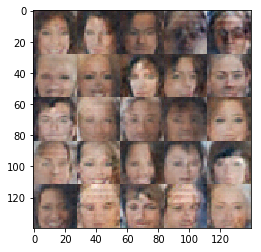

Epoch 2/2... Discriminator Loss: 1.0550... Generator Loss: 0.9618
Epoch 2/2... Discriminator Loss: 0.9379... Generator Loss: 2.1357
Epoch 2/2... Discriminator Loss: 1.8121... Generator Loss: 0.3098
Epoch 2/2... Discriminator Loss: 1.2996... Generator Loss: 0.5968
Epoch 2/2... Discriminator Loss: 1.0811... Generator Loss: 1.0993
Epoch 2/2... Discriminator Loss: 0.9845... Generator Loss: 1.8730
Epoch 2/2... Discriminator Loss: 1.2770... Generator Loss: 0.6749
Epoch 2/2... Discriminator Loss: 1.0202... Generator Loss: 1.0419
Epoch 2/2... Discriminator Loss: 1.1591... Generator Loss: 0.7808
Epoch 2/2... Discriminator Loss: 1.7165... Generator Loss: 3.3864


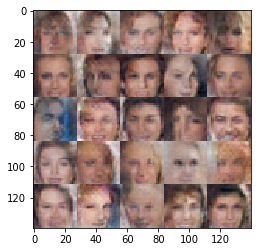

Epoch 2/2... Discriminator Loss: 1.7104... Generator Loss: 0.3916
Epoch 2/2... Discriminator Loss: 1.0010... Generator Loss: 1.3638
Epoch 2/2... Discriminator Loss: 1.6135... Generator Loss: 2.9398
Epoch 2/2... Discriminator Loss: 1.0423... Generator Loss: 1.1510
Epoch 2/2... Discriminator Loss: 1.5238... Generator Loss: 0.4351
Epoch 2/2... Discriminator Loss: 1.0793... Generator Loss: 0.9069
Epoch 2/2... Discriminator Loss: 0.8745... Generator Loss: 1.2207
Epoch 2/2... Discriminator Loss: 1.1216... Generator Loss: 1.0523
Epoch 2/2... Discriminator Loss: 1.4871... Generator Loss: 0.5046
Epoch 2/2... Discriminator Loss: 1.1601... Generator Loss: 0.9378


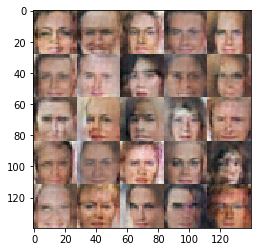

Epoch 2/2... Discriminator Loss: 1.0287... Generator Loss: 1.3035
Epoch 2/2... Discriminator Loss: 1.1184... Generator Loss: 0.7995
Epoch 2/2... Discriminator Loss: 1.0487... Generator Loss: 0.9016
Epoch 2/2... Discriminator Loss: 1.5496... Generator Loss: 0.4693
Epoch 2/2... Discriminator Loss: 0.8616... Generator Loss: 1.6027
Epoch 2/2... Discriminator Loss: 0.9293... Generator Loss: 0.9620
Epoch 2/2... Discriminator Loss: 1.8732... Generator Loss: 0.3227
Epoch 2/2... Discriminator Loss: 1.6362... Generator Loss: 0.4054
Epoch 2/2... Discriminator Loss: 1.2018... Generator Loss: 2.8711
Epoch 2/2... Discriminator Loss: 1.0144... Generator Loss: 0.8979


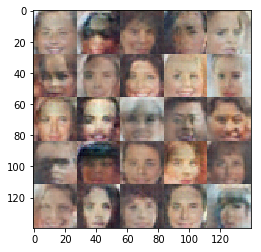

Epoch 2/2... Discriminator Loss: 1.3224... Generator Loss: 0.6119
Epoch 2/2... Discriminator Loss: 1.0840... Generator Loss: 2.7732
Epoch 2/2... Discriminator Loss: 1.1832... Generator Loss: 0.8687
Epoch 2/2... Discriminator Loss: 1.2442... Generator Loss: 0.6835
Epoch 2/2... Discriminator Loss: 0.9659... Generator Loss: 1.0721
Epoch 2/2... Discriminator Loss: 1.5281... Generator Loss: 0.4732
Epoch 2/2... Discriminator Loss: 1.3341... Generator Loss: 0.8968
Epoch 2/2... Discriminator Loss: 0.8735... Generator Loss: 1.2442
Epoch 2/2... Discriminator Loss: 1.0531... Generator Loss: 1.0796
Epoch 2/2... Discriminator Loss: 0.8933... Generator Loss: 1.2739


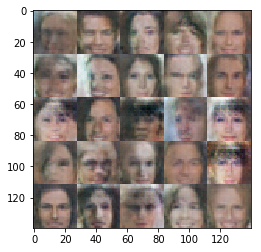

Epoch 2/2... Discriminator Loss: 1.1386... Generator Loss: 0.8103
Epoch 2/2... Discriminator Loss: 1.0778... Generator Loss: 0.9513
Epoch 2/2... Discriminator Loss: 1.1764... Generator Loss: 0.7731
Epoch 2/2... Discriminator Loss: 1.2945... Generator Loss: 1.0245
Epoch 2/2... Discriminator Loss: 1.1350... Generator Loss: 1.2613
Epoch 2/2... Discriminator Loss: 1.0402... Generator Loss: 0.8863
Epoch 2/2... Discriminator Loss: 1.4438... Generator Loss: 0.5176
Epoch 2/2... Discriminator Loss: 1.6833... Generator Loss: 0.4098
Epoch 2/2... Discriminator Loss: 1.2045... Generator Loss: 0.7228
Epoch 2/2... Discriminator Loss: 1.1998... Generator Loss: 0.7843


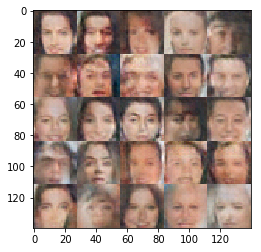

Epoch 2/2... Discriminator Loss: 1.2349... Generator Loss: 0.7847
Epoch 2/2... Discriminator Loss: 1.2585... Generator Loss: 0.6759
Epoch 2/2... Discriminator Loss: 0.8944... Generator Loss: 1.0885
Epoch 2/2... Discriminator Loss: 1.1127... Generator Loss: 1.8997
Epoch 2/2... Discriminator Loss: 1.1588... Generator Loss: 0.7205
Epoch 2/2... Discriminator Loss: 1.0989... Generator Loss: 1.4627
Epoch 2/2... Discriminator Loss: 1.4532... Generator Loss: 2.5056
Epoch 2/2... Discriminator Loss: 1.1969... Generator Loss: 1.1291
Epoch 2/2... Discriminator Loss: 0.9966... Generator Loss: 1.0328
Epoch 2/2... Discriminator Loss: 1.1757... Generator Loss: 0.7073


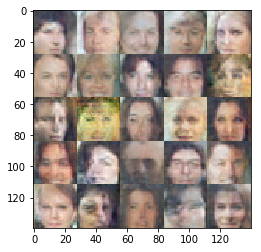

Epoch 2/2... Discriminator Loss: 1.0429... Generator Loss: 0.8977
Epoch 2/2... Discriminator Loss: 2.0713... Generator Loss: 0.2948
Epoch 2/2... Discriminator Loss: 1.5115... Generator Loss: 0.4883
Epoch 2/2... Discriminator Loss: 1.1013... Generator Loss: 0.9185
Epoch 2/2... Discriminator Loss: 2.0727... Generator Loss: 0.2577
Epoch 2/2... Discriminator Loss: 1.4838... Generator Loss: 0.5059
Epoch 2/2... Discriminator Loss: 1.9444... Generator Loss: 0.2872
Epoch 2/2... Discriminator Loss: 1.2490... Generator Loss: 0.6569
Epoch 2/2... Discriminator Loss: 0.9555... Generator Loss: 1.0158
Epoch 2/2... Discriminator Loss: 1.0823... Generator Loss: 1.1507


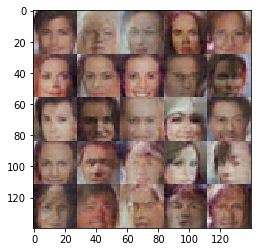

Epoch 2/2... Discriminator Loss: 2.0329... Generator Loss: 0.2681
Epoch 2/2... Discriminator Loss: 1.3660... Generator Loss: 0.5852
Epoch 2/2... Discriminator Loss: 1.2783... Generator Loss: 0.6348
Epoch 2/2... Discriminator Loss: 0.8388... Generator Loss: 2.0540
Epoch 2/2... Discriminator Loss: 0.9768... Generator Loss: 1.4348
Epoch 2/2... Discriminator Loss: 2.4675... Generator Loss: 0.1957
Epoch 2/2... Discriminator Loss: 1.2921... Generator Loss: 0.6830
Epoch 2/2... Discriminator Loss: 1.2795... Generator Loss: 0.6113
Epoch 2/2... Discriminator Loss: 1.1816... Generator Loss: 0.7159
Epoch 2/2... Discriminator Loss: 1.1671... Generator Loss: 2.6583


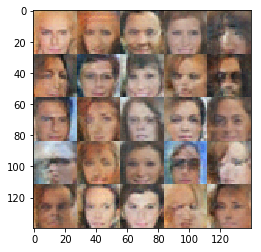

Epoch 2/2... Discriminator Loss: 0.9651... Generator Loss: 1.1646
Epoch 2/2... Discriminator Loss: 1.2245... Generator Loss: 0.6912
Epoch 2/2... Discriminator Loss: 1.4749... Generator Loss: 0.5072
Epoch 2/2... Discriminator Loss: 0.7111... Generator Loss: 1.8428
Epoch 2/2... Discriminator Loss: 1.2213... Generator Loss: 0.8714
Epoch 2/2... Discriminator Loss: 1.1089... Generator Loss: 0.8108
Epoch 2/2... Discriminator Loss: 1.1799... Generator Loss: 1.6152
Epoch 2/2... Discriminator Loss: 0.9263... Generator Loss: 1.3397
Epoch 2/2... Discriminator Loss: 1.5224... Generator Loss: 0.4684
Epoch 2/2... Discriminator Loss: 0.9949... Generator Loss: 0.9415


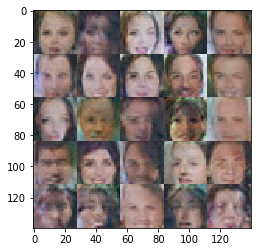

Epoch 2/2... Discriminator Loss: 0.7307... Generator Loss: 1.6131
Epoch 2/2... Discriminator Loss: 0.9652... Generator Loss: 1.7055
Epoch 2/2... Discriminator Loss: 1.9337... Generator Loss: 0.2792
Epoch 2/2... Discriminator Loss: 1.0259... Generator Loss: 0.8765
Epoch 2/2... Discriminator Loss: 1.3627... Generator Loss: 0.5864
Epoch 2/2... Discriminator Loss: 1.3712... Generator Loss: 0.5563
Epoch 2/2... Discriminator Loss: 0.9664... Generator Loss: 1.4936
Epoch 2/2... Discriminator Loss: 1.5598... Generator Loss: 0.4822
Epoch 2/2... Discriminator Loss: 1.4749... Generator Loss: 0.4891
Epoch 2/2... Discriminator Loss: 1.0797... Generator Loss: 0.9436


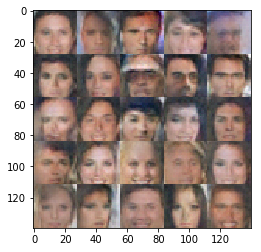

Epoch 2/2... Discriminator Loss: 1.2439... Generator Loss: 0.7077
Epoch 2/2... Discriminator Loss: 1.2671... Generator Loss: 0.7029
Epoch 2/2... Discriminator Loss: 1.3000... Generator Loss: 0.6485
Epoch 2/2... Discriminator Loss: 1.1944... Generator Loss: 0.6901
Epoch 2/2... Discriminator Loss: 1.1405... Generator Loss: 1.2250
Epoch 2/2... Discriminator Loss: 1.4305... Generator Loss: 1.4212
Epoch 2/2... Discriminator Loss: 1.4425... Generator Loss: 0.6859
Epoch 2/2... Discriminator Loss: 1.1016... Generator Loss: 1.1138
Epoch 2/2... Discriminator Loss: 1.4129... Generator Loss: 0.5208
Epoch 2/2... Discriminator Loss: 1.0424... Generator Loss: 1.8611


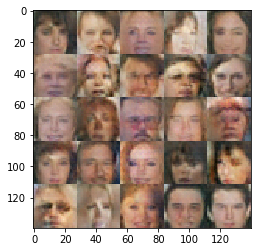

Epoch 2/2... Discriminator Loss: 0.9687... Generator Loss: 1.2859
Epoch 2/2... Discriminator Loss: 1.0363... Generator Loss: 1.5833
Epoch 2/2... Discriminator Loss: 1.0776... Generator Loss: 1.2590
Epoch 2/2... Discriminator Loss: 0.9635... Generator Loss: 1.4301
Epoch 2/2... Discriminator Loss: 1.0442... Generator Loss: 2.6360
Epoch 2/2... Discriminator Loss: 1.2788... Generator Loss: 0.7801
Epoch 2/2... Discriminator Loss: 1.6205... Generator Loss: 0.4151
Epoch 2/2... Discriminator Loss: 1.3625... Generator Loss: 0.7625
Epoch 2/2... Discriminator Loss: 1.0171... Generator Loss: 1.8643
Epoch 2/2... Discriminator Loss: 1.0108... Generator Loss: 1.8505


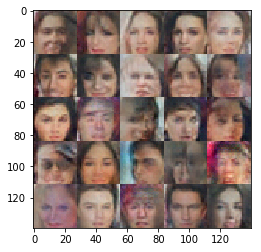

Epoch 2/2... Discriminator Loss: 1.5881... Generator Loss: 0.4100
Epoch 2/2... Discriminator Loss: 1.5777... Generator Loss: 0.4645
Epoch 2/2... Discriminator Loss: 1.2846... Generator Loss: 0.6321
Epoch 2/2... Discriminator Loss: 1.0193... Generator Loss: 0.8796
Epoch 2/2... Discriminator Loss: 1.4100... Generator Loss: 2.9007
Epoch 2/2... Discriminator Loss: 1.4398... Generator Loss: 0.5207


In [27]:
tf.reset_default_graph() # just in case!

batch_size = 128
z_dim = 1024
learning_rate = 0.00075
beta1 = 0.5

# alpha=0.1
# three convolutional layers in the DCGAN

epochs = 2

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

Epoch 2/2... Discriminator Loss: 0.7307... Generator Loss: 1.6131
Epoch 2/2... Discriminator Loss: 0.9652... Generator Loss: 1.7055
Epoch 2/2... Discriminator Loss: 1.9337... Generator Loss: 0.2792
Epoch 2/2... Discriminator Loss: 1.0259... Generator Loss: 0.8765
Epoch 2/2... Discriminator Loss: 1.3627... Generator Loss: 0.5864
Epoch 2/2... Discriminator Loss: 1.3712... Generator Loss: 0.5563
Epoch 2/2... Discriminator Loss: 0.9664... Generator Loss: 1.4936
Epoch 2/2... Discriminator Loss: 1.5598... Generator Loss: 0.4822
Epoch 2/2... Discriminator Loss: 1.4749... Generator Loss: 0.4891
Epoch 2/2... Discriminator Loss: 1.0797... Generator Loss: 0.9436
        
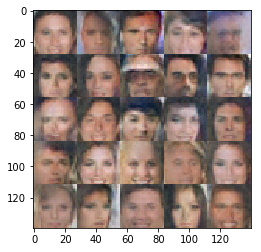

Epoch 2/2... Discriminator Loss: 1.2439... Generator Loss: 0.7077
Epoch 2/2... Discriminator Loss: 1.2671... Generator Loss: 0.7029
Epoch 2/2... Discriminator Loss: 1.3000... Generator Loss: 0.6485
Epoch 2/2... Discriminator Loss: 1.1944... Generator Loss: 0.6901
Epoch 2/2... Discriminator Loss: 1.1405... Generator Loss: 1.2250
Epoch 2/2... Discriminator Loss: 1.4305... Generator Loss: 1.4212
Epoch 2/2... Discriminator Loss: 1.4425... Generator Loss: 0.6859
Epoch 2/2... Discriminator Loss: 1.1016... Generator Loss: 1.1138
Epoch 2/2... Discriminator Loss: 1.4129... Generator Loss: 0.5208
Epoch 2/2... Discriminator Loss: 1.0424... Generator Loss: 1.8611

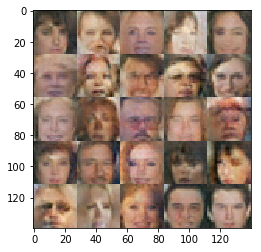

Now is time for a DCGAN with four conv layers. It should be great to fine tune the parameters as I see no reason at all why parameters tuned for a DCGAN with 2 conv layers should fit well DCGANs with three and even four conv layers. However, it will take ages to train all the models needed for fine-tuning. So I just use the old parameters and hope for the best. Let's see what comes out!

In [28]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    alpha=0.1
    reuse = not is_train
    
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x0 = tf.layers.dense(z, 2*2*512)
        
        # Reshape it to start the convolutional stack
        x0 = tf.reshape(x0, (-1, 2, 2, 512))
        x0 = tf.layers.batch_normalization(x0, training=is_train)
        x0 = tf.maximum(alpha * x0, x0)
        # 2x2x512 now
        
        x1 = tf.layers.conv2d_transpose(x0, 256, 5, strides=2, padding='same')       
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # 4x4x256 now
        
        x2 = tf.layers.conv2d_transpose(x1, 128, 4, strides=1, padding='valid')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        # 7x7x128 now
        
        x3 = tf.layers.conv2d_transpose(x2, 64, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        # 14x14x64 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=2, padding='same')
        # 28x28x(3 or 1) now
        
        out = tf.tanh(logits)
        
        return out
    
   


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


In [29]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    alpha=0.1
    
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 28x28x(1 or 3)
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 14x14x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 7x7x128
        
        x3 = tf.layers.conv2d(relu2, 256, 4, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256
        
        x4 = tf.layers.conv2d(relu3, 512, 4, strides=2, padding='same')
        bn4 = tf.layers.batch_normalization(x4, training=True)
        relu4 = tf.maximum(alpha * bn4, bn4)
        # 2x2x512
        
        # Flatten it
        flat = tf.reshape(relu4, (-1, 2*2*512))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits
        
        
        
        
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


Epoch 1/2... Discriminator Loss: 0.4769... Generator Loss: 7.4063
Epoch 1/2... Discriminator Loss: 0.4949... Generator Loss: 2.3059
Epoch 1/2... Discriminator Loss: 0.8844... Generator Loss: 1.1176
Epoch 1/2... Discriminator Loss: 0.4468... Generator Loss: 2.3814
Epoch 1/2... Discriminator Loss: 2.2767... Generator Loss: 9.3423
Epoch 1/2... Discriminator Loss: 1.1543... Generator Loss: 1.4205
Epoch 1/2... Discriminator Loss: 1.0140... Generator Loss: 3.6636
Epoch 1/2... Discriminator Loss: 1.2463... Generator Loss: 0.8608
Epoch 1/2... Discriminator Loss: 0.8381... Generator Loss: 1.6269
Epoch 1/2... Discriminator Loss: 0.6593... Generator Loss: 1.5085


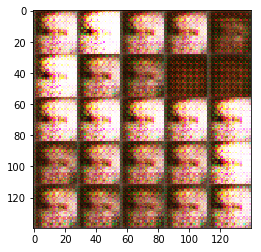

Epoch 1/2... Discriminator Loss: 0.3971... Generator Loss: 3.7895
Epoch 1/2... Discriminator Loss: 0.6814... Generator Loss: 2.4920
Epoch 1/2... Discriminator Loss: 0.7851... Generator Loss: 1.4015
Epoch 1/2... Discriminator Loss: 0.6352... Generator Loss: 1.5881
Epoch 1/2... Discriminator Loss: 0.5875... Generator Loss: 2.6093
Epoch 1/2... Discriminator Loss: 0.6621... Generator Loss: 3.3033
Epoch 1/2... Discriminator Loss: 0.5901... Generator Loss: 1.7138
Epoch 1/2... Discriminator Loss: 2.2878... Generator Loss: 4.2478
Epoch 1/2... Discriminator Loss: 0.7129... Generator Loss: 2.2168
Epoch 1/2... Discriminator Loss: 0.8508... Generator Loss: 1.3164


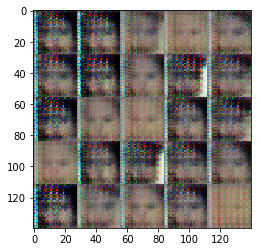

Epoch 1/2... Discriminator Loss: 1.4782... Generator Loss: 0.4398
Epoch 1/2... Discriminator Loss: 0.6911... Generator Loss: 1.3486
Epoch 1/2... Discriminator Loss: 0.5277... Generator Loss: 1.8395
Epoch 1/2... Discriminator Loss: 2.1505... Generator Loss: 5.3932
Epoch 1/2... Discriminator Loss: 0.5642... Generator Loss: 3.0272
Epoch 1/2... Discriminator Loss: 0.8046... Generator Loss: 1.0660
Epoch 1/2... Discriminator Loss: 0.9985... Generator Loss: 1.0619
Epoch 1/2... Discriminator Loss: 1.6201... Generator Loss: 0.4874
Epoch 1/2... Discriminator Loss: 0.9735... Generator Loss: 1.6587
Epoch 1/2... Discriminator Loss: 0.8093... Generator Loss: 3.1187


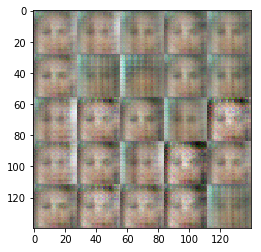

Epoch 1/2... Discriminator Loss: 1.7928... Generator Loss: 0.3872
Epoch 1/2... Discriminator Loss: 1.0787... Generator Loss: 1.2882
Epoch 1/2... Discriminator Loss: 0.8850... Generator Loss: 1.1516
Epoch 1/2... Discriminator Loss: 0.8838... Generator Loss: 1.1251
Epoch 1/2... Discriminator Loss: 1.3677... Generator Loss: 0.4871
Epoch 1/2... Discriminator Loss: 1.0552... Generator Loss: 1.4466
Epoch 1/2... Discriminator Loss: 1.0897... Generator Loss: 1.0679
Epoch 1/2... Discriminator Loss: 1.2928... Generator Loss: 3.3861
Epoch 1/2... Discriminator Loss: 1.6943... Generator Loss: 0.3898
Epoch 1/2... Discriminator Loss: 1.7113... Generator Loss: 0.4204


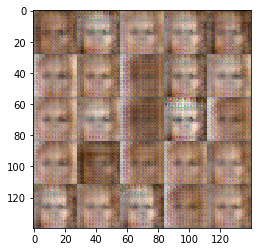

Epoch 1/2... Discriminator Loss: 0.9303... Generator Loss: 3.1600
Epoch 1/2... Discriminator Loss: 0.8310... Generator Loss: 1.4431
Epoch 1/2... Discriminator Loss: 1.3978... Generator Loss: 0.6177
Epoch 1/2... Discriminator Loss: 0.8009... Generator Loss: 1.7338
Epoch 1/2... Discriminator Loss: 1.1358... Generator Loss: 0.6956
Epoch 1/2... Discriminator Loss: 0.5813... Generator Loss: 2.2171
Epoch 1/2... Discriminator Loss: 0.8120... Generator Loss: 2.3562
Epoch 1/2... Discriminator Loss: 0.6094... Generator Loss: 3.2418
Epoch 1/2... Discriminator Loss: 1.8902... Generator Loss: 5.4233
Epoch 1/2... Discriminator Loss: 0.7223... Generator Loss: 2.3893


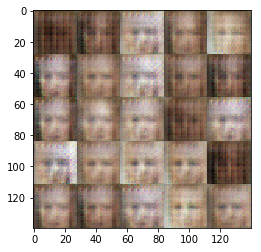

Epoch 1/2... Discriminator Loss: 0.8296... Generator Loss: 1.1972
Epoch 1/2... Discriminator Loss: 0.4984... Generator Loss: 2.2583
Epoch 1/2... Discriminator Loss: 0.9186... Generator Loss: 1.7734
Epoch 1/2... Discriminator Loss: 0.7937... Generator Loss: 1.4730
Epoch 1/2... Discriminator Loss: 0.8139... Generator Loss: 2.5482
Epoch 1/2... Discriminator Loss: 0.6930... Generator Loss: 1.6496
Epoch 1/2... Discriminator Loss: 0.5022... Generator Loss: 2.9534
Epoch 1/2... Discriminator Loss: 0.6807... Generator Loss: 1.5746
Epoch 1/2... Discriminator Loss: 0.6888... Generator Loss: 2.3656
Epoch 1/2... Discriminator Loss: 0.8428... Generator Loss: 1.1279


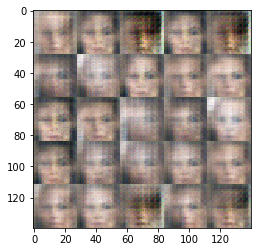

Epoch 1/2... Discriminator Loss: 0.5884... Generator Loss: 2.5634
Epoch 1/2... Discriminator Loss: 0.6812... Generator Loss: 3.3351
Epoch 1/2... Discriminator Loss: 0.6804... Generator Loss: 2.7796
Epoch 1/2... Discriminator Loss: 0.6659... Generator Loss: 2.8521
Epoch 1/2... Discriminator Loss: 1.1021... Generator Loss: 0.8045
Epoch 1/2... Discriminator Loss: 0.8282... Generator Loss: 2.4945
Epoch 1/2... Discriminator Loss: 2.3925... Generator Loss: 7.6794
Epoch 1/2... Discriminator Loss: 0.5868... Generator Loss: 2.3205
Epoch 1/2... Discriminator Loss: 1.1638... Generator Loss: 0.6624
Epoch 1/2... Discriminator Loss: 0.5038... Generator Loss: 3.1546


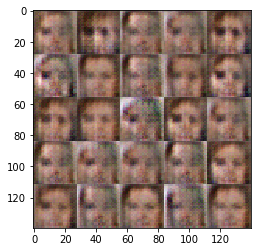

Epoch 1/2... Discriminator Loss: 0.6833... Generator Loss: 2.7358
Epoch 1/2... Discriminator Loss: 1.0480... Generator Loss: 2.3780
Epoch 1/2... Discriminator Loss: 0.7293... Generator Loss: 3.4487
Epoch 1/2... Discriminator Loss: 0.9870... Generator Loss: 3.9351
Epoch 1/2... Discriminator Loss: 0.6421... Generator Loss: 4.5658
Epoch 1/2... Discriminator Loss: 0.9179... Generator Loss: 1.0013
Epoch 1/2... Discriminator Loss: 1.0989... Generator Loss: 0.7809
Epoch 1/2... Discriminator Loss: 0.8901... Generator Loss: 1.0980
Epoch 1/2... Discriminator Loss: 0.4282... Generator Loss: 4.0275
Epoch 1/2... Discriminator Loss: 0.6417... Generator Loss: 1.9173


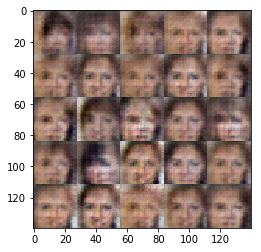

Epoch 1/2... Discriminator Loss: 0.8493... Generator Loss: 1.1297
Epoch 1/2... Discriminator Loss: 0.4367... Generator Loss: 3.2401
Epoch 1/2... Discriminator Loss: 1.4847... Generator Loss: 0.5904
Epoch 1/2... Discriminator Loss: 1.5363... Generator Loss: 4.7590
Epoch 1/2... Discriminator Loss: 0.7786... Generator Loss: 1.5852
Epoch 1/2... Discriminator Loss: 0.5168... Generator Loss: 2.9160
Epoch 1/2... Discriminator Loss: 1.2032... Generator Loss: 5.9951
Epoch 1/2... Discriminator Loss: 0.9755... Generator Loss: 0.8443
Epoch 1/2... Discriminator Loss: 0.5669... Generator Loss: 2.7330
Epoch 1/2... Discriminator Loss: 0.6346... Generator Loss: 1.9608


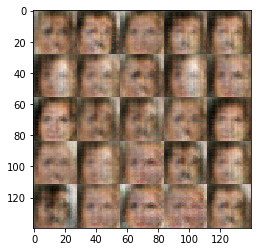

Epoch 1/2... Discriminator Loss: 0.6344... Generator Loss: 1.8502
Epoch 1/2... Discriminator Loss: 0.6644... Generator Loss: 1.7435
Epoch 1/2... Discriminator Loss: 0.7905... Generator Loss: 1.3416
Epoch 1/2... Discriminator Loss: 0.4666... Generator Loss: 2.3770
Epoch 1/2... Discriminator Loss: 0.6523... Generator Loss: 2.4337
Epoch 1/2... Discriminator Loss: 1.0820... Generator Loss: 5.1303
Epoch 1/2... Discriminator Loss: 0.5930... Generator Loss: 3.2352
Epoch 1/2... Discriminator Loss: 4.9347... Generator Loss: 8.7027
Epoch 1/2... Discriminator Loss: 0.6487... Generator Loss: 1.7435
Epoch 1/2... Discriminator Loss: 0.6599... Generator Loss: 1.5993


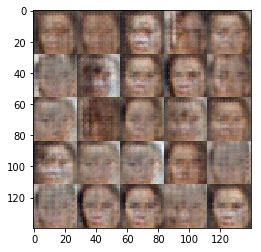

Epoch 1/2... Discriminator Loss: 0.7293... Generator Loss: 2.0272
Epoch 1/2... Discriminator Loss: 0.5645... Generator Loss: 3.0575
Epoch 1/2... Discriminator Loss: 0.5762... Generator Loss: 2.6722
Epoch 1/2... Discriminator Loss: 0.8107... Generator Loss: 3.0476
Epoch 1/2... Discriminator Loss: 0.5553... Generator Loss: 3.8394
Epoch 1/2... Discriminator Loss: 0.9064... Generator Loss: 1.0723
Epoch 1/2... Discriminator Loss: 1.1200... Generator Loss: 3.1627
Epoch 1/2... Discriminator Loss: 0.6522... Generator Loss: 1.6863
Epoch 1/2... Discriminator Loss: 1.4475... Generator Loss: 6.5116
Epoch 1/2... Discriminator Loss: 0.7373... Generator Loss: 1.2985


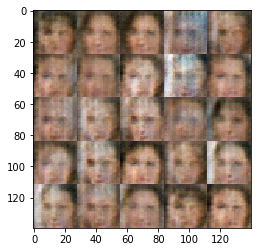

Epoch 1/2... Discriminator Loss: 0.7139... Generator Loss: 1.4930
Epoch 1/2... Discriminator Loss: 0.5365... Generator Loss: 2.0669
Epoch 1/2... Discriminator Loss: 0.7951... Generator Loss: 1.2713
Epoch 1/2... Discriminator Loss: 0.6655... Generator Loss: 3.3411
Epoch 1/2... Discriminator Loss: 0.8596... Generator Loss: 1.9030
Epoch 1/2... Discriminator Loss: 1.1699... Generator Loss: 4.1131
Epoch 1/2... Discriminator Loss: 0.5715... Generator Loss: 2.0838
Epoch 1/2... Discriminator Loss: 0.4704... Generator Loss: 2.9863
Epoch 1/2... Discriminator Loss: 0.6192... Generator Loss: 1.6235
Epoch 1/2... Discriminator Loss: 0.7146... Generator Loss: 1.4613


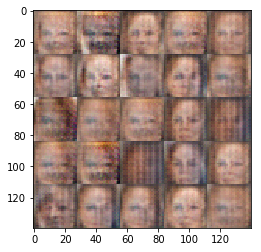

Epoch 1/2... Discriminator Loss: 0.8343... Generator Loss: 1.1243
Epoch 1/2... Discriminator Loss: 0.4819... Generator Loss: 2.7288
Epoch 1/2... Discriminator Loss: 0.6938... Generator Loss: 1.6296
Epoch 1/2... Discriminator Loss: 0.7401... Generator Loss: 1.7366
Epoch 1/2... Discriminator Loss: 0.9095... Generator Loss: 0.9578
Epoch 1/2... Discriminator Loss: 0.8829... Generator Loss: 1.0183
Epoch 1/2... Discriminator Loss: 0.6404... Generator Loss: 1.5937
Epoch 1/2... Discriminator Loss: 0.5294... Generator Loss: 2.0666
Epoch 1/2... Discriminator Loss: 0.6979... Generator Loss: 1.5730
Epoch 1/2... Discriminator Loss: 0.8660... Generator Loss: 1.1311


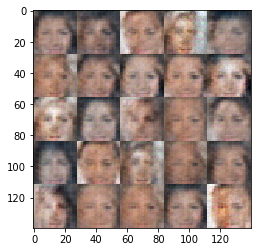

Epoch 1/2... Discriminator Loss: 1.0134... Generator Loss: 0.8444
Epoch 1/2... Discriminator Loss: 0.8607... Generator Loss: 1.1049
Epoch 1/2... Discriminator Loss: 0.8612... Generator Loss: 1.1872
Epoch 1/2... Discriminator Loss: 1.1118... Generator Loss: 0.8610
Epoch 1/2... Discriminator Loss: 0.7238... Generator Loss: 1.3848
Epoch 1/2... Discriminator Loss: 0.9129... Generator Loss: 0.9760
Epoch 1/2... Discriminator Loss: 0.4915... Generator Loss: 2.6118
Epoch 1/2... Discriminator Loss: 0.5774... Generator Loss: 1.8217
Epoch 1/2... Discriminator Loss: 0.6822... Generator Loss: 3.7127
Epoch 1/2... Discriminator Loss: 0.6210... Generator Loss: 1.8440


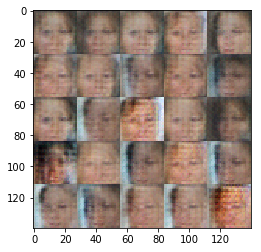

Epoch 1/2... Discriminator Loss: 0.7978... Generator Loss: 1.1801
Epoch 1/2... Discriminator Loss: 0.7461... Generator Loss: 1.2359
Epoch 1/2... Discriminator Loss: 0.7273... Generator Loss: 1.8756
Epoch 1/2... Discriminator Loss: 0.6249... Generator Loss: 1.6090
Epoch 1/2... Discriminator Loss: 0.9656... Generator Loss: 0.9487
Epoch 1/2... Discriminator Loss: 0.7795... Generator Loss: 1.4688
Epoch 1/2... Discriminator Loss: 0.6939... Generator Loss: 4.9490
Epoch 1/2... Discriminator Loss: 0.6272... Generator Loss: 2.8769
Epoch 1/2... Discriminator Loss: 0.5573... Generator Loss: 3.9042
Epoch 1/2... Discriminator Loss: 0.5435... Generator Loss: 2.5943


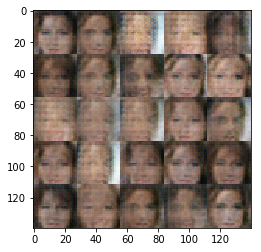

Epoch 1/2... Discriminator Loss: 0.6252... Generator Loss: 1.7748
Epoch 1/2... Discriminator Loss: 2.7194... Generator Loss: 6.3025
Epoch 1/2... Discriminator Loss: 0.5624... Generator Loss: 2.5698
Epoch 1/2... Discriminator Loss: 1.0461... Generator Loss: 4.7928
Epoch 1/2... Discriminator Loss: 0.7315... Generator Loss: 1.5359
Epoch 1/2... Discriminator Loss: 1.0144... Generator Loss: 0.8976
Epoch 1/2... Discriminator Loss: 0.5445... Generator Loss: 1.9659
Epoch 1/2... Discriminator Loss: 1.7075... Generator Loss: 5.5555
Epoch 2/2... Discriminator Loss: 0.5322... Generator Loss: 2.3945
Epoch 2/2... Discriminator Loss: 0.5336... Generator Loss: 2.8463


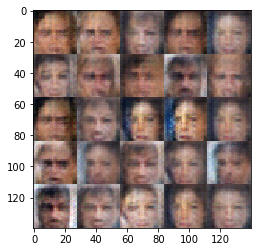

Epoch 2/2... Discriminator Loss: 0.5516... Generator Loss: 2.0239
Epoch 2/2... Discriminator Loss: 0.5329... Generator Loss: 2.1147
Epoch 2/2... Discriminator Loss: 0.6762... Generator Loss: 3.7087
Epoch 2/2... Discriminator Loss: 0.8544... Generator Loss: 1.4936
Epoch 2/2... Discriminator Loss: 0.5950... Generator Loss: 1.8218
Epoch 2/2... Discriminator Loss: 0.7680... Generator Loss: 1.3370
Epoch 2/2... Discriminator Loss: 0.5213... Generator Loss: 2.2718
Epoch 2/2... Discriminator Loss: 0.5562... Generator Loss: 1.7975
Epoch 2/2... Discriminator Loss: 0.5038... Generator Loss: 2.8458
Epoch 2/2... Discriminator Loss: 0.5179... Generator Loss: 2.0936


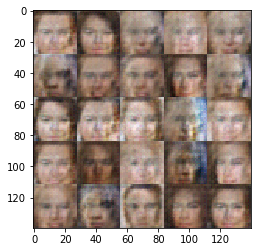

Epoch 2/2... Discriminator Loss: 0.8210... Generator Loss: 1.1271
Epoch 2/2... Discriminator Loss: 0.5072... Generator Loss: 2.2398
Epoch 2/2... Discriminator Loss: 0.6352... Generator Loss: 1.7874
Epoch 2/2... Discriminator Loss: 0.6688... Generator Loss: 1.6106
Epoch 2/2... Discriminator Loss: 0.6384... Generator Loss: 1.6517
Epoch 2/2... Discriminator Loss: 0.6658... Generator Loss: 3.0643
Epoch 2/2... Discriminator Loss: 0.5988... Generator Loss: 1.9418
Epoch 2/2... Discriminator Loss: 0.9719... Generator Loss: 3.4781
Epoch 2/2... Discriminator Loss: 0.5375... Generator Loss: 2.0911
Epoch 2/2... Discriminator Loss: 0.5737... Generator Loss: 5.3835


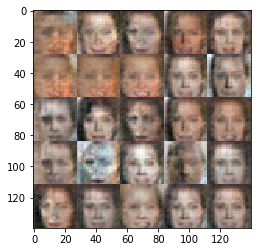

Epoch 2/2... Discriminator Loss: 0.7382... Generator Loss: 1.4653
Epoch 2/2... Discriminator Loss: 2.3877... Generator Loss: 0.1914
Epoch 2/2... Discriminator Loss: 0.6764... Generator Loss: 1.5878
Epoch 2/2... Discriminator Loss: 0.6339... Generator Loss: 1.9799
Epoch 2/2... Discriminator Loss: 0.8162... Generator Loss: 1.1597
Epoch 2/2... Discriminator Loss: 0.7736... Generator Loss: 1.4238
Epoch 2/2... Discriminator Loss: 1.3738... Generator Loss: 6.2711
Epoch 2/2... Discriminator Loss: 0.9183... Generator Loss: 1.2291
Epoch 2/2... Discriminator Loss: 0.5409... Generator Loss: 4.5412
Epoch 2/2... Discriminator Loss: 0.6437... Generator Loss: 2.1209


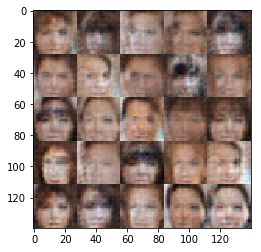

Epoch 2/2... Discriminator Loss: 0.9774... Generator Loss: 0.8916
Epoch 2/2... Discriminator Loss: 0.6831... Generator Loss: 1.6238
Epoch 2/2... Discriminator Loss: 0.8559... Generator Loss: 1.0546
Epoch 2/2... Discriminator Loss: 0.6276... Generator Loss: 1.7019
Epoch 2/2... Discriminator Loss: 1.1514... Generator Loss: 0.6973
Epoch 2/2... Discriminator Loss: 1.0921... Generator Loss: 5.0938
Epoch 2/2... Discriminator Loss: 0.7692... Generator Loss: 1.2319
Epoch 2/2... Discriminator Loss: 0.7105... Generator Loss: 1.4797
Epoch 2/2... Discriminator Loss: 0.7044... Generator Loss: 1.3608
Epoch 2/2... Discriminator Loss: 2.6913... Generator Loss: 0.1428


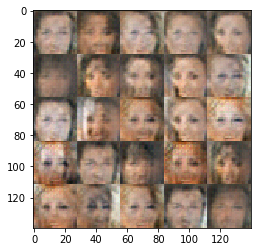

Epoch 2/2... Discriminator Loss: 0.6954... Generator Loss: 3.4651
Epoch 2/2... Discriminator Loss: 1.8807... Generator Loss: 0.3040
Epoch 2/2... Discriminator Loss: 0.6040... Generator Loss: 1.6487
Epoch 2/2... Discriminator Loss: 0.6208... Generator Loss: 3.3819
Epoch 2/2... Discriminator Loss: 1.0698... Generator Loss: 5.9516
Epoch 2/2... Discriminator Loss: 0.6009... Generator Loss: 2.1475
Epoch 2/2... Discriminator Loss: 0.6062... Generator Loss: 1.8932
Epoch 2/2... Discriminator Loss: 0.6835... Generator Loss: 1.4446
Epoch 2/2... Discriminator Loss: 0.6214... Generator Loss: 1.8049
Epoch 2/2... Discriminator Loss: 1.2247... Generator Loss: 0.7219


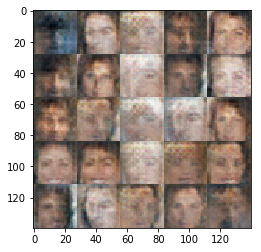

Epoch 2/2... Discriminator Loss: 0.5090... Generator Loss: 2.1571
Epoch 2/2... Discriminator Loss: 1.4922... Generator Loss: 0.4695
Epoch 2/2... Discriminator Loss: 2.1682... Generator Loss: 5.2679
Epoch 2/2... Discriminator Loss: 0.7523... Generator Loss: 1.5867
Epoch 2/2... Discriminator Loss: 0.8091... Generator Loss: 4.6420
Epoch 2/2... Discriminator Loss: 1.2252... Generator Loss: 0.7868
Epoch 2/2... Discriminator Loss: 1.4080... Generator Loss: 0.8614
Epoch 2/2... Discriminator Loss: 2.5179... Generator Loss: 8.1502
Epoch 2/2... Discriminator Loss: 1.0038... Generator Loss: 0.8793
Epoch 2/2... Discriminator Loss: 0.5452... Generator Loss: 2.2640


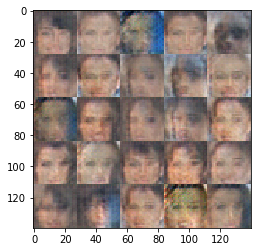

Epoch 2/2... Discriminator Loss: 0.7094... Generator Loss: 4.3221
Epoch 2/2... Discriminator Loss: 1.5181... Generator Loss: 6.9416
Epoch 2/2... Discriminator Loss: 0.5802... Generator Loss: 1.8419
Epoch 2/2... Discriminator Loss: 0.5813... Generator Loss: 1.7142
Epoch 2/2... Discriminator Loss: 0.4984... Generator Loss: 2.2546
Epoch 2/2... Discriminator Loss: 0.6592... Generator Loss: 1.7366
Epoch 2/2... Discriminator Loss: 0.6767... Generator Loss: 1.5427
Epoch 2/2... Discriminator Loss: 1.1421... Generator Loss: 0.7966
Epoch 2/2... Discriminator Loss: 0.8404... Generator Loss: 1.0972
Epoch 2/2... Discriminator Loss: 0.3898... Generator Loss: 3.6209


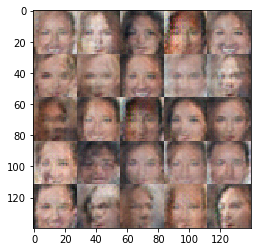

Epoch 2/2... Discriminator Loss: 0.7437... Generator Loss: 2.1194
Epoch 2/2... Discriminator Loss: 0.5397... Generator Loss: 2.2523
Epoch 2/2... Discriminator Loss: 0.8294... Generator Loss: 1.1176
Epoch 2/2... Discriminator Loss: 0.6613... Generator Loss: 2.8007
Epoch 2/2... Discriminator Loss: 1.0617... Generator Loss: 4.4236
Epoch 2/2... Discriminator Loss: 1.1993... Generator Loss: 0.8700
Epoch 2/2... Discriminator Loss: 0.6246... Generator Loss: 2.0108
Epoch 2/2... Discriminator Loss: 0.5496... Generator Loss: 2.0751
Epoch 2/2... Discriminator Loss: 0.6212... Generator Loss: 2.0967
Epoch 2/2... Discriminator Loss: 0.5980... Generator Loss: 2.1669


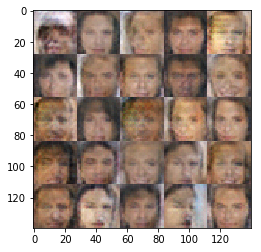

Epoch 2/2... Discriminator Loss: 0.8973... Generator Loss: 1.2276
Epoch 2/2... Discriminator Loss: 0.5533... Generator Loss: 2.2216
Epoch 2/2... Discriminator Loss: 0.7293... Generator Loss: 1.9772
Epoch 2/2... Discriminator Loss: 0.6057... Generator Loss: 2.1779
Epoch 2/2... Discriminator Loss: 0.5641... Generator Loss: 1.9490
Epoch 2/2... Discriminator Loss: 0.6761... Generator Loss: 1.5796
Epoch 2/2... Discriminator Loss: 0.9291... Generator Loss: 3.1003
Epoch 2/2... Discriminator Loss: 0.5453... Generator Loss: 2.1204
Epoch 2/2... Discriminator Loss: 1.6234... Generator Loss: 0.4389
Epoch 2/2... Discriminator Loss: 0.6644... Generator Loss: 1.7058


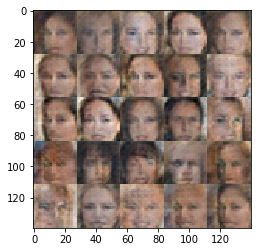

Epoch 2/2... Discriminator Loss: 0.5929... Generator Loss: 2.0697
Epoch 2/2... Discriminator Loss: 0.4645... Generator Loss: 3.7444
Epoch 2/2... Discriminator Loss: 0.7998... Generator Loss: 1.6274
Epoch 2/2... Discriminator Loss: 0.6236... Generator Loss: 2.8344
Epoch 2/2... Discriminator Loss: 0.7261... Generator Loss: 1.6141
Epoch 2/2... Discriminator Loss: 0.5798... Generator Loss: 1.8452
Epoch 2/2... Discriminator Loss: 0.7256... Generator Loss: 3.1551
Epoch 2/2... Discriminator Loss: 1.3639... Generator Loss: 0.5407
Epoch 2/2... Discriminator Loss: 0.6435... Generator Loss: 2.3359
Epoch 2/2... Discriminator Loss: 0.6341... Generator Loss: 1.8869


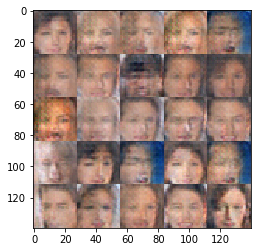

Epoch 2/2... Discriminator Loss: 0.6547... Generator Loss: 1.7614
Epoch 2/2... Discriminator Loss: 0.6267... Generator Loss: 1.9890
Epoch 2/2... Discriminator Loss: 0.5739... Generator Loss: 2.0712
Epoch 2/2... Discriminator Loss: 1.1895... Generator Loss: 4.9059
Epoch 2/2... Discriminator Loss: 0.8387... Generator Loss: 1.2701
Epoch 2/2... Discriminator Loss: 0.6144... Generator Loss: 2.5553
Epoch 2/2... Discriminator Loss: 0.6326... Generator Loss: 2.1314
Epoch 2/2... Discriminator Loss: 0.7451... Generator Loss: 1.3056
Epoch 2/2... Discriminator Loss: 1.5424... Generator Loss: 0.4441
Epoch 2/2... Discriminator Loss: 0.5810... Generator Loss: 1.8156


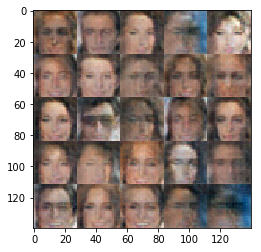

Epoch 2/2... Discriminator Loss: 1.0927... Generator Loss: 5.3000
Epoch 2/2... Discriminator Loss: 1.4935... Generator Loss: 0.4901
Epoch 2/2... Discriminator Loss: 0.6118... Generator Loss: 1.8557
Epoch 2/2... Discriminator Loss: 0.8345... Generator Loss: 1.1505
Epoch 2/2... Discriminator Loss: 0.7145... Generator Loss: 1.3727
Epoch 2/2... Discriminator Loss: 0.6879... Generator Loss: 2.0562
Epoch 2/2... Discriminator Loss: 0.6660... Generator Loss: 2.1450
Epoch 2/2... Discriminator Loss: 0.9152... Generator Loss: 1.0503
Epoch 2/2... Discriminator Loss: 0.5932... Generator Loss: 2.5465
Epoch 2/2... Discriminator Loss: 0.7730... Generator Loss: 1.3651


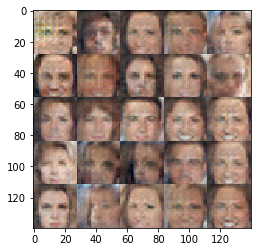

Epoch 2/2... Discriminator Loss: 0.6316... Generator Loss: 1.7237
Epoch 2/2... Discriminator Loss: 0.8781... Generator Loss: 4.2152
Epoch 2/2... Discriminator Loss: 0.7749... Generator Loss: 1.8313
Epoch 2/2... Discriminator Loss: 0.6390... Generator Loss: 1.7456
Epoch 2/2... Discriminator Loss: 0.7179... Generator Loss: 2.0026
Epoch 2/2... Discriminator Loss: 0.9135... Generator Loss: 1.0259
Epoch 2/2... Discriminator Loss: 0.6016... Generator Loss: 2.3098
Epoch 2/2... Discriminator Loss: 0.5456... Generator Loss: 2.1831
Epoch 2/2... Discriminator Loss: 1.0006... Generator Loss: 0.8559
Epoch 2/2... Discriminator Loss: 0.9501... Generator Loss: 1.0231


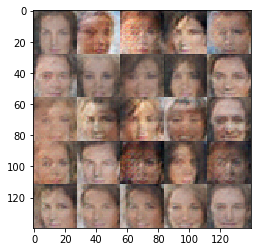

Epoch 2/2... Discriminator Loss: 0.9008... Generator Loss: 3.8333
Epoch 2/2... Discriminator Loss: 0.8195... Generator Loss: 1.1269
Epoch 2/2... Discriminator Loss: 1.7013... Generator Loss: 0.4066
Epoch 2/2... Discriminator Loss: 0.8919... Generator Loss: 0.9888
Epoch 2/2... Discriminator Loss: 0.7720... Generator Loss: 1.2415
Epoch 2/2... Discriminator Loss: 0.5764... Generator Loss: 2.3408
Epoch 2/2... Discriminator Loss: 1.0616... Generator Loss: 3.9543
Epoch 2/2... Discriminator Loss: 1.2683... Generator Loss: 0.5962
Epoch 2/2... Discriminator Loss: 0.7143... Generator Loss: 1.3512
Epoch 2/2... Discriminator Loss: 0.4964... Generator Loss: 2.1715


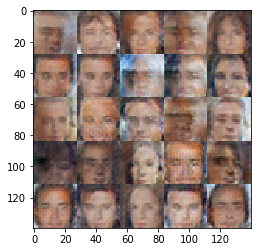

Epoch 2/2... Discriminator Loss: 0.4660... Generator Loss: 2.6090
Epoch 2/2... Discriminator Loss: 0.7094... Generator Loss: 1.8331
Epoch 2/2... Discriminator Loss: 0.7832... Generator Loss: 2.1249
Epoch 2/2... Discriminator Loss: 0.4628... Generator Loss: 2.7042
Epoch 2/2... Discriminator Loss: 0.5273... Generator Loss: 2.4698
Epoch 2/2... Discriminator Loss: 0.6633... Generator Loss: 1.6679
Epoch 2/2... Discriminator Loss: 0.7885... Generator Loss: 1.3020
Epoch 2/2... Discriminator Loss: 1.0693... Generator Loss: 0.7532
Epoch 2/2... Discriminator Loss: 0.7230... Generator Loss: 1.4037
Epoch 2/2... Discriminator Loss: 0.8404... Generator Loss: 1.0816


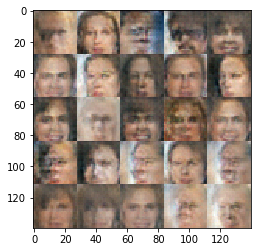

Epoch 2/2... Discriminator Loss: 0.8621... Generator Loss: 1.2514
Epoch 2/2... Discriminator Loss: 0.5301... Generator Loss: 2.0625
Epoch 2/2... Discriminator Loss: 0.6968... Generator Loss: 1.8552
Epoch 2/2... Discriminator Loss: 1.3265... Generator Loss: 4.4309
Epoch 2/2... Discriminator Loss: 1.8805... Generator Loss: 4.8774
Epoch 2/2... Discriminator Loss: 0.8681... Generator Loss: 1.0026


In [30]:
tf.reset_default_graph() 

batch_size = 128
z_dim = 1024
learning_rate = 0.00075
beta1 = 0.5

# alpha=0.1
# four convolutional layers in the DCGAN

epochs = 2

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

OK. After two epochs we don't see much improvement in image quality - they are still blurry compared to the originals.
But still many of them are recognizable as faces:


Epoch 2/2... Discriminator Loss: 0.6316... Generator Loss: 1.7237
Epoch 2/2... Discriminator Loss: 0.8781... Generator Loss: 4.2152
Epoch 2/2... Discriminator Loss: 0.7749... Generator Loss: 1.8313
Epoch 2/2... Discriminator Loss: 0.6390... Generator Loss: 1.7456
Epoch 2/2... Discriminator Loss: 0.7179... Generator Loss: 2.0026
Epoch 2/2... Discriminator Loss: 0.9135... Generator Loss: 1.0259
Epoch 2/2... Discriminator Loss: 0.6016... Generator Loss: 2.3098
Epoch 2/2... Discriminator Loss: 0.5456... Generator Loss: 2.1831
Epoch 2/2... Discriminator Loss: 1.0006... Generator Loss: 0.8559
Epoch 2/2... Discriminator Loss: 0.9501... Generator Loss: 1.0231
        
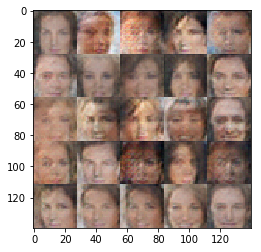

Probably after 5-6 epochs we can hope for something better. But already this exercise pushed my laptop to its limits.
Fine tuning of hyper parameters for both DCGANs with 3 and 4 convolutional layers is needed, but for 4-layer Net it seems hardly possible with my current laptop.

One more sample of images from the latest exercise:

Epoch 2/2... Discriminator Loss: 1.0927... Generator Loss: 5.3000
Epoch 2/2... Discriminator Loss: 1.4935... Generator Loss: 0.4901
Epoch 2/2... Discriminator Loss: 0.6118... Generator Loss: 1.8557
Epoch 2/2... Discriminator Loss: 0.8345... Generator Loss: 1.1505
Epoch 2/2... Discriminator Loss: 0.7145... Generator Loss: 1.3727
Epoch 2/2... Discriminator Loss: 0.6879... Generator Loss: 2.0562
Epoch 2/2... Discriminator Loss: 0.6660... Generator Loss: 2.1450
Epoch 2/2... Discriminator Loss: 0.9152... Generator Loss: 1.0503
Epoch 2/2... Discriminator Loss: 0.5932... Generator Loss: 2.5465
Epoch 2/2... Discriminator Loss: 0.7730... Generator Loss: 1.3651

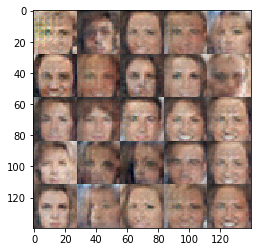